In [11]:
import torch
import torch.nn as nn
import torch.nn.functional as F
# train_emonet_custom.py
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import numpy as np
import pandas as pd
import os
import argparse
from pathlib import Path
from tqdm import tqdm
import cv2
import matplotlib.pyplot as plt


# ❌ REMOVE THIS LINE!
# nn.InstanceNorm2d = nn.BatchNorm2d

def conv3x3(in_planes, out_planes, strd=1, padding=1, bias=False):
    return nn.Conv2d(in_planes, out_planes, kernel_size=3,
                     stride=strd, padding=padding, bias=bias)

class ConvBlock(nn.Module):
    def __init__(self, in_planes, out_planes):
        super(ConvBlock, self).__init__()
        # Use proper InstanceNorm or GroupNorm
        self.bn1 = nn.GroupNorm(num_groups=min(32, in_planes), num_channels=in_planes)
        self.conv1 = conv3x3(in_planes, int(out_planes / 2))
        self.bn2 = nn.GroupNorm(num_groups=min(32, int(out_planes / 2)), num_channels=int(out_planes / 2))
        self.conv2 = conv3x3(int(out_planes / 2), int(out_planes / 4))
        self.bn3 = nn.GroupNorm(num_groups=min(32, int(out_planes / 4)), num_channels=int(out_planes / 4))
        self.conv3 = conv3x3(int(out_planes / 4), int(out_planes / 4))

        if in_planes != out_planes:
            self.downsample = nn.Sequential(
                nn.GroupNorm(num_groups=min(32, in_planes), num_channels=in_planes),
                nn.ReLU(True),
                nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=1, bias=False),
            )
        else:
            self.downsample = None

    def forward(self, x):
        residual = x
        out1 = self.bn1(x)
        out1 = F.relu(out1, True)
        out1 = self.conv1(out1)

        out2 = self.bn2(out1)
        out2 = F.relu(out2, True)
        out2 = self.conv2(out2)

        out3 = self.bn3(out2)
        out3 = F.relu(out3, True)
        out3 = self.conv3(out3)

        out3 = torch.cat((out1, out2, out3), 1)

        if self.downsample is not None:
            residual = self.downsample(residual)

        out3 += residual
        return out3

class HourGlass(nn.Module):
    def __init__(self, num_modules, depth, num_features):
        super(HourGlass, self).__init__()
        self.num_modules = num_modules
        self.depth = depth
        self.features = num_features
        self._generate_network(self.depth)

    def _generate_network(self, level):
        self.add_module('b1_' + str(level), ConvBlock(256, 256))
        self.add_module('b2_' + str(level), ConvBlock(256, 256))

        if level > 1:
            self._generate_network(level - 1)
        else:
            self.add_module('b2_plus_' + str(level), ConvBlock(256, 256))

        self.add_module('b3_' + str(level), ConvBlock(256, 256))

    def _forward(self, level, inp):
        up1 = inp
        up1 = self._modules['b1_' + str(level)](up1)

        low1 = F.max_pool2d(inp, 2, stride=2)
        low1 = self._modules['b2_' + str(level)](low1)

        if level > 1:
            low2 = self._forward(level - 1, low1)
        else:
            low2 = low1
            low2 = self._modules['b2_plus_' + str(level)](low2)

        low3 = low2
        low3 = self._modules['b3_' + str(level)](low3)
        up2 = F.interpolate(low3, scale_factor=2, mode='nearest') 
        return up1 + up2

    def forward(self, x):
        return self._forward(self.depth, x)

class EmoNetModified(nn.Module):
    def __init__(self, num_modules=2, n_expression=26, n_reg=2, n_blocks=4, attention=True):
        super(EmoNetModified, self).__init__()
        self.num_modules = num_modules
        self.n_expression = n_expression
        self.n_reg = n_reg
        self.attention = attention
            
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3)
        self.bn1 = nn.GroupNorm(num_groups=32, num_channels=64)
        self.conv2 = ConvBlock(64, 128)
        self.conv3 = ConvBlock(128, 128)
        self.conv4 = ConvBlock(128, 256)

        for hg_module in range(self.num_modules):
            self.add_module('m' + str(hg_module), HourGlass(1, 4, 256))
            self.add_module('top_m_' + str(hg_module), ConvBlock(256, 256))
            self.add_module('conv_last' + str(hg_module),
                            nn.Conv2d(256, 256, kernel_size=1, stride=1, padding=0))
            self.add_module('bn_end' + str(hg_module), nn.GroupNorm(num_groups=32, num_channels=256))
            self.add_module('l' + str(hg_module), nn.Conv2d(256, 68, kernel_size=1, stride=1, padding=0))

            if hg_module < self.num_modules - 1:
                self.add_module('bl' + str(hg_module), nn.Conv2d(256, 256, kernel_size=1, stride=1, padding=0))
                self.add_module('al' + str(hg_module), nn.Conv2d(68, 256, kernel_size=1, stride=1, padding=0))

        if self.attention:
            n_in_features = 256*(num_modules+1)
        else:
            n_in_features = 256*(num_modules+1)+68
        
        n_features = [(256, 256)]*(n_blocks)

        self.emo_convs = []
        self.conv1x1_input_emo_2 = nn.Conv2d(n_in_features, 256, kernel_size=1, stride=1, padding=0)
        for in_f, out_f in n_features:
            self.emo_convs.append(ConvBlock(in_f, out_f))
            self.emo_convs.append(nn.MaxPool2d(2,2))
        self.emo_net_2 = nn.Sequential(*self.emo_convs)
        self.avg_pool_2 = nn.AvgPool2d(4)
        
        # Separate feature extractor and heads
        self.emo_fc_shared = nn.Sequential(
            nn.Linear(256, 128), 
            nn.BatchNorm1d(128), 
            nn.ReLU(inplace=True),
            nn.Dropout(0.3)  # Add dropout for regularization
        )
        
        # Separate heads for better learning
        self.emotion_head = nn.Linear(128, self.n_expression)
        self.valence_head = nn.Linear(128, 1)
        self.arousal_head = nn.Linear(128, 1)

    def forward(self, x):
        device = x.device

        x = F.relu(self.bn1(self.conv1(x)), True)
        x = F.max_pool2d(self.conv2(x), 2, stride=2)
        x = self.conv3(x)
        x = self.conv4(x)

        previous = x
        hg_features = []

        for i in range(self.num_modules):
            hg = self._modules['m' + str(i)](previous)
            ll = hg
            ll = self._modules['top_m_' + str(i)](ll)
            ll = F.relu(self._modules['bn_end' + str(i)]
                        (self._modules['conv_last' + str(i)](ll)), True)
            tmp_out = self._modules['l' + str(i)](ll)

            if i < self.num_modules - 1:
                ll = self._modules['bl' + str(i)](ll)
                tmp_out_ = self._modules['al' + str(i)](tmp_out)
                previous = previous + ll + tmp_out_

            hg_features.append(ll)

        hg_features_cat = torch.cat(tuple(hg_features), dim=1)

        if self.attention:
            # Fixed attention mechanism
            mask = torch.sum(tmp_out, dim=1, keepdim=True)
            mask = torch.sigmoid(mask)  # ✓ Bound to [0, 1]
            hg_features_cat = hg_features_cat * mask
            emo_feat = torch.cat((x, hg_features_cat), dim=1)
        else:
            emo_feat = torch.cat([x, hg_features_cat, tmp_out], dim=1)
        
        emo_feat_conv1D = self.conv1x1_input_emo_2(emo_feat)
        final_features = self.emo_net_2(emo_feat_conv1D)
        final_features = self.avg_pool_2(final_features)
        batch_size = final_features.shape[0]
        final_features = final_features.view(batch_size, -1)
        
        # Shared features
        shared_features = self.emo_fc_shared(final_features)
        
        # Separate heads with proper activation
        emotion_logits = self.emotion_head(shared_features)
        valence = torch.tanh(self.valence_head(shared_features)).squeeze(1)  # [-1, 1]
        arousal = torch.tanh(self.arousal_head(shared_features)).squeeze(1)  # [-1, 1]

        return {
            'heatmap': tmp_out, 
            'expression': emotion_logits, 
            'valence': valence, 
            'arousal': arousal
        }

    def freeze_backbone(self):
        """Freeze everything except the final heads"""
        for name, param in self.named_parameters():
            if 'emotion_head' not in name and 'valence_head' not in name and 'arousal_head' not in name and 'emo_fc_shared' not in name:
                param.requires_grad = False
        
        print("✓ Frozen backbone - only training final heads")

In [12]:
import csv
import matplotlib.pyplot as plt

# Dataset class - updated to use normalized values
EMOTION_CLASSES = {
    0: "Peace", 1: "Affection", 2: "Esteem", 3: "Anticipation", 4: "Engagement",
    5: "Confidence", 6: "Happiness", 7: "Pleasure", 8: "Excitement", 9: "Surprise",
    10: "Sympathy", 11: "Doubt/Confusion", 12: "Disconnection", 13: "Fatigue",
    14: "Embarrassment", 15: "Yearning", 16: "Disapproval", 17: "Aversion",
    18: "Annoyance", 19: "Anger", 20: "Sensitivity", 21: "Sadness",
    22: "Disquietment", 23: "Fear", 24: "Pain", 25: "Suffering"
}

EMOTION_COLUMNS = [
    'Peace', 'Affection', 'Esteem', 'Anticipation', 'Engagement',
    'Confidence', 'Happiness', 'Pleasure', 'Excitement', 'Surprise',
    'Sympathy', 'Doubt/Confusion', 'Disconnection', 'Fatigue',
    'Embarrassment', 'Yearning', 'Disapproval', 'Aversion',
    'Annoyance', 'Anger', 'Sensitivity', 'Sadness',
    'Disquietment', 'Fear', 'Pain', 'Suffering'
]

class KaggleEmotionDataset(Dataset):
    def __init__(self, csv_file, img_arrays_dir, image_size=256, transform=None, is_multi_label=True, max_samples=None):
        print("csv_file: ", csv_file)
        print("ello")
        with open(csv_file, newline='') as csvfile:
            reader = csv.reader(csvfile)
            csv_data = list(reader)

        
        # First row is the header
        header = csv_data[0]
        rows = csv_data[1:]
        
        # Now convert to DataFrame
        self.data = pd.DataFrame(rows, columns=header)

        # self.data = pd.read_csv(csv_file)
        self.img_arrays_dir = Path(img_arrays_dir)
        self.image_size = image_size
        self.transform = transform
        self.is_multi_label = is_multi_label
        
        # Clean data - drop rows with missing Crop_name, Valence_norm, or Arousal_norm
        self.data = self.data.dropna(subset=['Crop_name', 'Valence_norm', 'Arousal_norm']).reset_index(drop=True)
        
        # Limit samples for faster experimentation in Kaggle
        if max_samples:
            self.data = self.data.head(max_samples)
        
        print(f"Dataset loaded: {len(self.data)} samples")
        print(f"Valence_norm range: [{self.data['Valence_norm'].min()}, {self.data['Valence_norm'].max()}]")
        print(f"Arousal_norm range: [{self.data['Arousal_norm'].min()}, {self.data['Arousal_norm'].max()}]")
        
        # Check if img_arrays_dir exists
        if not self.img_arrays_dir.exists():
            print(f"Warning: {self.img_arrays_dir} does not exist!")
            
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        crop_name = row['Crop_name']
        img_path = self.img_arrays_dir / crop_name
        
        try:
            # Load numpy array
            img_array = np.load(str(img_path))
            
            # Handle different shapes
            if len(img_array.shape) == 3 and img_array.shape[0] == 3:
                img_array = img_array.transpose(1, 2, 0)
            
            # Ensure uint8 and [0, 255]
            if img_array.max() <= 1.0:
                img_array = (img_array * 255).astype(np.uint8)
            else:
                img_array = img_array.astype(np.uint8)
            
            # Resize
            image = cv2.resize(img_array, (self.image_size, self.image_size))
            
            # To tensor
            image_tensor = torch.FloatTensor(image).permute(2, 0, 1) / 255.0
            
            if self.transform:
                image_tensor = self.transform(image_tensor)
            
            # Get emotion labels
            emotion_labels = torch.FloatTensor([float(row[emotion]) for emotion in EMOTION_COLUMNS])
            
            # Single vs multi-label
            if not self.is_multi_label:
                emotion_class = torch.argmax(emotion_labels).long()
            else:
                emotion_class = emotion_labels
            
            # Use normalized valence and arousal (already in -1 to 1 range)
            valence = torch.FloatTensor([float(row['Valence_norm'])])[0]
            arousal = torch.FloatTensor([float(row['Arousal_norm'])])[0]
            
            return {
                'image': image_tensor,
                'emotion': emotion_class,
                'emotion_multi': emotion_labels,
                'valence': valence,
                'arousal': arousal,
                'filename': crop_name
            }
            
        except Exception as e:
            # Return dummy for failed loads
            print(f"Failed to load {crop_name}: {e}")
            dummy_image = torch.zeros(3, self.image_size, self.image_size)
            dummy_emotion = torch.zeros(26)
            return {
                'image': dummy_image,
                'emotion': torch.LongTensor([0])[0] if not self.is_multi_label else dummy_emotion,
                'emotion_multi': dummy_emotion,
                'valence': torch.FloatTensor([0.0])[0],
                'arousal': torch.FloatTensor([0.0])[0],
                'filename': 'dummy'
            }

print("Dataset class loaded successfully!")

from sklearn.metrics import f1_score, jaccard_score, hamming_loss, accuracy_score

def compute_multi_label_metrics(y_true, y_pred, threshold=0.5):
    """
    Compute comprehensive multi-label metrics
    
    Args:
        y_true: ground truth labels (batch_size, num_classes)
        y_pred: predicted logits (batch_size, num_classes)
        threshold: threshold for converting probabilities to binary predictions
    """
    
    # Convert to numpy and apply threshold
    y_true_np = y_true.cpu().numpy()
    y_pred_probs = torch.sigmoid(y_pred).cpu().numpy()
    y_pred_binary = (y_pred_probs > threshold).astype(int)
    
    metrics = {}
    
    # F1 Scores (most important for multi-label)
    metrics['f1_micro'] = f1_score(y_true_np, y_pred_binary, average='micro', zero_division=0)
    metrics['f1_macro'] = f1_score(y_true_np, y_pred_binary, average='macro', zero_division=0)
    metrics['f1_weighted'] = f1_score(y_true_np, y_pred_binary, average='weighted', zero_division=0)
    metrics['f1_samples'] = f1_score(y_true_np, y_pred_binary, average='samples', zero_division=0)
    
    # Jaccard Score (IoU for multi-label)
    metrics['jaccard'] = jaccard_score(y_true_np, y_pred_binary, average='samples', zero_division=0)
    
    # Hamming Loss (fraction of wrong labels)
    metrics['hamming_loss'] = hamming_loss(y_true_np, y_pred_binary)
    
    # Subset Accuracy (your current "exact match" accuracy)
    metrics['exact_match'] = accuracy_score(y_true_np, y_pred_binary)
    
    # Per-label accuracy (more lenient)
    metrics['label_accuracy'] = (y_true_np == y_pred_binary).mean()
    
    return metrics

# Add this helper for per-class F1 scores
def compute_per_class_f1(y_true, y_pred, emotion_names, threshold=0.5):
    """Compute F1 score for each emotion class"""
    y_true_np = y_true.cpu().numpy()
    y_pred_probs = torch.sigmoid(y_pred).cpu().numpy()
    y_pred_binary = (y_pred_probs > threshold).astype(int)
    
    per_class_f1 = {}
    for idx, emotion in enumerate(emotion_names):
        f1 = f1_score(y_true_np[:, idx], y_pred_binary[:, idx], zero_division=0)
        per_class_f1[emotion] = f1
    
    return per_class_f1
def emergency_diagnosis(model, val_loader, device):
    """Check what's happening with predictions"""
    model.eval()
    
    all_probs = []
    all_preds_05 = []
    all_labels = []
    
    with torch.no_grad():
        for batch in val_loader:
            images = batch['image'].to(device)
            labels = batch['emotion_multi'].to(device)
            
            outputs = model(images)
            probs = torch.sigmoid(outputs['expression'])
            preds = (probs > 0.5).float()
            
            all_probs.append(probs)
            all_preds_05.append(preds)
            all_labels.append(labels)
    
    all_probs = torch.cat(all_probs, dim=0)
    all_preds_05 = torch.cat(all_preds_05, dim=0)
    all_labels = torch.cat(all_labels, dim=0)
    
    print("\n" + "="*70)
    print("🚨 EMERGENCY DIAGNOSIS - WHY DID F1 COLLAPSE?")
    print("="*70)
    
    # 1. Probability distribution
    print(f"\n1️⃣  Output Probability Statistics:")
    print(f"   Min:    {all_probs.min():.6f}")
    print(f"   Max:    {all_probs.max():.6f}")
    print(f"   Mean:   {all_probs.mean():.6f}")
    print(f"   Median: {all_probs.median():.6f}")
    print(f"   Std:    {all_probs.std():.6f}")
    
    # 2. How many predictions at threshold 0.5
    preds_per_sample = all_preds_05.sum(dim=1)
    labels_per_sample = all_labels.sum(dim=1)
    
    print(f"\n2️⃣  Predictions per Sample (threshold=0.5):")
    print(f"   Predicted - Min: {preds_per_sample.min():.0f}, "
          f"Max: {preds_per_sample.max():.0f}, "
          f"Mean: {preds_per_sample.mean():.2f}, "
          f"Median: {preds_per_sample.median():.0f}")
    print(f"   True      - Min: {labels_per_sample.min():.0f}, "
          f"Max: {labels_per_sample.max():.0f}, "
          f"Mean: {labels_per_sample.mean():.2f}, "
          f"Median: {labels_per_sample.median():.0f}")
    
    # 3. Check prediction collapse
    zero_preds = (preds_per_sample == 0).sum().item()
    total_samples = len(preds_per_sample)
    
    print(f"\n3️⃣  Prediction Collapse Check:")
    print(f"   Samples with ZERO predictions: {zero_preds}/{total_samples} ({100*zero_preds/total_samples:.1f}%)")
    print(f"   Samples with 1-2 predictions:  {((preds_per_sample >= 1) & (preds_per_sample <= 2)).sum()}")
    print(f"   Samples with 3+ predictions:   {(preds_per_sample >= 3).sum()}")
    
    if zero_preds / total_samples > 0.5:
        print(f"   ⚠️  WARNING: >50% of samples have NO predictions!")
    
    # 4. Threshold sensitivity analysis
    print(f"\n4️⃣  Threshold Sensitivity:")
    for thresh in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]:
        preds_t = (all_probs > thresh).float()
        avg_preds = preds_t.sum(dim=1).mean()
        f1_t = f1_score(
            all_labels.cpu().numpy(), 
            preds_t.cpu().numpy(), 
            average='micro', 
            zero_division=0
        )
        print(f"   Threshold {thresh:.1f}: Avg {avg_preds:.2f} emotions/sample, F1: {f1_t:.4f}")
    
    # 5. Per-class prediction counts
    print(f"\n5️⃣  Top 10 Most/Least Predicted Emotions:")
    pred_counts = all_preds_05.sum(dim=0).cpu().numpy()
    true_counts = all_labels.sum(dim=0).cpu().numpy()
    
    emotion_stats = []
    for idx, emotion in enumerate(EMOTION_COLUMNS):
        emotion_stats.append((emotion, pred_counts[idx], true_counts[idx]))
    
    emotion_stats.sort(key=lambda x: x[1], reverse=True)
    
    print(f"\n   Most Predicted:")
    for emotion, pred, true in emotion_stats[:5]:
        print(f"   {emotion:20s}: Predicted {pred:5.0f}, True {true:5.0f} (ratio: {pred/(true+1e-5):.2f})")
    
    print(f"\n   Least Predicted:")
    for emotion, pred, true in emotion_stats[-5:]:
        print(f"   {emotion:20s}: Predicted {pred:5.0f}, True {true:5.0f} (ratio: {pred/(true+1e-5):.2f})")
    
    # 6. Distribution shift check
    print(f"\n6️⃣  Distribution Statistics:")
    print(f"   % of probabilities > 0.5: {(all_probs > 0.5).float().mean()*100:.2f}%")
    print(f"   % of probabilities > 0.3: {(all_probs > 0.3).float().mean()*100:.2f}%")
    print(f"   % of probabilities > 0.1: {(all_probs > 0.1).float().mean()*100:.2f}%")
    print(f"   % of probabilities < 0.1: {(all_probs < 0.1).float().mean()*100:.2f}%")
    
    print("="*70 + "\n")

# Run this after Epoch 2
print("\n🔍 Running emergency diagnosis...")
def compute_metrics_optimal_threshold(y_true, y_pred):
    """
    Compute metrics with multiple threshold strategies
    Returns both top-k and optimal threshold metrics
    """
    y_true_np = y_true.cpu().numpy()
    y_pred_probs = torch.sigmoid(y_pred).cpu().numpy()
    
    # Strategy 1: Top-K prediction (RECOMMENDED for deployment)
    avg_true_labels = y_true_np.sum(axis=1).mean()
    k = max(1, int(np.round(avg_true_labels)))
    
    y_pred_topk = np.zeros_like(y_pred_probs)
    for i in range(len(y_pred_probs)):
        top_k_indices = np.argpartition(y_pred_probs[i], -k)[-k:]
        y_pred_topk[i, top_k_indices] = 1
    
    # Strategy 2: Optimal threshold search (for analysis)
    best_f1 = 0
    best_thresh = 0.5
    for thresh in np.arange(0.1, 0.7, 0.05):
        y_pred_thresh = (y_pred_probs >= thresh).astype(int)
        f1 = f1_score(y_true_np, y_pred_thresh, average='micro', zero_division=0)
        if f1 > best_f1:
            best_f1 = f1
            best_thresh = thresh
    
    y_pred_optimal = (y_pred_probs >= best_thresh).astype(int)
    
    # Compute all metrics
    metrics = {
        # Top-K strategy (primary)
        'f1_micro_topk': f1_score(y_true_np, y_pred_topk, average='micro', zero_division=0),
        'f1_macro_topk': f1_score(y_true_np, y_pred_topk, average='macro', zero_division=0),
        'jaccard_topk': jaccard_score(y_true_np, y_pred_topk, average='samples', zero_division=0),
        
        # Optimal threshold strategy
        'f1_micro_opt': f1_score(y_true_np, y_pred_optimal, average='micro', zero_division=0),
        'f1_macro_opt': f1_score(y_true_np, y_pred_optimal, average='macro', zero_division=0),
        'jaccard_opt': jaccard_score(y_true_np, y_pred_optimal, average='samples', zero_division=0),
        
        # Legacy (threshold=0.5) - for comparison
        'f1_micro_050': f1_score(y_true_np, (y_pred_probs >= 0.5).astype(int), average='micro', zero_division=0),
        
        # Metadata
        'best_threshold': best_thresh,
        'avg_pred_topk': y_pred_topk.sum(axis=1).mean(),
        'avg_pred_opt': y_pred_optimal.sum(axis=1).mean(),
        'avg_true': avg_true_labels,
        
        # Standard metrics
        'exact_match': accuracy_score(y_true_np, y_pred_topk),
        'hamming_loss': hamming_loss(y_true_np, y_pred_topk),
    }
    
    return metrics


def print_metrics_comprehensive(metrics, split_name="Val"):
    """Print metrics in organized format"""
    print(f"\n{split_name} Metrics:")
    print("="*70)
    
    print(f"\n  📊 Top-K Strategy (k={metrics.get('avg_pred_topk', 0):.1f}) - PRIMARY:")
    print(f"     F1 Micro:  {metrics['f1_micro_topk']:.4f}")
    print(f"     F1 Macro:  {metrics['f1_macro_topk']:.4f}")
    print(f"     Jaccard:   {metrics['jaccard_topk']:.4f}")
    
    print(f"\n  🎯 Optimal Threshold (thresh={metrics.get('best_threshold', 0):.2f}):")
    print(f"     F1 Micro:  {metrics['f1_micro_opt']:.4f}")
    print(f"     F1 Macro:  {metrics['f1_macro_opt']:.4f}")
    print(f"     Jaccard:   {metrics['jaccard_opt']:.4f}")
    
    print(f"\n  📉 Fixed Threshold (0.5) - Reference:")
    print(f"     F1 Micro:  {metrics['f1_micro_050']:.4f}")
    
    # Color-coded assessment
    f1_score_val = metrics['f1_micro_topk']
    if f1_score_val > 0.50:
        status = "🟢 GOOD"
    elif f1_score_val > 0.35:
        status = "🟡 MODERATE"
    else:
        status = "🔴 NEEDS WORK"
    
    print(f"\n  {status} - Primary metric (Top-K F1): {f1_score_val:.4f}")
    print("="*70)


def compute_per_class_f1(y_true, y_pred, emotion_names, threshold=0.3):
    """Compute F1 score for each emotion class"""
    y_true_np = y_true.cpu().numpy()
    y_pred_probs = torch.sigmoid(y_pred).cpu().numpy()
    y_pred_binary = (y_pred_probs > threshold).astype(int)
    
    per_class_f1 = {}
    for idx, emotion in enumerate(emotion_names):
        f1 = f1_score(y_true_np[:, idx], y_pred_binary[:, idx], zero_division=0)
        per_class_f1[emotion] = f1
    
    return per_class_f1
def train_kaggle_separate_val_with_metrics(config):
    """Training function with adaptive threshold multi-label metrics"""
    
    os.makedirs(config['save_path'], exist_ok=True)
    
    # Data augmentation for training only
    train_transform = transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ColorJitter(brightness=0.1, contrast=0.1),
    ])
    
    # Create separate datasets
    print("Loading training dataset...")
    train_dataset = KaggleEmotionDataset(
        csv_file=config['train_csv'],
        img_arrays_dir=config['img_arrays_dir'],
        image_size=config['image_size'],
        transform=train_transform,
        is_multi_label=config['multi_label'],
        max_samples=config.get('max_samples')
    )
    
    print("Loading validation dataset...")
    val_dataset = KaggleEmotionDataset(
        csv_file=config['val_csv'],
        img_arrays_dir=config['img_arrays_dir'],
        image_size=config['image_size'],
        transform=None,
        is_multi_label=config['multi_label'],
        max_samples=config.get('max_samples')
    )
    
    print(f"Train samples: {len(train_dataset)}, Val samples: {len(val_dataset)}")
    
    # Data loaders
    train_loader = DataLoader(
        train_dataset, 
        batch_size=config['batch_size'], 
        shuffle=True, 
        num_workers=config['num_workers'],
        pin_memory=config['pin_memory'],
        drop_last=True
    )
    
    val_loader = DataLoader(
        val_dataset, 
        batch_size=config['batch_size'], 
        shuffle=False, 
        num_workers=config['num_workers'],
        pin_memory=config['pin_memory']
    )
    
    # Model setup
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    model = EmoNetModified(n_expression=26).to(device)
    
    # Load pretrained weights if available
    if config['pretrained_path'] and os.path.exists(config['pretrained_path']):
        try:
            state_dict = torch.load(config['pretrained_path'], map_location=device)
            state_dict = {k.replace('module.', ''): v for k, v in state_dict.items()}
            model_dict = model.state_dict()
            pretrained_dict = {k: v for k, v in state_dict.items() 
                             if k in model_dict and model_dict[k].shape == v.shape}
            model_dict.update(pretrained_dict)
            model.load_state_dict(model_dict)
            print(f"✓ Loaded {len(pretrained_dict)} pretrained weights")
        except Exception as e:
            print(f"⚠ Could not load pretrained weights: {e}")
    
    if config['freeze_backbone']:
        model.freeze_backbone()
        print("✓ Backbone frozen")
    
    # Loss functions
    emotion_criterion = nn.BCEWithLogitsLoss()
    regression_criterion = nn.MSELoss()
    
    # Optimizer and scheduler
    optimizer = optim.Adam(model.parameters(), lr=config['learning_rate'], weight_decay=1e-4)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)
    
    # Training history - updated with adaptive metrics
    history = {
        'train_loss': [], 'val_loss': [], 
        'train_f1_topk': [], 'val_f1_topk': [],
        'train_f1_opt': [], 'val_f1_opt': [],
        'train_f1_050': [], 'val_f1_050': [],  # Keep for comparison
        'train_jaccard': [], 'val_jaccard': [],
        'train_exact_match': [], 'val_exact_match': [],
        'train_emotion_loss': [], 'train_valence_loss': [], 'train_arousal_loss': [],
        'val_emotion_loss': [], 'val_valence_loss': [], 'val_arousal_loss': [],
        'val_best_threshold': []  # Track optimal threshold over time
    }
    best_val_f1 = 0.0
    
    # Training loop
    for epoch in range(config['num_epochs']):
        print(f'\n{"="*60}')
        print(f'Epoch {epoch+1}/{config["num_epochs"]}')
        print(f'{"="*60}')
        
        # ========== TRAINING ==========
        model.train()
        train_loss = 0.0
        train_emotion_loss = 0.0
        train_valence_loss = 0.0
        train_arousal_loss = 0.0
        
        all_train_preds = []
        all_train_labels = []
        
        pbar = tqdm(train_loader, desc="Training")
        for batch_idx, batch in enumerate(pbar):
            images = batch['image'].to(device)
            emotion_labels = batch['emotion_multi'].to(device)
            valence_labels = batch['valence'].to(device)
            arousal_labels = batch['arousal'].to(device)
            
            optimizer.zero_grad()
            outputs = model(images)
            
            # Calculate losses
            e_loss = emotion_criterion(outputs['expression'], emotion_labels)
            v_loss = regression_criterion(outputs['valence'], valence_labels)
            a_loss = regression_criterion(outputs['arousal'], arousal_labels)
            total_loss = e_loss + v_loss + a_loss
            
            total_loss.backward()
            
            # Gradient clipping for stability
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            
            optimizer.step()
            
            # Accumulate losses
            train_loss += total_loss.item()
            train_emotion_loss += e_loss.item()
            train_valence_loss += v_loss.item()
            train_arousal_loss += a_loss.item()
            
            # Store predictions for metrics
            all_train_preds.append(outputs['expression'].detach())
            all_train_labels.append(emotion_labels.detach())
            
            pbar.set_postfix({'Loss': f'{total_loss.item():.4f}'})
        
        # Compute training metrics with adaptive threshold
        all_train_preds = torch.cat(all_train_preds, dim=0)
        all_train_labels = torch.cat(all_train_labels, dim=0)
        train_metrics = compute_metrics_optimal_threshold(all_train_labels, all_train_preds)
        
        # ========== VALIDATION ==========
        model.eval()
        val_loss = 0.0
        val_emotion_loss = 0.0
        val_valence_loss = 0.0
        val_arousal_loss = 0.0
        
        all_val_preds = []
        all_val_labels = []
        
        with torch.no_grad():
            pbar = tqdm(val_loader, desc="Validation")
            for batch in pbar:
                images = batch['image'].to(device)
                emotion_labels = batch['emotion_multi'].to(device)
                valence_labels = batch['valence'].to(device)
                arousal_labels = batch['arousal'].to(device)
                
                outputs = model(images)
                
                # Calculate losses
                e_loss = emotion_criterion(outputs['expression'], emotion_labels)
                v_loss = regression_criterion(outputs['valence'], valence_labels)
                a_loss = regression_criterion(outputs['arousal'], arousal_labels)
                total_loss = e_loss + v_loss + a_loss
                
                val_loss += total_loss.item()
                val_emotion_loss += e_loss.item()
                val_valence_loss += v_loss.item()
                val_arousal_loss += a_loss.item()
                
                # Store predictions for metrics
                all_val_preds.append(outputs['expression'].detach())
                all_val_labels.append(emotion_labels.detach())
                
                pbar.set_postfix({'Loss': f'{total_loss.item():.4f}'})
        
        # Compute validation metrics with adaptive threshold
        all_val_preds = torch.cat(all_val_preds, dim=0)
        all_val_labels = torch.cat(all_val_labels, dim=0)
        val_metrics = compute_metrics_optimal_threshold(all_val_labels, all_val_preds)
        
        # Calculate epoch averages
        train_loss /= len(train_loader)
        train_emotion_loss /= len(train_loader)
        train_valence_loss /= len(train_loader)
        train_arousal_loss /= len(train_loader)
        
        val_loss /= len(val_loader)
        val_emotion_loss /= len(val_loader)
        val_valence_loss /= len(val_loader)
        val_arousal_loss /= len(val_loader)
        
        # Update history with new metrics
        history['train_loss'].append(train_loss)
        history['train_emotion_loss'].append(train_emotion_loss)
        history['train_valence_loss'].append(train_valence_loss)
        history['train_arousal_loss'].append(train_arousal_loss)
        history['train_f1_topk'].append(train_metrics['f1_micro_topk'])
        history['train_f1_opt'].append(train_metrics['f1_micro_opt'])
        history['train_f1_050'].append(train_metrics['f1_micro_050'])
        history['train_jaccard'].append(train_metrics['jaccard_topk'])
        history['train_exact_match'].append(train_metrics['exact_match'])
        
        history['val_loss'].append(val_loss)
        history['val_emotion_loss'].append(val_emotion_loss)
        history['val_valence_loss'].append(val_valence_loss)
        history['val_arousal_loss'].append(val_arousal_loss)
        history['val_f1_topk'].append(val_metrics['f1_micro_topk'])
        history['val_f1_opt'].append(val_metrics['f1_micro_opt'])
        history['val_f1_050'].append(val_metrics['f1_micro_050'])
        history['val_jaccard'].append(val_metrics['jaccard_topk'])
        history['val_exact_match'].append(val_metrics['exact_match'])
        history['val_best_threshold'].append(val_metrics['best_threshold'])
        
        # Print comprehensive epoch summary
        print(f'\nEpoch {epoch+1} Summary:')
        print(f'  Train - Loss: {train_loss:.4f}')
        print(f'          Emotion: {train_emotion_loss:.4f}, Valence: {train_valence_loss:.4f}, Arousal: {train_arousal_loss:.4f}')
        
        print_metrics_comprehensive(train_metrics, "Train")
        
        print(f'\n  Val   - Loss: {val_loss:.4f}')
        print(f'          Emotion: {val_emotion_loss:.4f}, Valence: {val_valence_loss:.4f}, Arousal: {val_arousal_loss:.4f}')
        
        print_metrics_comprehensive(val_metrics, "Val")
        
        # Run diagnostic every epoch (can be disabled after debugging)
        if (epoch + 1) <= 5 or (epoch + 1) % 5 == 0:  # First 5 epochs, then every 5
            emergency_diagnosis(model, val_loader, device)
        
        # Save best model based on Top-K F1 score
        if val_metrics['f1_micro_topk'] > best_val_f1:
            best_val_f1 = val_metrics['f1_micro_topk']
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'config': config,
                'history': history,
                'best_val_f1': best_val_f1,
                'val_metrics': val_metrics
            }, f'{config["save_path"]}/best_model.pth')
            print(f'\n  ✓ Saved best model (val_f1_topk: {best_val_f1:.4f})')
        
        # Per-class F1 analysis every 10 epochs
        if (epoch + 1) % 10 == 0:
            print("\n  Per-Class F1 Scores (Top 10):")
            per_class_f1 = compute_per_class_f1(all_val_labels, all_val_preds, EMOTION_COLUMNS)
            sorted_f1 = sorted(per_class_f1.items(), key=lambda x: x[1], reverse=True)
            for emotion, f1 in sorted_f1[:10]:
                print(f"    {emotion:20s}: {f1:.4f}")
        
        # Save checkpoint every 5 epochs
        if (epoch + 1) % 5 == 0:
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'config': config,
                'history': history
            }, f'{config["save_path"]}/checkpoint_epoch_{epoch+1}.pth')
            print(f'  ✓ Saved checkpoint')
        
        scheduler.step()
        
        # Plot progress every 5 epochs
        if (epoch + 1) % 5 == 0:
            fig, axes = plt.subplots(3, 3, figsize=(20, 15))
            
            # Total loss
            axes[0, 0].plot(history['train_loss'], label='Train', linewidth=2)
            axes[0, 0].plot(history['val_loss'], label='Val', linewidth=2)
            axes[0, 0].set_title('Total Loss', fontsize=14, fontweight='bold')
            axes[0, 0].set_xlabel('Epoch')
            axes[0, 0].legend()
            axes[0, 0].grid(True, alpha=0.3)
            
            # F1 Top-K (Primary Metric)
            axes[0, 1].plot(history['train_f1_topk'], label='Train', linewidth=2, color='blue')
            axes[0, 1].plot(history['val_f1_topk'], label='Val', linewidth=2, color='orange')
            axes[0, 1].set_title('F1 Score (Top-K) - PRIMARY', fontsize=14, fontweight='bold')
            axes[0, 1].set_xlabel('Epoch')
            axes[0, 1].set_ylabel('F1 Score')
            axes[0, 1].legend()
            axes[0, 1].grid(True, alpha=0.3)
            
            # F1 Optimal Threshold
            axes[0, 2].plot(history['train_f1_opt'], label='Train', linewidth=2, color='green')
            axes[0, 2].plot(history['val_f1_opt'], label='Val', linewidth=2, color='red')
            axes[0, 2].set_title('F1 Score (Optimal Threshold)', fontsize=14, fontweight='bold')
            axes[0, 2].set_xlabel('Epoch')
            axes[0, 2].legend()
            axes[0, 2].grid(True, alpha=0.3)
            
            # F1 at 0.5 (for comparison)
            axes[1, 0].plot(history['train_f1_050'], label='Train', linewidth=2, color='purple')
            axes[1, 0].plot(history['val_f1_050'], label='Val', linewidth=2, color='brown')
            axes[1, 0].set_title('F1 Score (Fixed 0.5) - Reference', fontsize=14, fontweight='bold')
            axes[1, 0].set_xlabel('Epoch')
            axes[1, 0].legend()
            axes[1, 0].grid(True, alpha=0.3)
            
            # Jaccard Score
            axes[1, 1].plot(history['train_jaccard'], label='Train', linewidth=2)
            axes[1, 1].plot(history['val_jaccard'], label='Val', linewidth=2)
            axes[1, 1].set_title('Jaccard Score', fontsize=14, fontweight='bold')
            axes[1, 1].set_xlabel('Epoch')
            axes[1, 1].legend()
            axes[1, 1].grid(True, alpha=0.3)
            
            # Component losses
            axes[1, 2].plot(history['val_emotion_loss'], label='Emotion', linewidth=2)
            axes[1, 2].plot(history['val_valence_loss'], label='Valence', linewidth=2)
            axes[1, 2].plot(history['val_arousal_loss'], label='Arousal', linewidth=2)
            axes[1, 2].set_title('Validation Component Losses', fontsize=14, fontweight='bold')
            axes[1, 2].set_xlabel('Epoch')
            axes[1, 2].legend()
            axes[1, 2].grid(True, alpha=0.3)
            
            # Optimal threshold evolution
            axes[2, 0].plot(history['val_best_threshold'], linewidth=2, color='teal')
            axes[2, 0].set_title('Optimal Threshold Evolution', fontsize=14, fontweight='bold')
            axes[2, 0].set_xlabel('Epoch')
            axes[2, 0].set_ylabel('Threshold')
            axes[2, 0].grid(True, alpha=0.3)
            axes[2, 0].axhline(y=0.5, color='r', linestyle='--', alpha=0.5, label='0.5 baseline')
            axes[2, 0].legend()
            
            # Comparison: All F1 metrics together
            axes[2, 1].plot(history['val_f1_topk'], label='Top-K', linewidth=2, color='blue')
            axes[2, 1].plot(history['val_f1_opt'], label='Optimal', linewidth=2, color='green')
            axes[2, 1].plot(history['val_f1_050'], label='Fixed 0.5', linewidth=2, color='red', linestyle='--')
            axes[2, 1].set_title('F1 Comparison (Validation)', fontsize=14, fontweight='bold')
            axes[2, 1].set_xlabel('Epoch')
            axes[2, 1].set_ylabel('F1 Score')
            axes[2, 1].legend()
            axes[2, 1].grid(True, alpha=0.3)
            
            # Summary statistics
            axes[2, 2].axis('off')
            summary_text = f"""
Epoch {epoch+1} Summary
{'='*35}
BEST METRICS:
  Val F1 (Top-K): {max(history['val_f1_topk']):.4f}
  Val F1 (Opt):   {max(history['val_f1_opt']):.4f}
  
CURRENT:
  Top-K F1:    {val_metrics['f1_micro_topk']:.4f}
  Optimal F1:  {val_metrics['f1_micro_opt']:.4f}
  Fixed 0.5:   {val_metrics['f1_micro_050']:.4f}
  
  Jaccard:     {val_metrics['jaccard_topk']:.4f}
  Best Thresh: {val_metrics['best_threshold']:.2f}
  
  Avg Pred:    {val_metrics['avg_pred_topk']:.1f}
  Avg True:    {val_metrics['avg_true']:.1f}
"""
            axes[2, 2].text(0.1, 0.5, summary_text, fontsize=11, family='monospace',
                            verticalalignment='center')
            
            plt.tight_layout()
            plt.savefig(f'{config["save_path"]}/training_progress_epoch_{epoch+1}.png', dpi=100)
            plt.show()
    
    print(f'\n{"="*60}')
    print('Training Complete!')
    print(f'Best Validation F1 (Top-K): {best_val_f1:.4f}')
    print(f'Best Validation F1 (Optimal): {max(history["val_f1_opt"]):.4f}')
    print(f'{"="*60}')
     
    return model, history
def train_kaggle_separate_val(config):
    """Training function with separate validation set"""
    
    os.makedirs(config['save_path'], exist_ok=True)
    
    # Data augmentation for training only
    train_transform = transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ColorJitter(brightness=0.1, contrast=0.1),
    ])
    
    # Create separate datasets
    print("Loading training dataset...")
    train_dataset = KaggleEmotionDataset(
        csv_file=config['train_csv'],
        img_arrays_dir=config['img_arrays_dir'],
        image_size=config['image_size'],
        transform=train_transform,
        is_multi_label=config['multi_label'],
        max_samples=config.get('max_samples')
    )
    
    print("Loading validation dataset...")
    val_dataset = KaggleEmotionDataset(
        csv_file=config['val_csv'],
        img_arrays_dir=config['img_arrays_dir'],
        image_size=config['image_size'],
        transform=None,  # No augmentation for validation
        is_multi_label=config['multi_label'],
        max_samples=config.get('max_samples')
    )
    
    print(f"Train samples: {len(train_dataset)}, Val samples: {len(val_dataset)}")
    
    # Data loaders
    train_loader = DataLoader(
        train_dataset, 
        batch_size=config['batch_size'], 
        shuffle=True, 
        num_workers=config['num_workers'],
        pin_memory=config['pin_memory'],
        drop_last=True  # Drop incomplete batches
    )
    
    val_loader = DataLoader(
        val_dataset, 
        batch_size=config['batch_size'], 
        shuffle=False, 
        num_workers=config['num_workers'],
        pin_memory=config['pin_memory']
    )
    
    # Model setup
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    model = EmoNetModified(n_expression=26).to(device)
    
    # Load pretrained weights if available
    if config['pretrained_path'] and os.path.exists(config['pretrained_path']):
        try:
            state_dict = torch.load(config['pretrained_path'], map_location=device)
            state_dict = {k.replace('module.', ''): v for k, v in state_dict.items()}
            model_dict = model.state_dict()
            pretrained_dict = {k: v for k, v in state_dict.items() 
                             if k in model_dict and model_dict[k].shape == v.shape}
            model_dict.update(pretrained_dict)
            model.load_state_dict(model_dict)
            print(f"✓ Loaded {len(pretrained_dict)} pretrained weights")
        except Exception as e:
            print(f"⚠ Could not load pretrained weights: {e}")
    
    if config['freeze_backbone']:
        model.freeze_backbone()
        print("✓ Backbone frozen")
    
    # Loss functions
    if config['multi_label']:
        emotion_criterion = nn.BCEWithLogitsLoss()
    else:
        emotion_criterion = nn.CrossEntropyLoss()
    regression_criterion = nn.MSELoss()
    
    # Optimizer and scheduler
    optimizer = optim.Adam(model.parameters(), lr=config['learning_rate'], weight_decay=1e-4)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)
    
    # Training history
    history = {
        'train_loss': [], 'val_loss': [], 
        'train_acc': [], 'val_acc': [],
        'train_emotion_loss': [], 'train_valence_loss': [], 'train_arousal_loss': [],
        'val_emotion_loss': [], 'val_valence_loss': [], 'val_arousal_loss': []
    }
    best_val_loss = float('inf')
    
    # Training loop
    for epoch in range(config['num_epochs']):
        print(f'\n{"="*60}')
        print(f'Epoch {epoch+1}/{config["num_epochs"]}')
        print(f'{"="*60}')
        
        # ========== TRAINING ==========
        model.train()
        train_loss = 0.0
        train_emotion_loss = 0.0
        train_valence_loss = 0.0
        train_arousal_loss = 0.0
        train_correct = 0
        train_total = 0
        
        pbar = tqdm(train_loader, desc="Training")
        for batch_idx, batch in enumerate(pbar):
            images = batch['image'].to(device)
            if config['multi_label']:
                emotion_labels = batch['emotion_multi'].to(device)
            else:
                emotion_labels = batch['emotion'].to(device)
            valence_labels = batch['valence'].to(device)
            arousal_labels = batch['arousal'].to(device)
            
            optimizer.zero_grad()
            outputs = model(images)
            
            # Calculate losses
            e_loss = emotion_criterion(outputs['expression'], emotion_labels)
            v_loss = regression_criterion(outputs['valence'], valence_labels)
            a_loss = regression_criterion(outputs['arousal'], arousal_labels)
            total_loss = e_loss + v_loss + a_loss
            
            total_loss.backward()
            optimizer.step()
            
            # Accumulate losses
            train_loss += total_loss.item()
            train_emotion_loss += e_loss.item()
            train_valence_loss += v_loss.item()
            train_arousal_loss += a_loss.item()
            
            # Calculate accuracy
            if config['multi_label']:
                predicted = (torch.sigmoid(outputs['expression']) > 0.5).float()
                train_correct += ((predicted == emotion_labels).sum(dim=1) == emotion_labels.size(1)).sum().item()
            else:
                _, predicted = torch.max(outputs['expression'], 1)
                train_correct += (predicted == emotion_labels).sum().item()
            train_total += emotion_labels.size(0)
            
            # Update progress bar
            pbar.set_postfix({
                'Loss': f'{total_loss.item()}',
                'Acc': f'{100 * train_correct / train_total}%'
            })
        
        # ========== VALIDATION ==========
        model.eval()
        val_loss = 0.0
        val_emotion_loss = 0.0
        val_valence_loss = 0.0
        val_arousal_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            pbar = tqdm(val_loader, desc="Validation")
            for batch in pbar:
                images = batch['image'].to(device)
                if config['multi_label']:
                    emotion_labels = batch['emotion_multi'].to(device)
                else:
                    emotion_labels = batch['emotion'].to(device)
                valence_labels = batch['valence'].to(device)
                arousal_labels = batch['arousal'].to(device)
                
                outputs = model(images)
                
                # Calculate losses
                e_loss = emotion_criterion(outputs['expression'], emotion_labels)
                v_loss = regression_criterion(outputs['valence'], valence_labels)
                a_loss = regression_criterion(outputs['arousal'], arousal_labels)
                total_loss = e_loss + v_loss + a_loss
                
                val_loss += total_loss.item()
                val_emotion_loss += e_loss.item()
                val_valence_loss += v_loss.item()
                val_arousal_loss += a_loss.item()
                
                # Calculate accuracy
                if config['multi_label']:
                    print("outputs['expression']: ", outputs['expression'])
                    print("outputs['expression']: ", torch.sigmoid(outputs['expression']))
                    print("emotion_labels: ", emotion_labels)
                    predicted = (torch.sigmoid(outputs['expression']) > 0.5).float()
                    
                    val_correct += ((predicted == emotion_labels).sum(dim=1) == emotion_labels.size(1)).sum().item()
                else:
                    _, predicted = torch.max(outputs['expression'], 1)
                    val_correct += (predicted == emotion_labels).sum().item()
                val_total += emotion_labels.size(0)
                
                pbar.set_postfix({
                    'Loss': f'{total_loss.item():}',
                    'Acc': f'{100 * val_correct / val_total:}%'
                })
        
        # Calculate epoch averages
        train_loss /= len(train_loader)
        train_emotion_loss /= len(train_loader)
        train_valence_loss /= len(train_loader)
        train_arousal_loss /= len(train_loader)
        train_acc = 100 * train_correct / train_total
        
        val_loss /= len(val_loader)
        val_emotion_loss /= len(val_loader)
        val_valence_loss /= len(val_loader)
        val_arousal_loss /= len(val_loader)
        val_acc = 100 * val_correct / val_total
        
        # Update history
        history['train_loss'].append(train_loss)
        history['train_emotion_loss'].append(train_emotion_loss)
        history['train_valence_loss'].append(train_valence_loss)
        history['train_arousal_loss'].append(train_arousal_loss)
        history['train_acc'].append(train_acc)
        
        history['val_loss'].append(val_loss)
        history['val_emotion_loss'].append(val_emotion_loss)
        history['val_valence_loss'].append(val_valence_loss)
        history['val_arousal_loss'].append(val_arousal_loss)
        history['val_acc'].append(val_acc)
        
        # Print epoch summary
        print(f'\nEpoch {epoch+1} Summary:')
        print(f'  Train - Loss: {train_loss}, Acc: {train_acc}%')
        print(f'          Emotion: {train_emotion_loss}, Valence: {train_valence_loss}, Arousal: {train_arousal_loss}')
        print(f'  Val   - Loss: {val_loss}, Acc: {val_acc}%')
        print(f'          Emotion: {val_emotion_loss}, Valence: {val_valence_loss}, Arousal: {val_arousal_loss}')
        emergency_diagnosis(model)
        # Save best model
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'config': config,
                'history': history,
                'best_val_loss': best_val_loss
            }, f'{config["save_path"]}/best_model.pth')
            print(f'  ✓ Saved best model (val_loss: {best_val_loss:})')
        
        # Save checkpoint every 5 epochs
        if (epoch + 1) % 5 == 0:
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'config': config,
                'history': history
            }, f'{config["save_path"]}/checkpoint_epoch_{epoch+1}.pth')
            print(f'  ✓ Saved checkpoint')
        
        scheduler.step()
        
        # Plot progress every 5 epochs
        if (epoch + 1) % 5 == 0:
            fig, axes = plt.subplots(2, 2, figsize=(15, 10))
            
            # Total loss
            axes[0, 0].plot(history['train_loss'], label='Train')
            axes[0, 0].plot(history['val_loss'], label='Val')
            axes[0, 0].set_title('Total Loss')
            axes[0, 0].legend()
            axes[0, 0].grid(True)
            
            # Accuracy
            axes[0, 1].plot(history['train_acc'], label='Train')
            axes[0, 1].plot(history['val_acc'], label='Val')
            axes[0, 1].set_title('Accuracy (%)')
            axes[0, 1].legend()
            axes[0, 1].grid(True)
            
            # Component losses - Training
            axes[1, 0].plot(history['train_emotion_loss'], label='Emotion')
            axes[1, 0].plot(history['train_valence_loss'], label='Valence')
            axes[1, 0].plot(history['train_arousal_loss'], label='Arousal')
            axes[1, 0].set_title('Training Component Losses')
            axes[1, 0].legend()
            axes[1, 0].grid(True)
            
            # Component losses - Validation
            axes[1, 1].plot(history['val_emotion_loss'], label='Emotion')
            axes[1, 1].plot(history['val_valence_loss'], label='Valence')
            axes[1, 1].plot(history['val_arousal_loss'], label='Arousal')
            axes[1, 1].set_title('Validation Component Losses')
            axes[1, 1].legend()
            axes[1, 1].grid(True)
            
            plt.tight_layout()
            plt.savefig(f'{config["save_path"]}/training_progress_epoch_{epoch+1}.png', dpi=100)
            plt.show()
    
    print(f'\n{"="*60}')
    print('Training Complete!')
    print(f'Best Validation Loss: {best_val_loss:.4f}')
    print(f'{"="*60}')
     
    return model, history



Dataset class loaded successfully!

🔍 Running emergency diagnosis...


Starting training with separate validation set...
Loading training dataset...
csv_file:  /kaggle/input/emotic/normalized_balanced_limited.csv
ello
Dataset loaded: 3862 samples
Valence_norm range: [-0.0222222222222221, 1.0]
Arousal_norm range: [-0.0222222222222221, 1.0]
Loading validation dataset...
csv_file:  /kaggle/input/emotic/normalized_dataset_val.csv
ello
Dataset loaded: 958 samples
Valence_norm range: [-0.022222222222222143, 0.7777777777777777]
Arousal_norm range: [-0.012345622222222241, 0.7222222222222223]
Train samples: 3862, Val samples: 958
Using device: cuda

Epoch 1/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.96it/s, Loss=1.2115]


Epoch 1 Summary:
  Train - Loss: 1.2607
          Emotion: 0.6764, Valence: 0.2342, Arousal: 0.3500

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.1282
     F1 Macro:  0.0896
     Jaccard:   0.0751

  🎯 Optimal Threshold (thresh=0.45):
     F1 Micro:  0.1816
     F1 Macro:  0.1578
     Jaccard:   0.1003

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.1784

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.1282

  Val   - Loss: 1.1847
          Emotion: 0.5847, Valence: 0.2535, Arousal: 0.3465

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.3676
     F1 Macro:  0.1859
     Jaccard:   0.2357

  🎯 Optimal Threshold (thresh=0.35):
     F1 Micro:  0.4424
     F1 Macro:  0.2861
     Jaccard:   0.2870

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.3284

  🟡 MODERATE - Primary metric (Top-K F1): 0.3676



🚨 EMERGENCY DIAGNOSIS - WHY DID F1 COLLAPSE?

1️⃣  Output Probability Statistics:
   Min:    0.012639
   Max:    0.833413
   Mean:   0.376746
   Median: 0.376456
   Std:    0.141054

2️⃣  Predictions per Sample (threshold=0.5):
   Predicted - Min: 1, Max: 12, Mean: 5.68, Median: 6
   True      - Min: 3, Max: 13, Mean: 6.58, Median: 6

3️⃣  Prediction Collapse Check:
   Samples with ZERO predictions: 0/958 (0.0%)
   Samples with 1-2 predictions:  32
   Samples with 3+ predictions:   926

4️⃣  Threshold Sensitivity:
   Threshold 0.1: Avg 25.80 emotions/sample, F1: 0.4057
   Threshold 0.2: Avg 22.75 emotions/sample, F1: 0.4286
   Threshold 0.3: Avg 17.57 emotions/sample, F1: 0.4402
   Threshold 0.4: Avg 11.69 emotions/sample, F1: 0.4368
   Threshold 0.5: Avg 5.68 emotions/sample, F1: 0.3284
   Threshold 0.6: Avg 1.39 emotions/sample, F1: 0.1158
   Threshold 0.7: Avg 0.12 emotions/sample, F1: 0.0072

5️⃣  Top 10 Most/Least Predicted Emotions:

   Most Predicted:
   Excitement          : P

Validation: 100%|██████████| 30/30 [00:09<00:00,  3.01it/s, Loss=1.1504]


Epoch 2 Summary:
  Train - Loss: 1.0102
          Emotion: 0.5536, Valence: 0.2039, Arousal: 0.2527

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.1369
     F1 Macro:  0.0895
     Jaccard:   0.0804

  🎯 Optimal Threshold (thresh=0.35):
     F1 Micro:  0.1844
     F1 Macro:  0.1621
     Jaccard:   0.1025

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.1473

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.1369

  Val   - Loss: 1.1376
          Emotion: 0.5924, Valence: 0.4528, Arousal: 0.0924

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.2697
     F1 Macro:  0.1563
     Jaccard:   0.1608

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.4130
     F1 Macro:  0.3430
     Jaccard:   0.2605

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0652

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2697



🚨 EMERGENCY DIAGNOSIS - WHY DID F1 COLLAPSE?

1️⃣  Output Probability Statistics:
   Min:    0.001360
   Max:    0.699149
   Mean:   0.299047
   Median: 0.300224
   Std:    0.121607

2️⃣  Predictions per Sample (threshold=0.5):
   Predicted - Min: 0, Max: 5, Mean: 1.30, Median: 1
   True      - Min: 3, Max: 13, Mean: 6.58, Median: 6

3️⃣  Prediction Collapse Check:
   Samples with ZERO predictions: 196/958 (20.5%)
   Samples with 1-2 predictions:  655
   Samples with 3+ predictions:   107

4️⃣  Threshold Sensitivity:
   Threshold 0.1: Avg 24.65 emotions/sample, F1: 0.4085
   Threshold 0.2: Avg 20.17 emotions/sample, F1: 0.4082
   Threshold 0.3: Avg 13.02 emotions/sample, F1: 0.3572
   Threshold 0.4: Avg 5.47 emotions/sample, F1: 0.2361
   Threshold 0.5: Avg 1.30 emotions/sample, F1: 0.0652
   Threshold 0.6: Avg 0.14 emotions/sample, F1: 0.0062
   Threshold 0.7: Avg 0.00 emotions/sample, F1: 0.0000

5️⃣  Top 10 Most/Least Predicted Emotions:

   Most Predicted:
   Yearning            :

Validation: 100%|██████████| 30/30 [00:10<00:00,  2.98it/s, Loss=0.7967]


Epoch 3 Summary:
  Train - Loss: 0.8943
          Emotion: 0.4620, Valence: 0.1955, Arousal: 0.2368

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.1664
     F1 Macro:  0.0982
     Jaccard:   0.0993

  🎯 Optimal Threshold (thresh=0.35):
     F1 Micro:  0.1914
     F1 Macro:  0.1481
     Jaccard:   0.1080

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0837

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.1664

  Val   - Loss: 0.7613
          Emotion: 0.5671, Valence: 0.1084, Arousal: 0.0858

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.3431
     F1 Macro:  0.2011
     Jaccard:   0.2150

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.4047
     F1 Macro:  0.3451
     Jaccard:   0.2537

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0194

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.3431



🚨 EMERGENCY DIAGNOSIS - WHY DID F1 COLLAPSE?

1️⃣  Output Probability Statistics:
   Min:    0.007761
   Max:    0.602686
   Mean:   0.277575
   Median: 0.279228
   Std:    0.086611

2️⃣  Predictions per Sample (threshold=0.5):
   Predicted - Min: 0, Max: 2, Mean: 0.09, Median: 0
   True      - Min: 3, Max: 13, Mean: 6.58, Median: 6

3️⃣  Prediction Collapse Check:
   Samples with ZERO predictions: 883/958 (92.2%)
   Samples with 1-2 predictions:  75
   Samples with 3+ predictions:   0
   ⚠️  WARNING: >50% of samples have NO predictions!

4️⃣  Threshold Sensitivity:
   Threshold 0.1: Avg 25.46 emotions/sample, F1: 0.4040
   Threshold 0.2: Avg 21.03 emotions/sample, F1: 0.4011
   Threshold 0.3: Avg 10.71 emotions/sample, F1: 0.3658
   Threshold 0.4: Avg 1.97 emotions/sample, F1: 0.1975
   Threshold 0.5: Avg 0.09 emotions/sample, F1: 0.0194
   Threshold 0.6: Avg 0.00 emotions/sample, F1: 0.0003
   Threshold 0.7: Avg 0.00 emotions/sample, F1: 0.0000

5️⃣  Top 10 Most/Least Predicted Emot

Validation: 100%|██████████| 30/30 [00:10<00:00,  3.00it/s, Loss=0.7659]


Epoch 4 Summary:
  Train - Loss: 0.8300
          Emotion: 0.4089, Valence: 0.1880, Arousal: 0.2331

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.1894
     F1 Macro:  0.0980
     Jaccard:   0.1139

  🎯 Optimal Threshold (thresh=0.30):
     F1 Micro:  0.2013
     F1 Macro:  0.1502
     Jaccard:   0.1146

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0324

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.1894

  Val   - Loss: 0.7469
          Emotion: 0.5311, Valence: 0.1178, Arousal: 0.0981

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.4621
     F1 Macro:  0.2167
     Jaccard:   0.3173

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.4665
     F1 Macro:  0.3027
     Jaccard:   0.3075

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0073

  🟡 MODERATE - Primary metric (Top-K F1): 0.4621



🚨 EMERGENCY DIAGNOSIS - WHY DID F1 COLLAPSE?

1️⃣  Output Probability Statistics:
   Min:    0.002031
   Max:    0.551919
   Mean:   0.207256
   Median: 0.199302
   Std:    0.089175

2️⃣  Predictions per Sample (threshold=0.5):
   Predicted - Min: 0, Max: 1, Mean: 0.03, Median: 0
   True      - Min: 3, Max: 13, Mean: 6.58, Median: 6

3️⃣  Prediction Collapse Check:
   Samples with ZERO predictions: 926/958 (96.7%)
   Samples with 1-2 predictions:  32
   Samples with 3+ predictions:   0
   ⚠️  WARNING: >50% of samples have NO predictions!

4️⃣  Threshold Sensitivity:
   Threshold 0.1: Avg 23.25 emotions/sample, F1: 0.4224
   Threshold 0.2: Avg 12.90 emotions/sample, F1: 0.4665
   Threshold 0.3: Avg 3.88 emotions/sample, F1: 0.3823
   Threshold 0.4: Avg 0.76 emotions/sample, F1: 0.1521
   Threshold 0.5: Avg 0.03 emotions/sample, F1: 0.0073
   Threshold 0.6: Avg 0.00 emotions/sample, F1: 0.0000
   Threshold 0.7: Avg 0.00 emotions/sample, F1: 0.0000

5️⃣  Top 10 Most/Least Predicted Emoti

Validation: 100%|██████████| 30/30 [00:09<00:00,  3.00it/s, Loss=0.8057]


Epoch 5 Summary:
  Train - Loss: 0.7826
          Emotion: 0.3754, Valence: 0.1812, Arousal: 0.2261

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2131
     F1 Macro:  0.1034
     Jaccard:   0.1292

  🎯 Optimal Threshold (thresh=0.30):
     F1 Micro:  0.2094
     F1 Macro:  0.1347
     Jaccard:   0.1197

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0161

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2131

  Val   - Loss: 0.7361
          Emotion: 0.5662, Valence: 0.0848, Arousal: 0.0851

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.4975
     F1 Macro:  0.2180
     Jaccard:   0.3533

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.4766
     F1 Macro:  0.2793
     Jaccard:   0.3292

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0003

  🟡 MODERATE - Primary metric (Top-K F1): 0.4975



🚨 EMERGENCY DIAGNOSIS - WHY DID F1 COLLAPSE?

1️⃣  Output Probability Statistics:
   Min:    0.000500
   Max:    0.500435
   Mean:   0.141925
   Median: 0.130829
   Std:    0.075985

2️⃣  Predictions per Sample (threshold=0.5):
   Predicted - Min: 0, Max: 1, Mean: 0.00, Median: 0
   True      - Min: 3, Max: 13, Mean: 6.58, Median: 6

3️⃣  Prediction Collapse Check:
   Samples with ZERO predictions: 957/958 (99.9%)
   Samples with 1-2 predictions:  1
   Samples with 3+ predictions:   0
   ⚠️  WARNING: >50% of samples have NO predictions!

4️⃣  Threshold Sensitivity:
   Threshold 0.1: Avg 17.35 emotions/sample, F1: 0.4566
   Threshold 0.2: Avg 5.55 emotions/sample, F1: 0.4421
   Threshold 0.3: Avg 0.96 emotions/sample, F1: 0.1686
   Threshold 0.4: Avg 0.06 emotions/sample, F1: 0.0148
   Threshold 0.5: Avg 0.00 emotions/sample, F1: 0.0003
   Threshold 0.6: Avg 0.00 emotions/sample, F1: 0.0000
   Threshold 0.7: Avg 0.00 emotions/sample, F1: 0.0000

5️⃣  Top 10 Most/Least Predicted Emotion

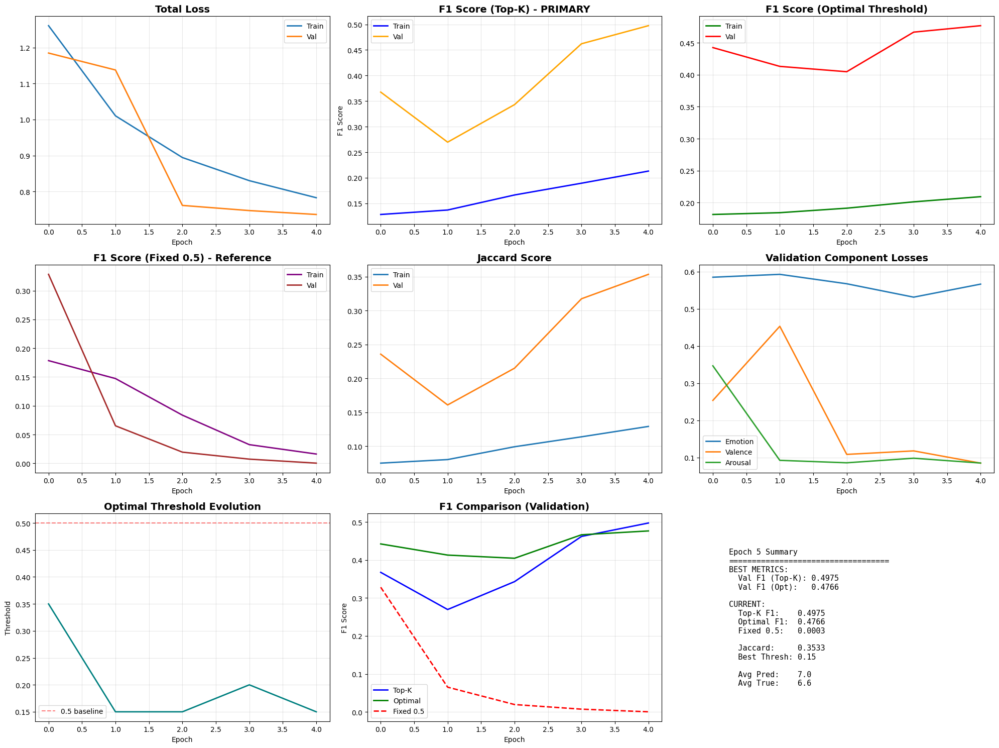


Epoch 6/60


Validation: 100%|██████████| 30/30 [00:09<00:00,  3.01it/s, Loss=0.8182]



Epoch 6 Summary:
  Train - Loss: 0.7437
          Emotion: 0.3534, Valence: 0.1733, Arousal: 0.2169

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2303
     F1 Macro:  0.0995
     Jaccard:   0.1418

  🎯 Optimal Threshold (thresh=0.25):
     F1 Micro:  0.2208
     F1 Macro:  0.1446
     Jaccard:   0.1326

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0082

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2303

  Val   - Loss: 0.7899
          Emotion: 0.5744, Valence: 0.1175, Arousal: 0.0981

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.5552
     F1 Macro:  0.2311
     Jaccard:   0.4162

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5265
     F1 Macro:  0.2613
     Jaccard:   0.3762

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.5552

  ✓ Saved best model (val_f1_topk: 0.5552)

Epoch 7/60


Validation: 100%|██████████| 30/30 [00:09<00:00,  3.00it/s, Loss=1.0122]



Epoch 7 Summary:
  Train - Loss: 0.7189
          Emotion: 0.3377, Valence: 0.1722, Arousal: 0.2091

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2462
     F1 Macro:  0.0961
     Jaccard:   0.1534

  🎯 Optimal Threshold (thresh=0.25):
     F1 Micro:  0.2312
     F1 Macro:  0.1319
     Jaccard:   0.1379

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0076

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2462

  Val   - Loss: 1.0346
          Emotion: 0.5575, Valence: 0.2721, Arousal: 0.2050

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.5279
     F1 Macro:  0.2402
     Jaccard:   0.3816

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.4870
     F1 Macro:  0.2840
     Jaccard:   0.3400

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.5279

Epoch 8/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.98it/s, Loss=0.8365]



Epoch 8 Summary:
  Train - Loss: 0.7085
          Emotion: 0.3267, Valence: 0.1728, Arousal: 0.2090

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2601
     F1 Macro:  0.0959
     Jaccard:   0.1634

  🎯 Optimal Threshold (thresh=0.25):
     F1 Micro:  0.2408
     F1 Macro:  0.1232
     Jaccard:   0.1426

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0045

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2601

  Val   - Loss: 0.8098
          Emotion: 0.5570, Valence: 0.1461, Arousal: 0.1067

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.5641
     F1 Macro:  0.2382
     Jaccard:   0.4196

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5294
     F1 Macro:  0.2625
     Jaccard:   0.3860

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.5641

  ✓ Saved best model (val_f1_topk: 0.5641)

Epoch 9/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.99it/s, Loss=0.7921]



Epoch 9 Summary:
  Train - Loss: 0.6798
          Emotion: 0.3193, Valence: 0.1609, Arousal: 0.1995

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2622
     F1 Macro:  0.0873
     Jaccard:   0.1652

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.2506
     F1 Macro:  0.1496
     Jaccard:   0.1582

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0041

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2622

  Val   - Loss: 0.7287
          Emotion: 0.5553, Valence: 0.0983, Arousal: 0.0751

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.5888
     F1 Macro:  0.2334
     Jaccard:   0.4471

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5500
     F1 Macro:  0.2610
     Jaccard:   0.4031

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.5888

  ✓ Saved best model (val_f1_topk: 0.5888)

Epoch 10/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.97it/s, Loss=0.8751]


Epoch 10 Summary:
  Train - Loss: 0.6694
          Emotion: 0.3137, Valence: 0.1589, Arousal: 0.1968

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2678
     F1 Macro:  0.0871
     Jaccard:   0.1683

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.2577
     F1 Macro:  0.1405
     Jaccard:   0.1594

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0037

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2678

  Val   - Loss: 0.8213
          Emotion: 0.5669, Valence: 0.1749, Arousal: 0.0795

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6017
     F1 Macro:  0.2391
     Jaccard:   0.4649

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5498
     F1 Macro:  0.2156
     Jaccard:   0.4102

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.6017



🚨 EMERGENCY DIAGNOSIS - WHY DID F1 COLLAPSE?

1️⃣  Output Probability Statistics:
   Min:    0.000101
   Max:    0.499789
   Mean:   0.108556
   Median: 0.083037
   Std:    0.083032

2️⃣  Predictions per Sample (threshold=0.5):
   Predicted - Min: 0, Max: 0, Mean: 0.00, Median: 0
   True      - Min: 3, Max: 13, Mean: 6.58, Median: 6

3️⃣  Prediction Collapse Check:
   Samples with ZERO predictions: 958/958 (100.0%)
   Samples with 1-2 predictions:  0
   Samples with 3+ predictions:   0
   ⚠️  WARNING: >50% of samples have NO predictions!

4️⃣  Threshold Sensitivity:
   Threshold 0.1: Avg 10.38 emotions/sample, F1: 0.5431
   Threshold 0.2: Avg 3.45 emotions/sample, F1: 0.4796
   Threshold 0.3: Avg 1.27 emotions/sample, F1: 0.2458
   Threshold 0.4: Avg 0.15 emotions/sample, F1: 0.0320
   Threshold 0.5: Avg 0.00 emotions/sample, F1: 0.0000
   Threshold 0.6: Avg 0.00 emotions/sample, F1: 0.0000
   Threshold 0.7: Avg 0.00 emotions/sample, F1: 0.0000

5️⃣  Top 10 Most/Least Predicted Emotio

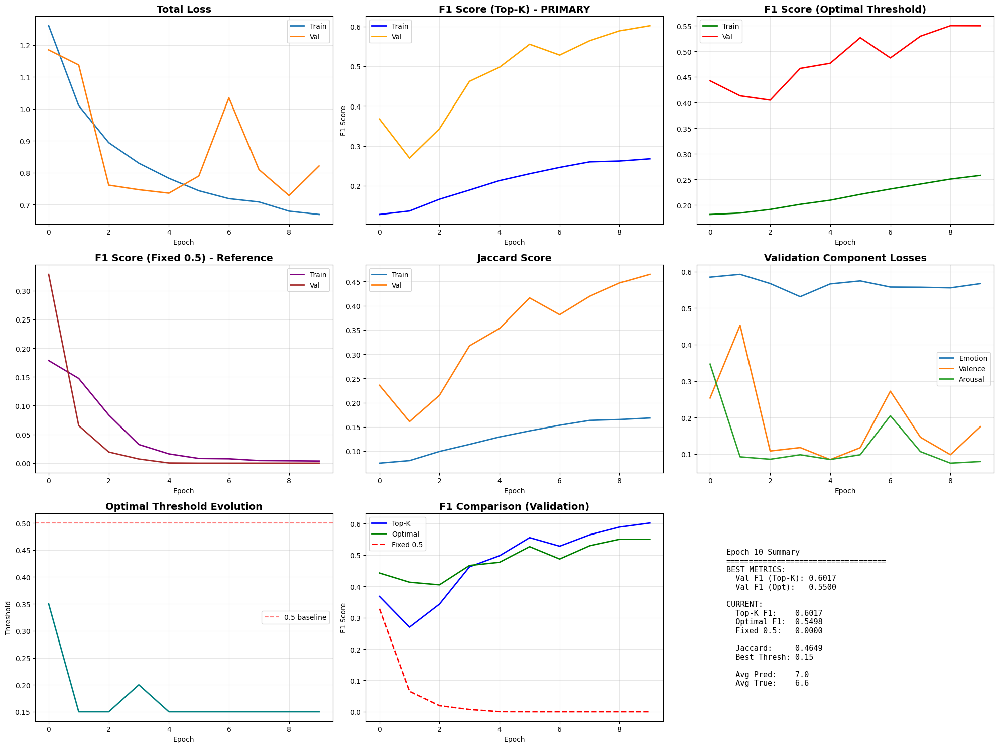


Epoch 11/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.97it/s, Loss=0.7333]



Epoch 11 Summary:
  Train - Loss: 0.6422
          Emotion: 0.3085, Valence: 0.1494, Arousal: 0.1843

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2705
     F1 Macro:  0.0875
     Jaccard:   0.1712

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.2635
     F1 Macro:  0.1345
     Jaccard:   0.1635

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0019

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2705

  Val   - Loss: 0.7201
          Emotion: 0.5388, Valence: 0.0814, Arousal: 0.0999

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.5976
     F1 Macro:  0.2349
     Jaccard:   0.4584

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5381
     F1 Macro:  0.2917
     Jaccard:   0.4025

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0003

  🟢 GOOD - Primary metric (Top-K F1): 0.5976

Epoch 12/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.96it/s, Loss=0.7572]



Epoch 12 Summary:
  Train - Loss: 0.6244
          Emotion: 0.3057, Valence: 0.1417, Arousal: 0.1771

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2749
     F1 Macro:  0.0865
     Jaccard:   0.1749

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.2727
     F1 Macro:  0.1321
     Jaccard:   0.1686

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0037

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2749

  Val   - Loss: 0.7263
          Emotion: 0.5631, Valence: 0.0861, Arousal: 0.0771

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6102
     F1 Macro:  0.2392
     Jaccard:   0.4716

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5598
     F1 Macro:  0.2346
     Jaccard:   0.4170

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.6102

  ✓ Saved best model (val_f1_topk: 0.6102)

Epoch 13/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.99it/s, Loss=0.7497]



Epoch 13 Summary:
  Train - Loss: 0.6119
          Emotion: 0.3039, Valence: 0.1372, Arousal: 0.1708

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2729
     F1 Macro:  0.0853
     Jaccard:   0.1732

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.2780
     F1 Macro:  0.1341
     Jaccard:   0.1732

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0062

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2729

  Val   - Loss: 0.7123
          Emotion: 0.5320, Valence: 0.0954, Arousal: 0.0849

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6045
     F1 Macro:  0.2497
     Jaccard:   0.4664

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5609
     F1 Macro:  0.3041
     Jaccard:   0.4258

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.6045

Epoch 14/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.98it/s, Loss=0.7751]



Epoch 14 Summary:
  Train - Loss: 0.5991
          Emotion: 0.3019, Valence: 0.1357, Arousal: 0.1615

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2800
     F1 Macro:  0.0906
     Jaccard:   0.1779

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.2787
     F1 Macro:  0.1346
     Jaccard:   0.1757

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0035

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2800

  Val   - Loss: 0.7425
          Emotion: 0.5521, Valence: 0.1035, Arousal: 0.0869

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6137
     F1 Macro:  0.2383
     Jaccard:   0.4777

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5865
     F1 Macro:  0.2316
     Jaccard:   0.4521

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.6137

  ✓ Saved best model (val_f1_topk: 0.6137)

Epoch 15/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.99it/s, Loss=0.8701]


Epoch 15 Summary:
  Train - Loss: 0.5946
          Emotion: 0.3001, Valence: 0.1327, Arousal: 0.1617

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2789
     F1 Macro:  0.0910
     Jaccard:   0.1770

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.2823
     F1 Macro:  0.1288
     Jaccard:   0.1770

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0045

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2789

  Val   - Loss: 0.8296
          Emotion: 0.5577, Valence: 0.1185, Arousal: 0.1534

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6037
     F1 Macro:  0.2434
     Jaccard:   0.4644

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5670
     F1 Macro:  0.2156
     Jaccard:   0.4256

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0003

  🟢 GOOD - Primary metric (Top-K F1): 0.6037



🚨 EMERGENCY DIAGNOSIS - WHY DID F1 COLLAPSE?

1️⃣  Output Probability Statistics:
   Min:    0.000486
   Max:    0.510283
   Mean:   0.110608
   Median: 0.087513
   Std:    0.078582

2️⃣  Predictions per Sample (threshold=0.5):
   Predicted - Min: 0, Max: 1, Mean: 0.00, Median: 0
   True      - Min: 3, Max: 13, Mean: 6.58, Median: 6

3️⃣  Prediction Collapse Check:
   Samples with ZERO predictions: 957/958 (99.9%)
   Samples with 1-2 predictions:  1
   Samples with 3+ predictions:   0
   ⚠️  WARNING: >50% of samples have NO predictions!

4️⃣  Threshold Sensitivity:
   Threshold 0.1: Avg 10.88 emotions/sample, F1: 0.5545
   Threshold 0.2: Avg 3.21 emotions/sample, F1: 0.4773
   Threshold 0.3: Avg 1.03 emotions/sample, F1: 0.2082
   Threshold 0.4: Avg 0.20 emotions/sample, F1: 0.0456
   Threshold 0.5: Avg 0.00 emotions/sample, F1: 0.0003
   Threshold 0.6: Avg 0.00 emotions/sample, F1: 0.0000
   Threshold 0.7: Avg 0.00 emotions/sample, F1: 0.0000

5️⃣  Top 10 Most/Least Predicted Emotion

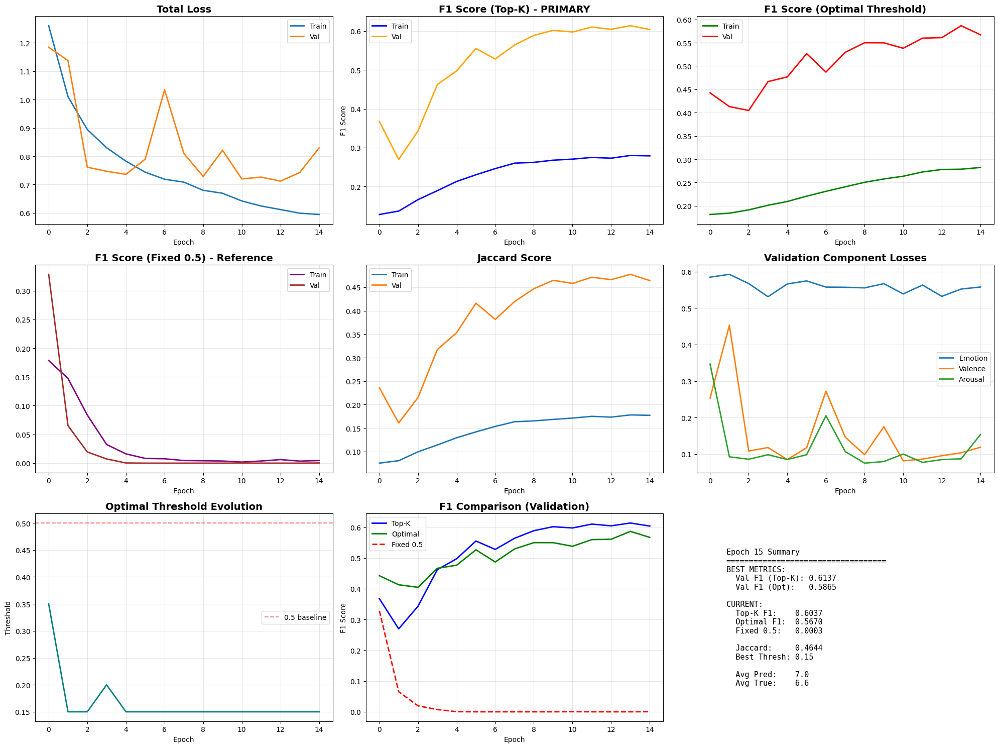


Epoch 16/60


Validation: 100%|██████████| 30/30 [00:09<00:00,  3.01it/s, Loss=0.9683]



Epoch 16 Summary:
  Train - Loss: 0.5745
          Emotion: 0.2989, Valence: 0.1275, Arousal: 0.1481

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2787
     F1 Macro:  0.0872
     Jaccard:   0.1768

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.2852
     F1 Macro:  0.1228
     Jaccard:   0.1765

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0035

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2787

  Val   - Loss: 0.8988
          Emotion: 0.5639, Valence: 0.0870, Arousal: 0.2479

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.5982
     F1 Macro:  0.2365
     Jaccard:   0.4589

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5636
     F1 Macro:  0.2184
     Jaccard:   0.4232

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.5982

Epoch 17/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.98it/s, Loss=0.7182]



Epoch 17 Summary:
  Train - Loss: 0.5650
          Emotion: 0.2984, Valence: 0.1211, Arousal: 0.1456

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2795
     F1 Macro:  0.0863
     Jaccard:   0.1780

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.2805
     F1 Macro:  0.1196
     Jaccard:   0.1748

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0062

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2795

  Val   - Loss: 0.7087
          Emotion: 0.5402, Valence: 0.0892, Arousal: 0.0793

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6088
     F1 Macro:  0.2339
     Jaccard:   0.4721

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5812
     F1 Macro:  0.2626
     Jaccard:   0.4448

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.6088

Epoch 18/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.96it/s, Loss=0.8002]



Epoch 18 Summary:
  Train - Loss: 0.5508
          Emotion: 0.2967, Valence: 0.1183, Arousal: 0.1358

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2806
     F1 Macro:  0.0867
     Jaccard:   0.1790

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.2842
     F1 Macro:  0.1230
     Jaccard:   0.1767

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0035

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2806

  Val   - Loss: 0.7573
          Emotion: 0.5582, Valence: 0.0975, Arousal: 0.1016

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6142
     F1 Macro:  0.2258
     Jaccard:   0.4794

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5885
     F1 Macro:  0.2159
     Jaccard:   0.4510

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0003

  🟢 GOOD - Primary metric (Top-K F1): 0.6142

  ✓ Saved best model (val_f1_topk: 0.6142)

Epoch 19/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  3.00it/s, Loss=0.8435]



Epoch 19 Summary:
  Train - Loss: 0.5359
          Emotion: 0.2951, Valence: 0.1096, Arousal: 0.1312

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2799
     F1 Macro:  0.0887
     Jaccard:   0.1785

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.2874
     F1 Macro:  0.1676
     Jaccard:   0.1833

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0041

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2799

  Val   - Loss: 0.8071
          Emotion: 0.5708, Valence: 0.0989, Arousal: 0.1375

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6091
     F1 Macro:  0.2304
     Jaccard:   0.4735

  🎯 Optimal Threshold (thresh=0.10):
     F1 Micro:  0.5782
     F1 Macro:  0.3006
     Jaccard:   0.4462

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.6091

Epoch 20/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  3.00it/s, Loss=0.8229]


Epoch 20 Summary:
  Train - Loss: 0.5256
          Emotion: 0.2954, Valence: 0.1066, Arousal: 0.1236

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2763
     F1 Macro:  0.0871
     Jaccard:   0.1748

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.2845
     F1 Macro:  0.1629
     Jaccard:   0.1807

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0037

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2763

  Val   - Loss: 0.7962
          Emotion: 0.5721, Valence: 0.1273, Arousal: 0.0968

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6091
     F1 Macro:  0.2381
     Jaccard:   0.4721

  🎯 Optimal Threshold (thresh=0.10):
     F1 Micro:  0.5795
     F1 Macro:  0.3069
     Jaccard:   0.4447

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.6091



🚨 EMERGENCY DIAGNOSIS - WHY DID F1 COLLAPSE?

1️⃣  Output Probability Statistics:
   Min:    0.000201
   Max:    0.499010
   Mean:   0.098840
   Median: 0.075864
   Std:    0.073646

2️⃣  Predictions per Sample (threshold=0.5):
   Predicted - Min: 0, Max: 0, Mean: 0.00, Median: 0
   True      - Min: 3, Max: 13, Mean: 6.58, Median: 6

3️⃣  Prediction Collapse Check:
   Samples with ZERO predictions: 958/958 (100.0%)
   Samples with 1-2 predictions:  0
   Samples with 3+ predictions:   0
   ⚠️  WARNING: >50% of samples have NO predictions!

4️⃣  Threshold Sensitivity:
   Threshold 0.1: Avg 9.47 emotions/sample, F1: 0.5795
   Threshold 0.2: Avg 2.84 emotions/sample, F1: 0.4415
   Threshold 0.3: Avg 0.58 emotions/sample, F1: 0.1202
   Threshold 0.4: Avg 0.05 emotions/sample, F1: 0.0120
   Threshold 0.5: Avg 0.00 emotions/sample, F1: 0.0000
   Threshold 0.6: Avg 0.00 emotions/sample, F1: 0.0000
   Threshold 0.7: Avg 0.00 emotions/sample, F1: 0.0000

5️⃣  Top 10 Most/Least Predicted Emotion

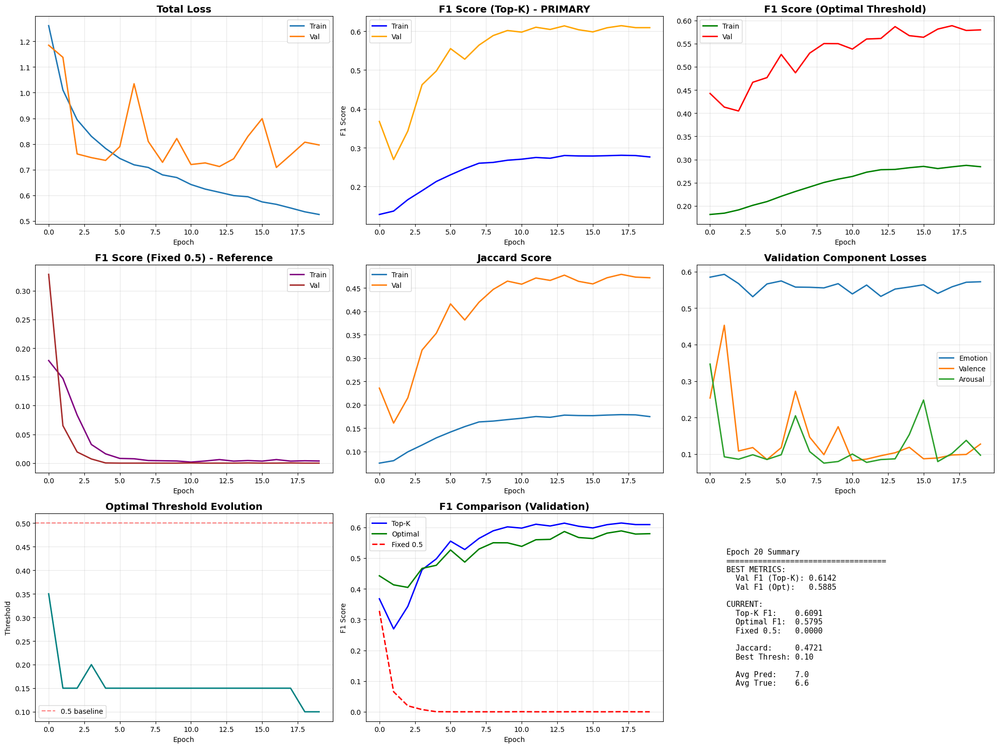


Epoch 21/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.99it/s, Loss=0.8057]



Epoch 21 Summary:
  Train - Loss: 0.5011
          Emotion: 0.2930, Valence: 0.0962, Arousal: 0.1119

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2854
     F1 Macro:  0.0907
     Jaccard:   0.1826

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.2914
     F1 Macro:  0.1172
     Jaccard:   0.1812

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0052

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2854

  Val   - Loss: 0.7995
          Emotion: 0.5397, Valence: 0.1058, Arousal: 0.1540

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6085
     F1 Macro:  0.2408
     Jaccard:   0.4701

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5884
     F1 Macro:  0.2649
     Jaccard:   0.4521

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0003

  🟢 GOOD - Primary metric (Top-K F1): 0.6085

Epoch 22/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.95it/s, Loss=0.8215]



Epoch 22 Summary:
  Train - Loss: 0.4844
          Emotion: 0.2919, Valence: 0.0895, Arousal: 0.1030

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2829
     F1 Macro:  0.0877
     Jaccard:   0.1811

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.2937
     F1 Macro:  0.1170
     Jaccard:   0.1821

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0058

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2829

  Val   - Loss: 0.7862
          Emotion: 0.5526, Valence: 0.1188, Arousal: 0.1148

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6133
     F1 Macro:  0.2411
     Jaccard:   0.4775

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5887
     F1 Macro:  0.2326
     Jaccard:   0.4559

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0010

  🟢 GOOD - Primary metric (Top-K F1): 0.6133

Epoch 23/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.96it/s, Loss=0.7846]



Epoch 23 Summary:
  Train - Loss: 0.4709
          Emotion: 0.2916, Valence: 0.0831, Arousal: 0.0961

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2795
     F1 Macro:  0.0862
     Jaccard:   0.1786

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.2937
     F1 Macro:  0.1223
     Jaccard:   0.1820

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0045

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2795

  Val   - Loss: 0.7742
          Emotion: 0.5381, Valence: 0.1417, Arousal: 0.0944

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6045
     F1 Macro:  0.2440
     Jaccard:   0.4658

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5802
     F1 Macro:  0.2678
     Jaccard:   0.4423

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.6045

Epoch 24/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.95it/s, Loss=0.8204]



Epoch 24 Summary:
  Train - Loss: 0.4597
          Emotion: 0.2911, Valence: 0.0782, Arousal: 0.0903

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2856
     F1 Macro:  0.0935
     Jaccard:   0.1818

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.2954
     F1 Macro:  0.1209
     Jaccard:   0.1844

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0054

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2856

  Val   - Loss: 0.7972
          Emotion: 0.5638, Valence: 0.0946, Arousal: 0.1387

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6168
     F1 Macro:  0.2370
     Jaccard:   0.4813

  🎯 Optimal Threshold (thresh=0.10):
     F1 Micro:  0.5932
     F1 Macro:  0.3139
     Jaccard:   0.4622

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.6168

  ✓ Saved best model (val_f1_topk: 0.6168)

Epoch 25/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.94it/s, Loss=0.8473]


Epoch 25 Summary:
  Train - Loss: 0.4500
          Emotion: 0.2905, Valence: 0.0748, Arousal: 0.0847

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2819
     F1 Macro:  0.0893
     Jaccard:   0.1795

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.2932
     F1 Macro:  0.1728
     Jaccard:   0.1888

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0058

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2819

  Val   - Loss: 0.8586
          Emotion: 0.5320, Valence: 0.2293, Arousal: 0.0972

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.5959
     F1 Macro:  0.2478
     Jaccard:   0.4559

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5775
     F1 Macro:  0.2853
     Jaccard:   0.4404

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.5959



🚨 EMERGENCY DIAGNOSIS - WHY DID F1 COLLAPSE?

1️⃣  Output Probability Statistics:
   Min:    0.000516
   Max:    0.498474
   Mean:   0.131856
   Median: 0.112331
   Std:    0.079449

2️⃣  Predictions per Sample (threshold=0.5):
   Predicted - Min: 0, Max: 0, Mean: 0.00, Median: 0
   True      - Min: 3, Max: 13, Mean: 6.58, Median: 6

3️⃣  Prediction Collapse Check:
   Samples with ZERO predictions: 958/958 (100.0%)
   Samples with 1-2 predictions:  0
   Samples with 3+ predictions:   0
   ⚠️  WARNING: >50% of samples have NO predictions!

4️⃣  Threshold Sensitivity:
   Threshold 0.1: Avg 14.96 emotions/sample, F1: 0.5191
   Threshold 0.2: Avg 4.39 emotions/sample, F1: 0.5246
   Threshold 0.3: Avg 1.34 emotions/sample, F1: 0.2669
   Threshold 0.4: Avg 0.14 emotions/sample, F1: 0.0348
   Threshold 0.5: Avg 0.00 emotions/sample, F1: 0.0000
   Threshold 0.6: Avg 0.00 emotions/sample, F1: 0.0000
   Threshold 0.7: Avg 0.00 emotions/sample, F1: 0.0000

5️⃣  Top 10 Most/Least Predicted Emotio

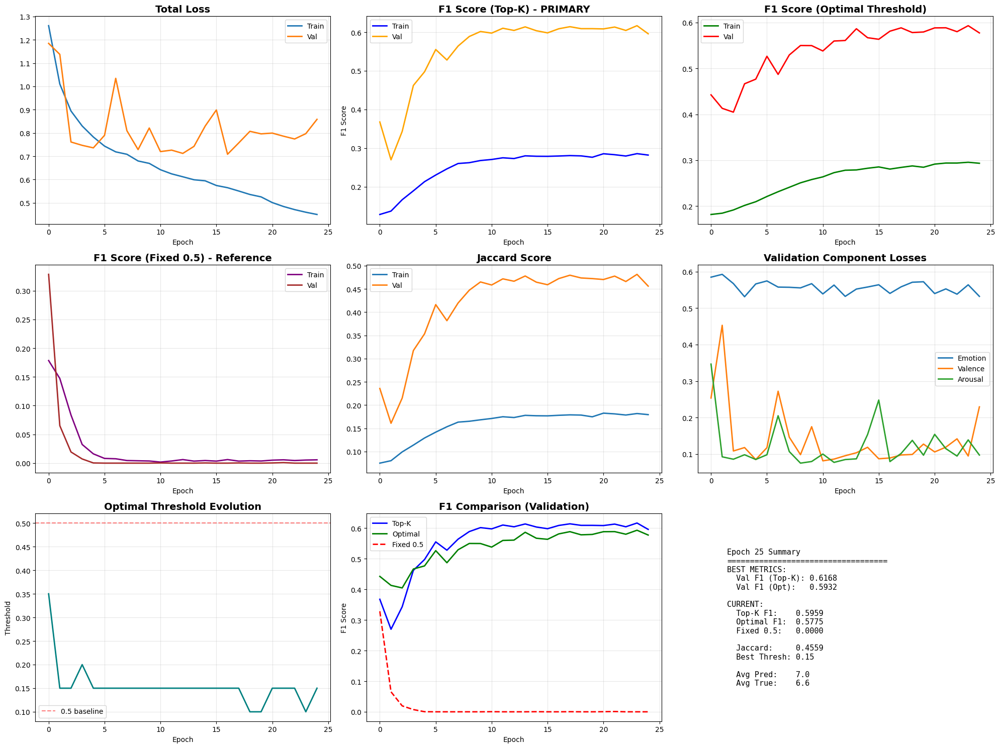


Epoch 26/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.96it/s, Loss=0.7753]



Epoch 26 Summary:
  Train - Loss: 0.4444
          Emotion: 0.2896, Valence: 0.0733, Arousal: 0.0815

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2817
     F1 Macro:  0.0894
     Jaccard:   0.1798

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.2980
     F1 Macro:  0.1712
     Jaccard:   0.1896

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0054

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2817

  Val   - Loss: 0.7534
          Emotion: 0.5485, Valence: 0.1030, Arousal: 0.1019

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6117
     F1 Macro:  0.2356
     Jaccard:   0.4759

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5978
     F1 Macro:  0.2403
     Jaccard:   0.4644

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0000

  🟢 GOOD - Primary metric (Top-K F1): 0.6117

Epoch 27/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.99it/s, Loss=0.7704]



Epoch 27 Summary:
  Train - Loss: 0.4338
          Emotion: 0.2881, Valence: 0.0694, Arousal: 0.0763

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2861
     F1 Macro:  0.0910
     Jaccard:   0.1826

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.2998
     F1 Macro:  0.1778
     Jaccard:   0.1911

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0064

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2861

  Val   - Loss: 0.7628
          Emotion: 0.5517, Valence: 0.1068, Arousal: 0.1042

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6170
     F1 Macro:  0.2410
     Jaccard:   0.4822

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5960
     F1 Macro:  0.2295
     Jaccard:   0.4632

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0013

  🟢 GOOD - Primary metric (Top-K F1): 0.6170

  ✓ Saved best model (val_f1_topk: 0.6170)

Epoch 28/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.98it/s, Loss=1.0501]



Epoch 28 Summary:
  Train - Loss: 0.4272
          Emotion: 0.2888, Valence: 0.0650, Arousal: 0.0734

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2843
     F1 Macro:  0.0928
     Jaccard:   0.1817

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.2991
     F1 Macro:  0.1766
     Jaccard:   0.1907

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0070

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2843

  Val   - Loss: 1.0197
          Emotion: 0.5638, Valence: 0.1077, Arousal: 0.3482

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6133
     F1 Macro:  0.2301
     Jaccard:   0.4779

  🎯 Optimal Threshold (thresh=0.10):
     F1 Micro:  0.5882
     F1 Macro:  0.3059
     Jaccard:   0.4550

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0013

  🟢 GOOD - Primary metric (Top-K F1): 0.6133

Epoch 29/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.95it/s, Loss=0.7767]



Epoch 29 Summary:
  Train - Loss: 0.4203
          Emotion: 0.2876, Valence: 0.0639, Arousal: 0.0689

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2867
     F1 Macro:  0.0904
     Jaccard:   0.1842

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.3022
     F1 Macro:  0.1839
     Jaccard:   0.1930

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0070

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2867

  Val   - Loss: 0.7599
          Emotion: 0.5352, Valence: 0.1214, Arousal: 0.1033

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6082
     F1 Macro:  0.2464
     Jaccard:   0.4691

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5817
     F1 Macro:  0.2703
     Jaccard:   0.4444

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0016

  🟢 GOOD - Primary metric (Top-K F1): 0.6082

Epoch 30/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.98it/s, Loss=0.9200]


Epoch 30 Summary:
  Train - Loss: 0.4143
          Emotion: 0.2871, Valence: 0.0591, Arousal: 0.0681

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2886
     F1 Macro:  0.0966
     Jaccard:   0.1852

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.3044
     F1 Macro:  0.1852
     Jaccard:   0.1941

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0090

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2886

  Val   - Loss: 0.8594
          Emotion: 0.5594, Valence: 0.1144, Arousal: 0.1856

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6171
     F1 Macro:  0.2335
     Jaccard:   0.4826

  🎯 Optimal Threshold (thresh=0.10):
     F1 Micro:  0.5958
     F1 Macro:  0.3140
     Jaccard:   0.4654

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0010

  🟢 GOOD - Primary metric (Top-K F1): 0.6171



🚨 EMERGENCY DIAGNOSIS - WHY DID F1 COLLAPSE?

1️⃣  Output Probability Statistics:
   Min:    0.000591
   Max:    0.569125
   Mean:   0.100358
   Median: 0.070881
   Std:    0.082439

2️⃣  Predictions per Sample (threshold=0.5):
   Predicted - Min: 0, Max: 1, Mean: 0.00, Median: 0
   True      - Min: 3, Max: 13, Mean: 6.58, Median: 6

3️⃣  Prediction Collapse Check:
   Samples with ZERO predictions: 955/958 (99.7%)
   Samples with 1-2 predictions:  3
   Samples with 3+ predictions:   0
   ⚠️  WARNING: >50% of samples have NO predictions!

4️⃣  Threshold Sensitivity:
   Threshold 0.1: Avg 9.10 emotions/sample, F1: 0.5958
   Threshold 0.2: Avg 3.40 emotions/sample, F1: 0.4970
   Threshold 0.3: Avg 0.92 emotions/sample, F1: 0.1875
   Threshold 0.4: Avg 0.12 emotions/sample, F1: 0.0290
   Threshold 0.5: Avg 0.00 emotions/sample, F1: 0.0010
   Threshold 0.6: Avg 0.00 emotions/sample, F1: 0.0000
   Threshold 0.7: Avg 0.00 emotions/sample, F1: 0.0000

5️⃣  Top 10 Most/Least Predicted Emotions

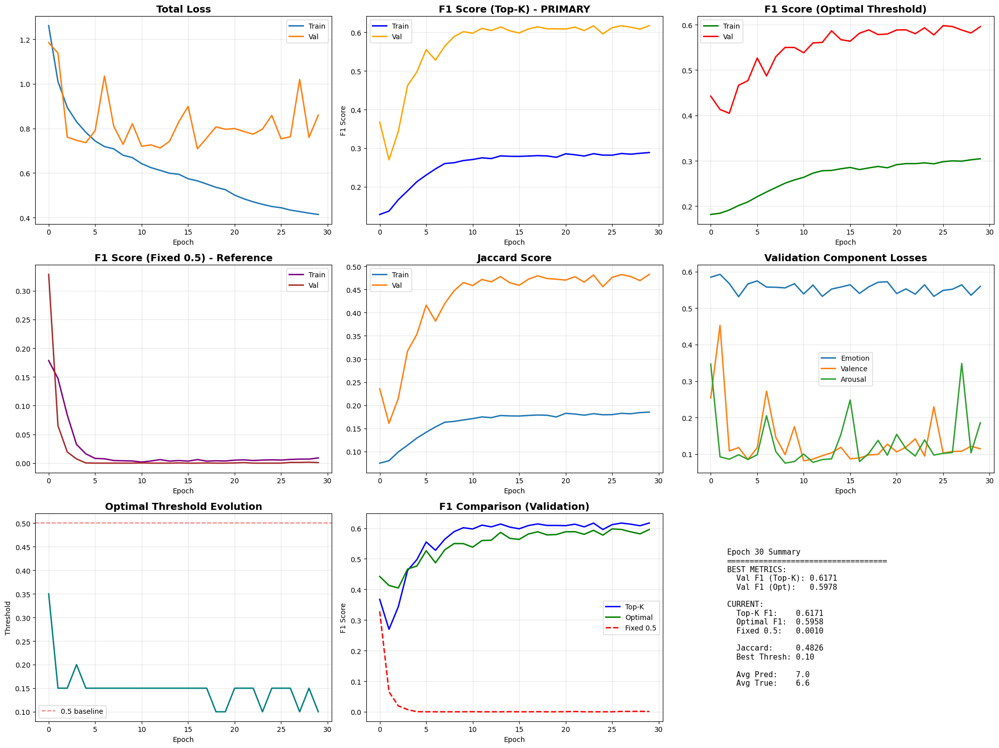


Epoch 31/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.96it/s, Loss=0.8715]



Epoch 31 Summary:
  Train - Loss: 0.4065
          Emotion: 0.2863, Valence: 0.0548, Arousal: 0.0653

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2912
     F1 Macro:  0.0946
     Jaccard:   0.1865

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.3041
     F1 Macro:  0.1246
     Jaccard:   0.1898

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0072

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2912

  Val   - Loss: 0.8419
          Emotion: 0.5389, Valence: 0.1384, Arousal: 0.1647

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6065
     F1 Macro:  0.2508
     Jaccard:   0.4668

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5873
     F1 Macro:  0.2727
     Jaccard:   0.4487

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0006

  🟢 GOOD - Primary metric (Top-K F1): 0.6065

Epoch 32/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.96it/s, Loss=0.8275]



Epoch 32 Summary:
  Train - Loss: 0.3960
          Emotion: 0.2851, Valence: 0.0524, Arousal: 0.0584

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2910
     F1 Macro:  0.0932
     Jaccard:   0.1873

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.3120
     F1 Macro:  0.1358
     Jaccard:   0.1935

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0105

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2910

  Val   - Loss: 0.8066
          Emotion: 0.5405, Valence: 0.1141, Arousal: 0.1519

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6130
     F1 Macro:  0.2452
     Jaccard:   0.4771

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5913
     F1 Macro:  0.2580
     Jaccard:   0.4541

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0006

  🟢 GOOD - Primary metric (Top-K F1): 0.6130

Epoch 33/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.99it/s, Loss=0.8539]


Epoch 35 Summary:
  Train - Loss: 0.3872
          Emotion: 0.2841, Valence: 0.0483, Arousal: 0.0548

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2927
     F1 Macro:  0.0984
     Jaccard:   0.1876

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.3130
     F1 Macro:  0.1932
     Jaccard:   0.2005

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0088

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2927

  Val   - Loss: 0.8399
          Emotion: 0.5567, Valence: 0.1138, Arousal: 0.1694

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6159
     F1 Macro:  0.2380
     Jaccard:   0.4814

  🎯 Optimal Threshold (thresh=0.10):
     F1 Micro:  0.5900
     F1 Macro:  0.3052
     Jaccard:   0.4570

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0019

  🟢 GOOD - Primary metric (Top-K F1): 0.6159



🚨 EMERGENCY DIAGNOSIS - WHY DID F1 COLLAPSE?

1️⃣  Output Probability Statistics:
   Min:    0.000424
   Max:    0.557027
   Mean:   0.101975
   Median: 0.072230
   Std:    0.085603

2️⃣  Predictions per Sample (threshold=0.5):
   Predicted - Min: 0, Max: 1, Mean: 0.01, Median: 0
   True      - Min: 3, Max: 13, Mean: 6.58, Median: 6

3️⃣  Prediction Collapse Check:
   Samples with ZERO predictions: 951/958 (99.3%)
   Samples with 1-2 predictions:  7
   Samples with 3+ predictions:   0
   ⚠️  WARNING: >50% of samples have NO predictions!

4️⃣  Threshold Sensitivity:
   Threshold 0.1: Avg 9.29 emotions/sample, F1: 0.5900
   Threshold 0.2: Avg 3.47 emotions/sample, F1: 0.5035
   Threshold 0.3: Avg 1.14 emotions/sample, F1: 0.2269
   Threshold 0.4: Avg 0.21 emotions/sample, F1: 0.0480
   Threshold 0.5: Avg 0.01 emotions/sample, F1: 0.0019
   Threshold 0.6: Avg 0.00 emotions/sample, F1: 0.0000
   Threshold 0.7: Avg 0.00 emotions/sample, F1: 0.0000

5️⃣  Top 10 Most/Least Predicted Emotions

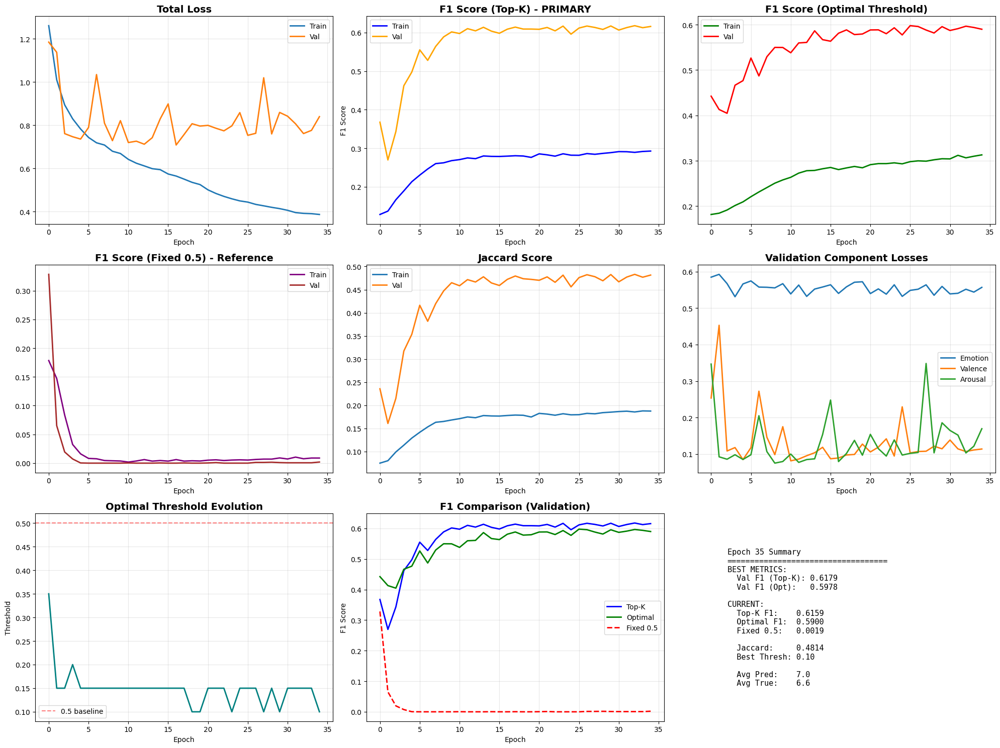


Epoch 36/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.96it/s, Loss=0.8327]



Epoch 36 Summary:
  Train - Loss: 0.3829
          Emotion: 0.2834, Valence: 0.0472, Arousal: 0.0523

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2952
     F1 Macro:  0.0975
     Jaccard:   0.1899

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.3150
     F1 Macro:  0.1331
     Jaccard:   0.1945

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0099

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2952

  Val   - Loss: 0.8179
          Emotion: 0.5618, Valence: 0.1318, Arousal: 0.1243

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6163
     F1 Macro:  0.2300
     Jaccard:   0.4825

  🎯 Optimal Threshold (thresh=0.10):
     F1 Micro:  0.5984
     F1 Macro:  0.3067
     Jaccard:   0.4678

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0019

  🟢 GOOD - Primary metric (Top-K F1): 0.6163

Epoch 37/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.94it/s, Loss=0.7975]



Epoch 37 Summary:
  Train - Loss: 0.3825
          Emotion: 0.2833, Valence: 0.0465, Arousal: 0.0527

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2923
     F1 Macro:  0.0947
     Jaccard:   0.1874

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.3108
     F1 Macro:  0.1843
     Jaccard:   0.1980

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0078

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2923

  Val   - Loss: 0.7768
          Emotion: 0.5435, Valence: 0.1244, Arousal: 0.1089

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6170
     F1 Macro:  0.2408
     Jaccard:   0.4827

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.6001
     F1 Macro:  0.2416
     Jaccard:   0.4664

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0019

  🟢 GOOD - Primary metric (Top-K F1): 0.6170

Epoch 38/60


Validation: 100%|██████████| 30/30 [00:10<00:00,  2.95it/s, Loss=0.8663]



Epoch 38 Summary:
  Train - Loss: 0.3764
          Emotion: 0.2826, Valence: 0.0433, Arousal: 0.0505

Train Metrics:

  📊 Top-K Strategy (k=3.0) - PRIMARY:
     F1 Micro:  0.2961
     F1 Macro:  0.0977
     Jaccard:   0.1911

  🎯 Optimal Threshold (thresh=0.20):
     F1 Micro:  0.3160
     F1 Macro:  0.1358
     Jaccard:   0.1958

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0119

  🔴 NEEDS WORK - Primary metric (Top-K F1): 0.2961

  Val   - Loss: 0.8462
          Emotion: 0.5507, Valence: 0.1323, Arousal: 0.1631

Val Metrics:

  📊 Top-K Strategy (k=7.0) - PRIMARY:
     F1 Micro:  0.6082
     F1 Macro:  0.2501
     Jaccard:   0.4710

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5772
     F1 Macro:  0.2369
     Jaccard:   0.4356

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0010

  🟢 GOOD - Primary metric (Top-K F1): 0.6082

Epoch 39/60


Training:  87%|████████▋ | 104/120 [01:39<00:15,  1.04it/s, Loss=0.4067]


KeyboardInterrupt: 

In [16]:
# Updated CONFIG for separate train and validation files
CONFIG = {
    # Dataset paths
    'train_csv': '/kaggle/input/emotic/normalized_balanced_limited.csv',
    'val_csv': '/kaggle/input/emotic/normalized_dataset_val.csv',
    'img_arrays_dir': '/kaggle/input/emotic/archive_emot 2/archive_emot/img_arrs/',
    'pretrained_path': None,  # ❌ Don't load pretrained until model is fixed!
    
    # Training parameters
    'batch_size': 32,
    'num_epochs': 60,
    'learning_rate': 0.00005,  # ✓ Lower LR
    'max_samples': None,
    
    # Model parameters
    'freeze_backbone': False,  # ✓ Train end-to-end first
    'multi_label': True,
    'image_size': 256,
    
    # System
    'save_path': '/kaggle/working/checkpoints',
    'num_workers': 2,
    'pin_memory': True,
}


# Start training
print("Starting training with separate validation set...")
model, history = train_kaggle_separate_val_with_metrics(CONFIG)
print("Training completed!")

# Final comprehensive plots
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Total loss
axes[0, 0].plot(history['train_loss'], label='Train', linewidth=2)
axes[0, 0].plot(history['val_loss'], label='Val', linewidth=2)
axes[0, 0].set_title('Total Loss', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Accuracy
axes[0, 1].plot(history['train_acc'], label='Train', linewidth=2)
axes[0, 1].plot(history['val_acc'], label='Val', linewidth=2)
axes[0, 1].set_title('Accuracy', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Accuracy (%)')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Emotion loss
axes[0, 2].plot(history['train_emotion_loss'], label='Train', linewidth=2)
axes[0, 2].plot(history['val_emotion_loss'], label='Val', linewidth=2)
axes[0, 2].set_title('Emotion Loss', fontsize=14, fontweight='bold')
axes[0, 2].set_xlabel('Epoch')
axes[0, 2].set_ylabel('Loss')
axes[0, 2].legend()
axes[0, 2].grid(True, alpha=0.3)

# Valence loss
axes[1, 0].plot(history['train_valence_loss'], label='Train', linewidth=2)
axes[1, 0].plot(history['val_valence_loss'], label='Val', linewidth=2)
axes[1, 0].set_title('Valence Loss', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Loss')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# Arousal loss
axes[1, 1].plot(history['train_arousal_loss'], label='Train', linewidth=2)
axes[1, 1].plot(history['val_arousal_loss'], label='Val', linewidth=2)
axes[1, 1].set_title('Arousal Loss', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Loss')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

# Summary statistics
axes[1, 2].axis('off')
summary_text = f"""
Final Training Results
{'='*25}
Best Val Loss: {min(history['val_loss']):.4f}
Best Val Acc: {max(history['val_acc']):.2f}%

Final Epoch:
  Train Loss: {history['train_loss'][-1]:.4f}
  Train Acc: {history['train_acc'][-1]:.2f}%
  Val Loss: {history['val_loss'][-1]:.4f}
  Val Acc: {history['val_acc'][-1]:.2f}%
"""
axes[1, 2].text(0.1, 0.5, summary_text, fontsize=12, family='monospace',
                verticalalignment='center')

plt.tight_layout()
plt.savefig(f'{CONFIG["save_path"]}/final_training_results.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✓ All plots saved to:", CONFIG['save_path'])

print("Training function ready!")


Running inference...
Using device: cuda
CUDA Device: Tesla T4
CUDA Memory: 15.83 GB

Loading Model
Loading model from /kaggle/input/emotic/best_model (7).pth
Target device: cuda
⚠️ weights_only=True failed: Weights only load failed. This file can still be loaded, to do so you have two options, do those steps only if you trust the source of the checkpoint. 
	(1) In PyTorch 2.6, we changed the default value of the `weights_only` argument in `torch.load` from `False` to `True`. Re-running `torch.load` with `weights_only` set to `False` will likely succeed, but it can result in arbitrary code execution. Do it only if you got the file from a trusted source.
	(2) Alternatively, to load with `weights_only=True` please check the recommended steps in the following error message.
	WeightsUnpickler error: Unsupported global: GLOBAL numpy.core.multiarray.scalar was not an allowed global by default. Please use `torch.serialization.add_safe_globals([scalar])` or the `torch.serialization.safe_globals

Inference: 100%|██████████| 94/94 [01:01<00:00,  1.52it/s]



Applying prediction method: top_k

Evaluating predictions (labels available)

Test Set Metrics:

  📊 Top-K Strategy (k=4.0) - PRIMARY:
     F1 Micro:  0.5000
     F1 Macro:  0.1395
     Jaccard:   0.3648

  🎯 Optimal Threshold (thresh=0.15):
     F1 Micro:  0.5226
     F1 Macro:  0.1836
     Jaccard:   0.3820

  📉 Fixed Threshold (0.5) - Reference:
     F1 Micro:  0.0001

  🟡 MODERATE - Primary metric (Top-K F1): 0.5000

Per-Class F1 Scores:
  Happiness           : 0.6822
  Engagement          : 0.2470
  Excitement          : 0.1524
  Confidence          : 0.0712
  Anticipation        : 0.0131
  Pleasure            : 0.0076
  Peace               : 0.0000
  Affection           : 0.0000
  Esteem              : 0.0000
  Surprise            : 0.0000
  Sympathy            : 0.0000
  Doubt/Confusion     : 0.0000
  Disconnection       : 0.0000
  Fatigue             : 0.0000
  Embarrassment       : 0.0000
  Yearning            : 0.0000
  Disapproval         : 0.0000
  Aversion            : 0.

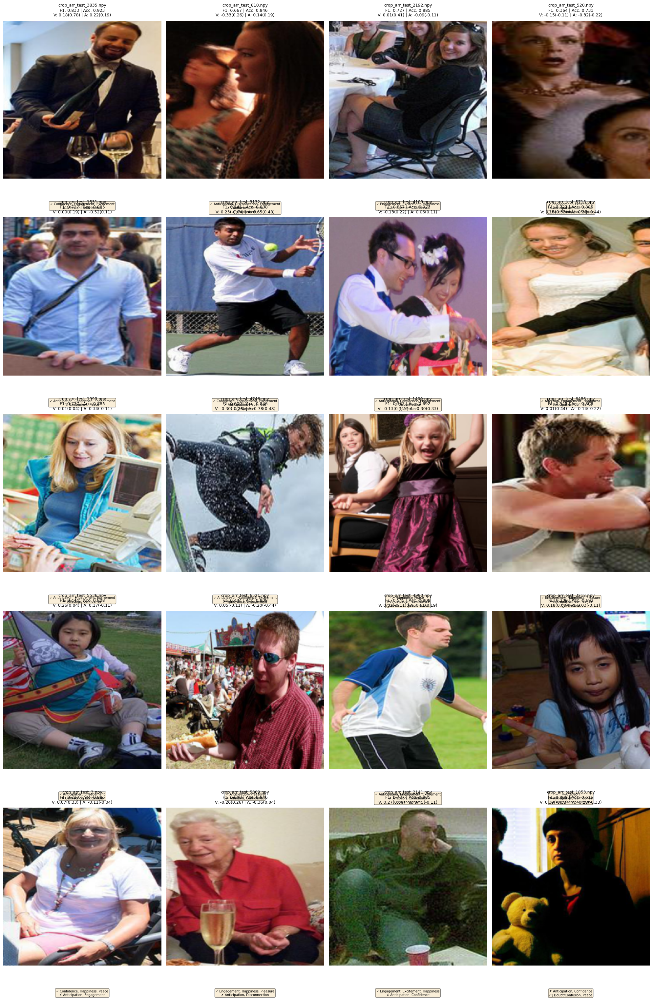


Creating detailed visualizations for 20 samples...
✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_1_idx1698.png


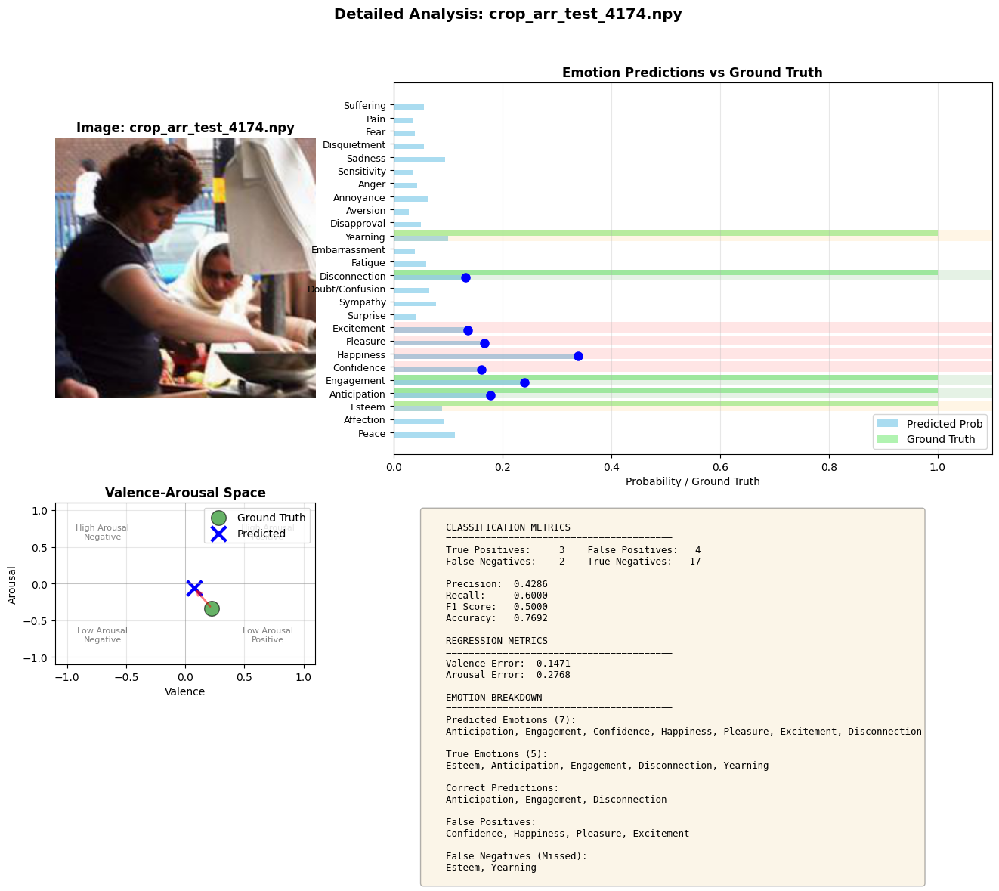

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_2_idx113.png


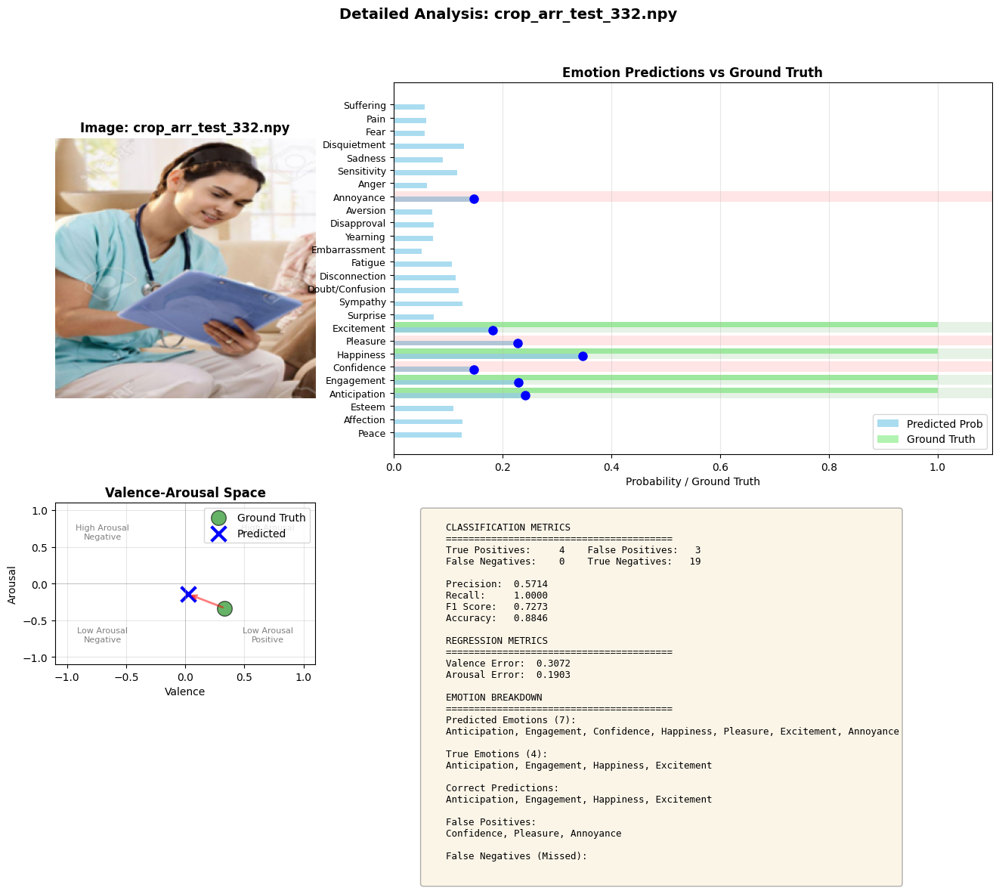

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_3_idx2414.png


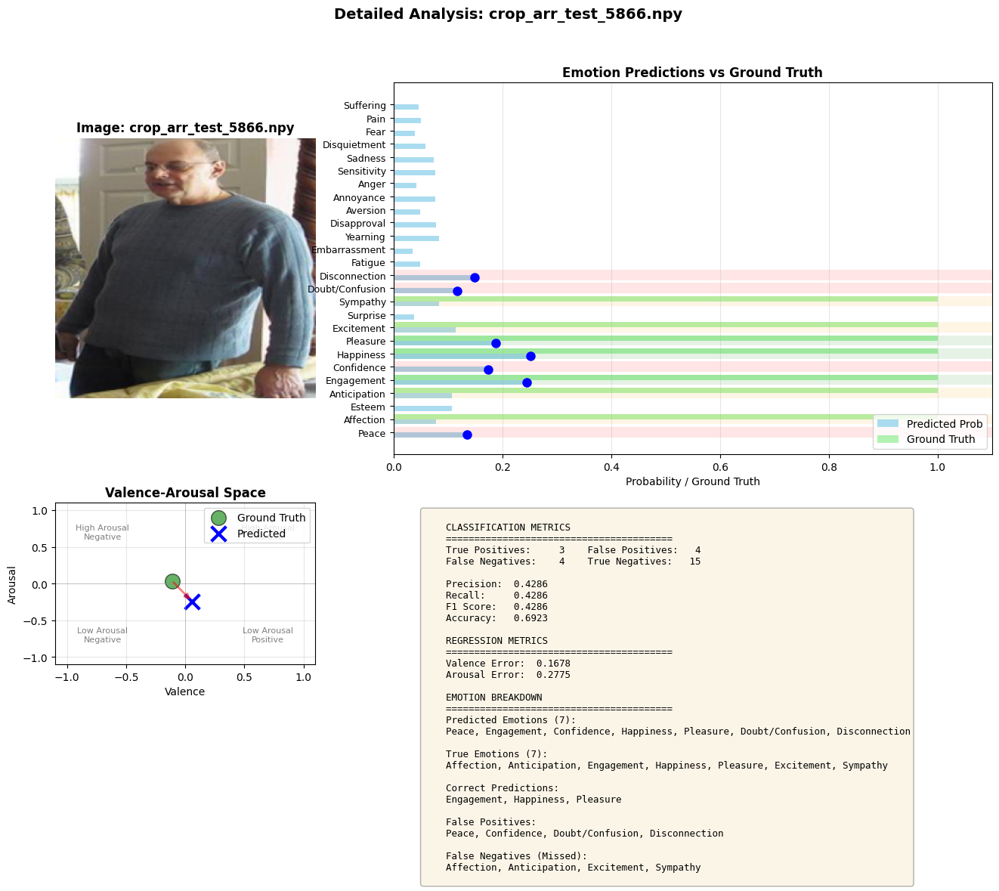

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_4_idx2173.png


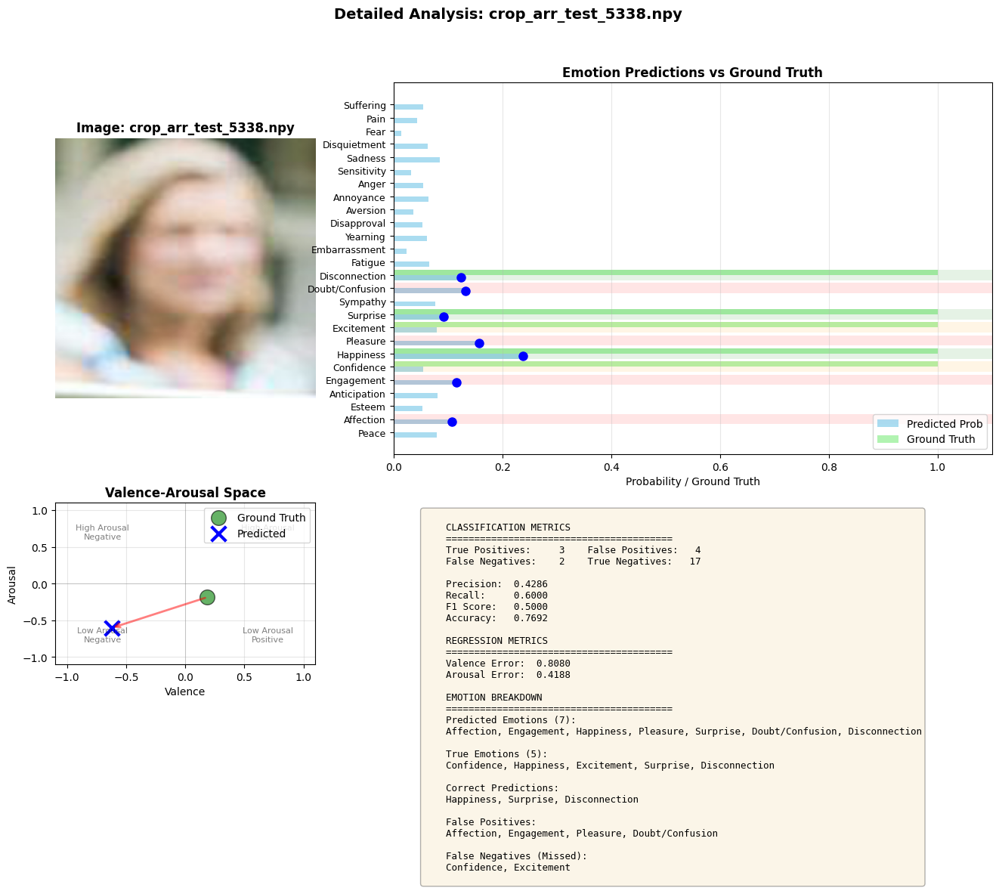

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_5_idx659.png


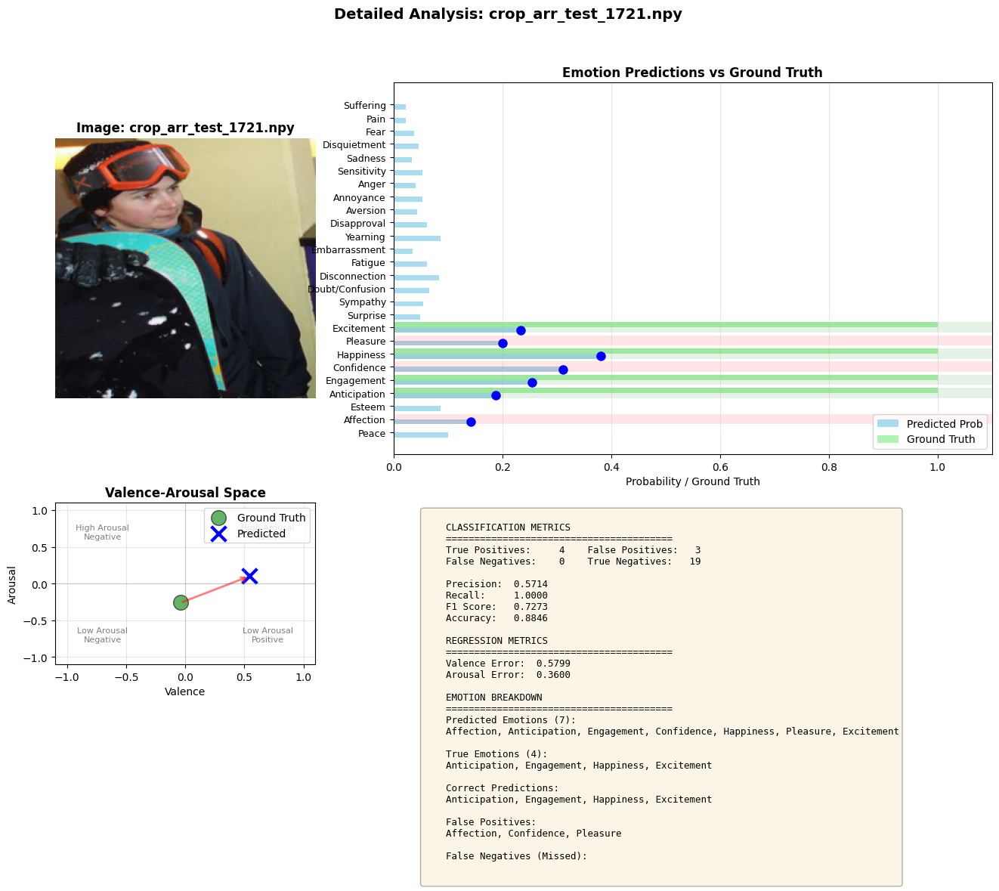

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_6_idx1864.png


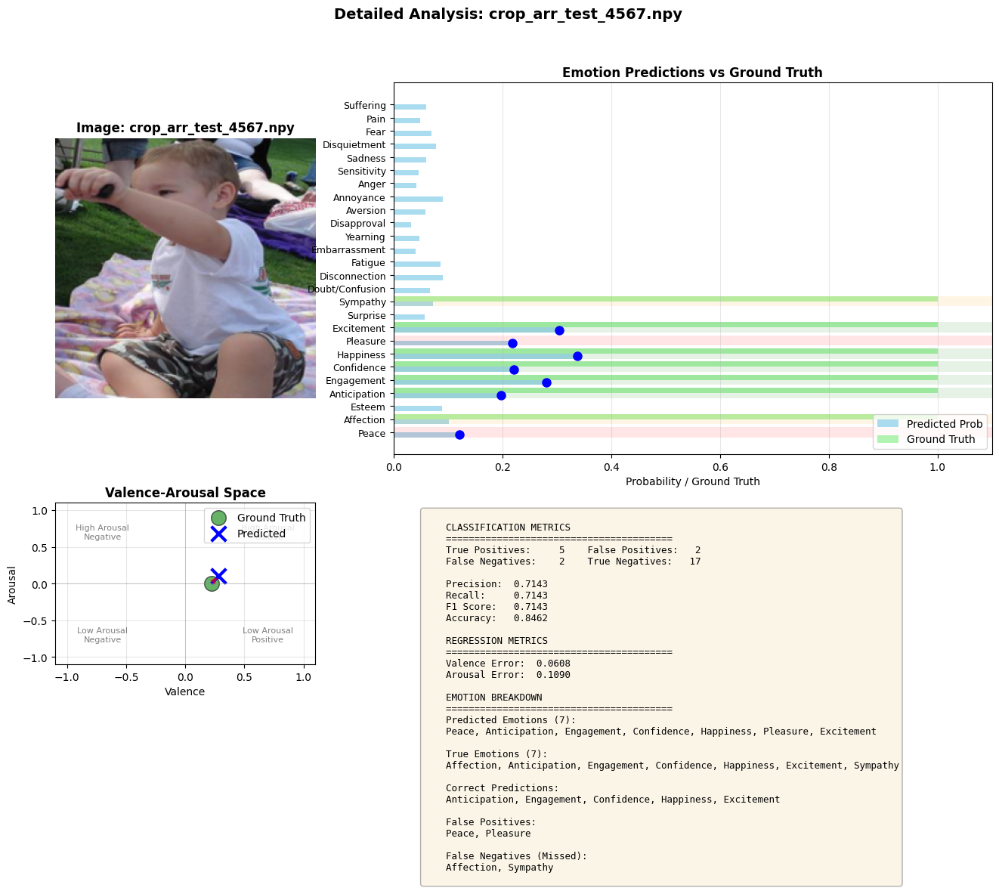

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_7_idx706.png


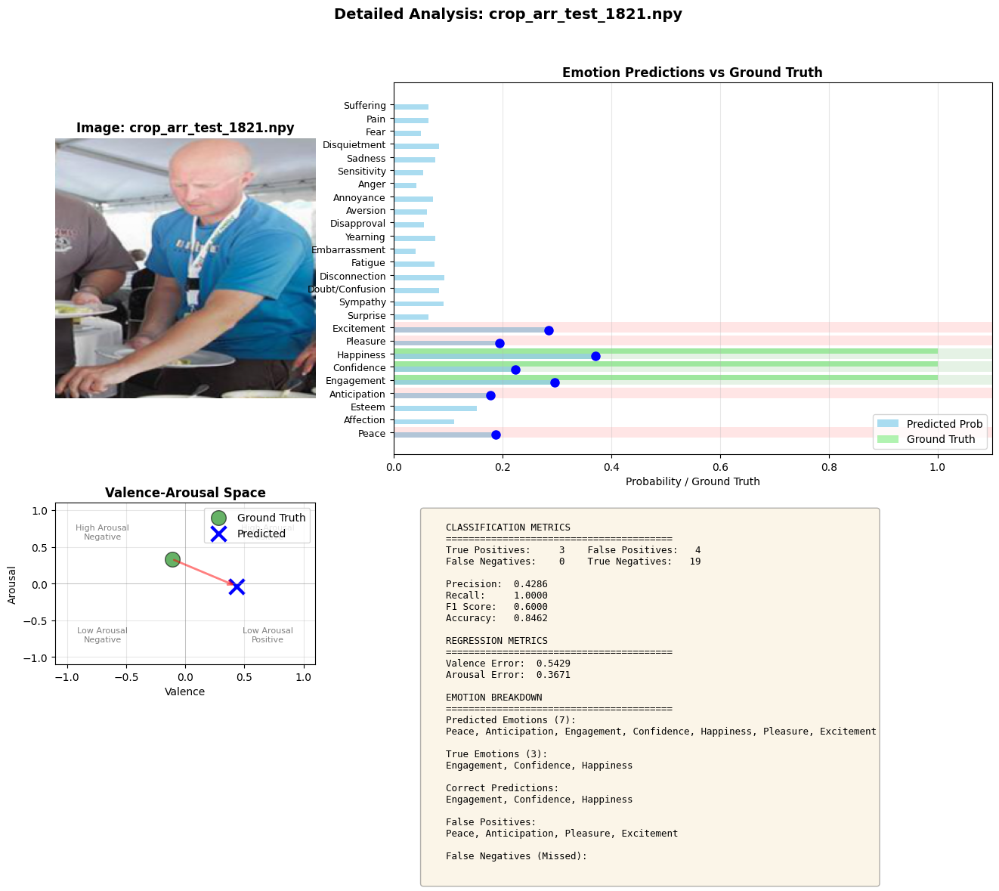

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_8_idx1744.png


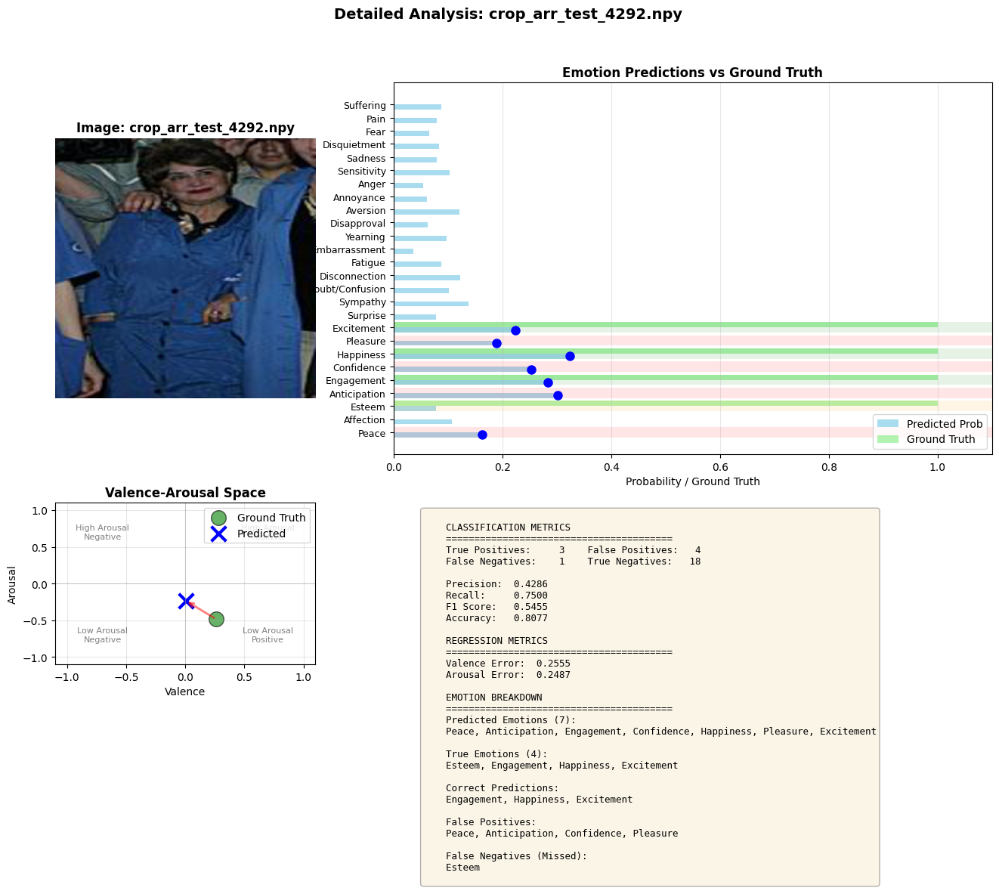

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_9_idx1401.png


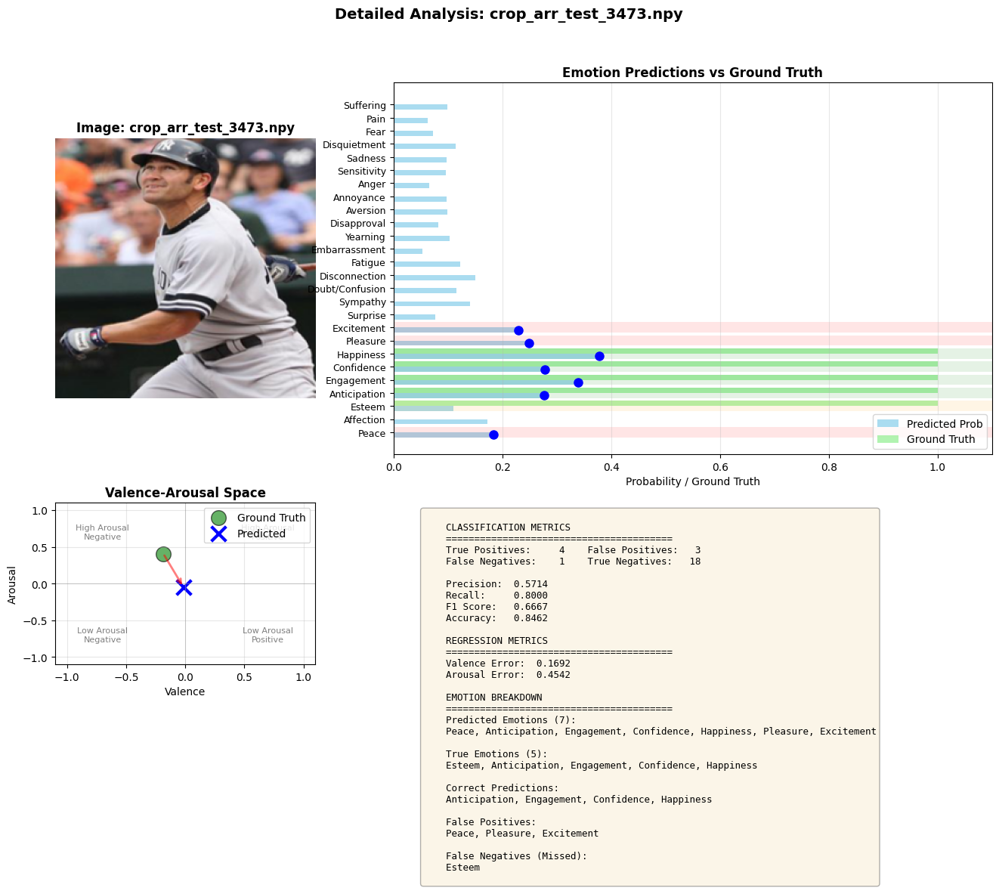

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_10_idx1913.png


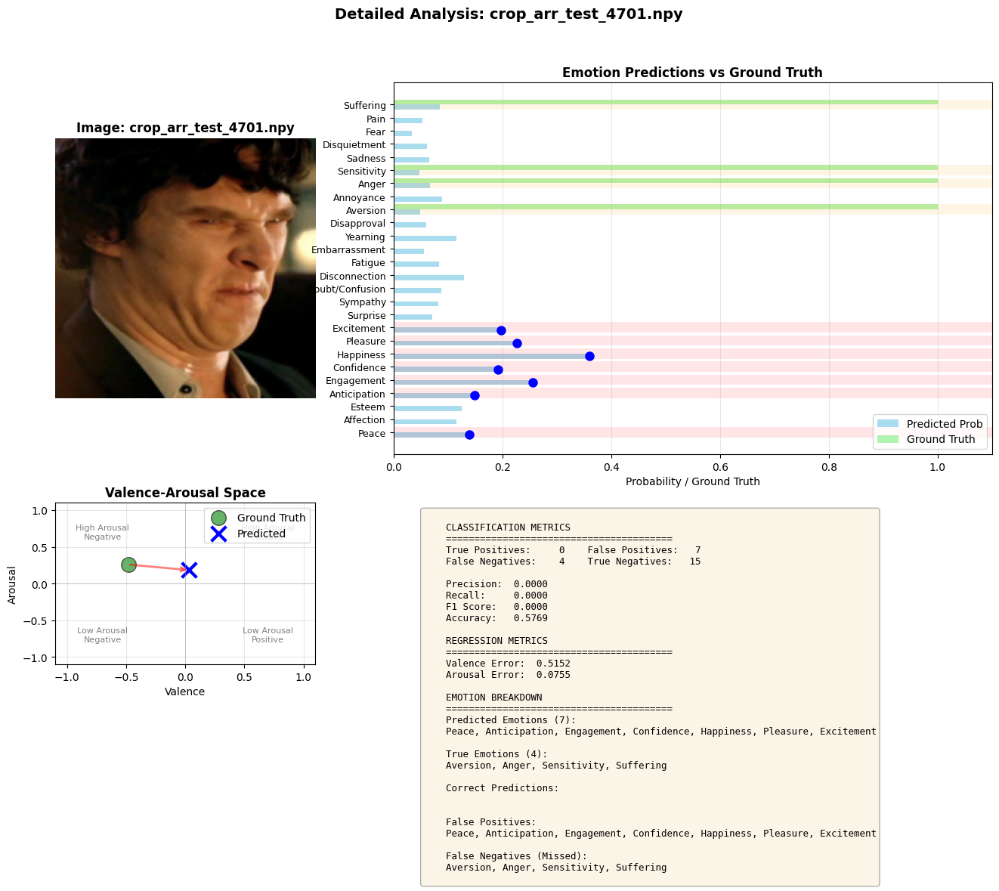

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_11_idx2199.png


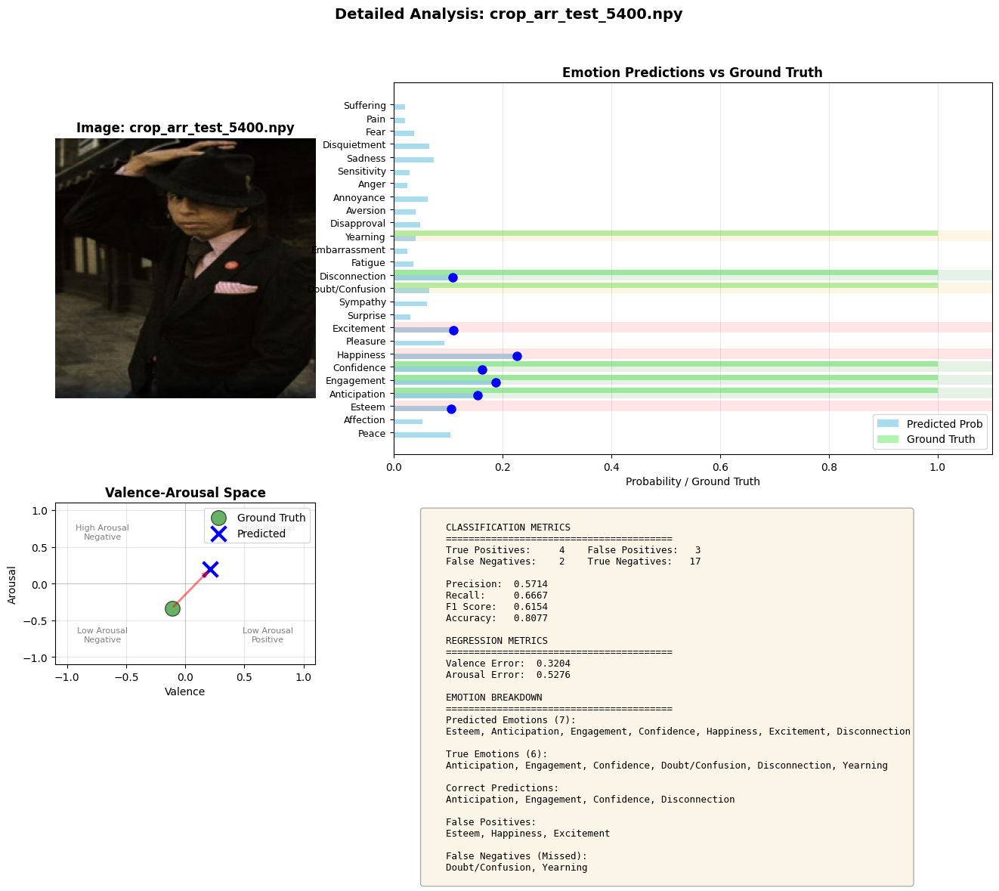

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_12_idx666.png


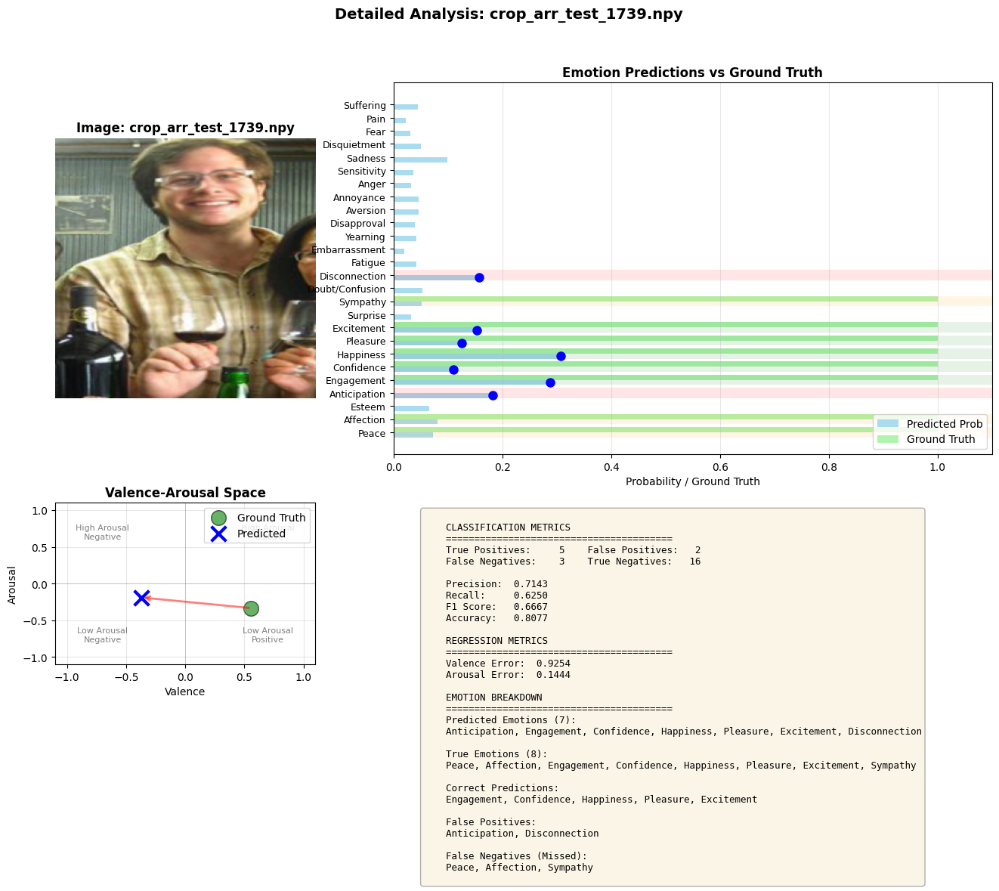

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_13_idx462.png


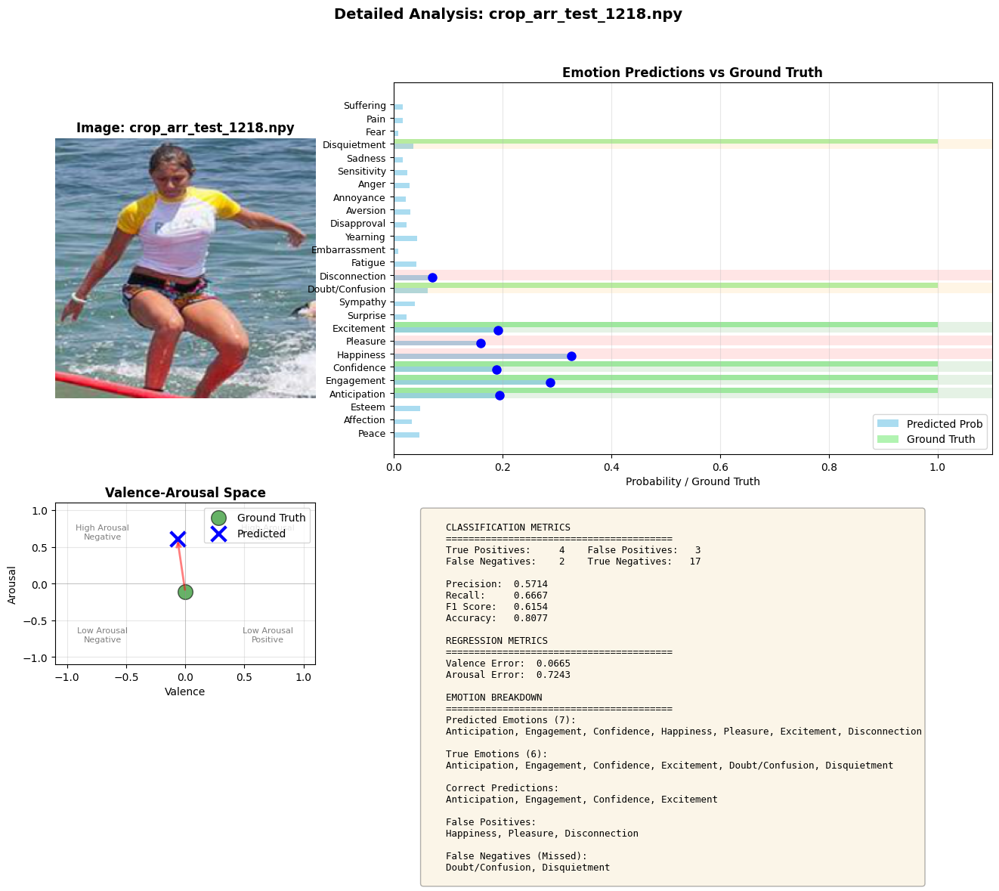

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_14_idx1938.png


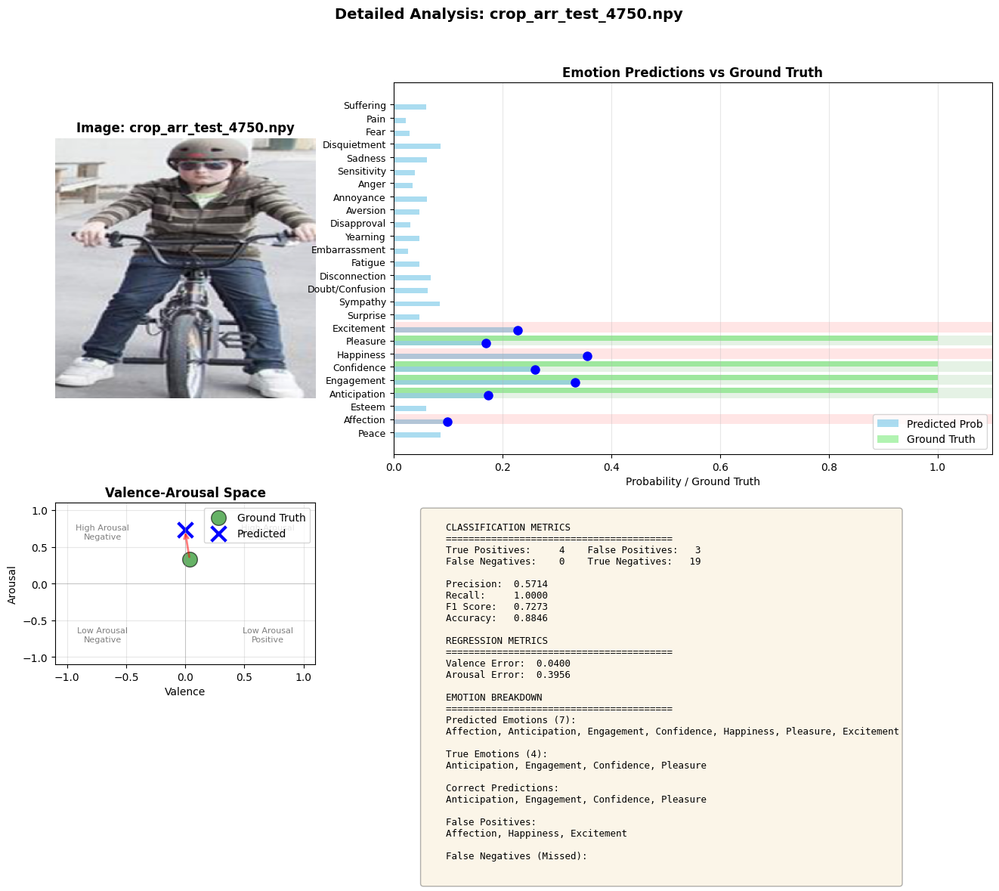

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_15_idx948.png


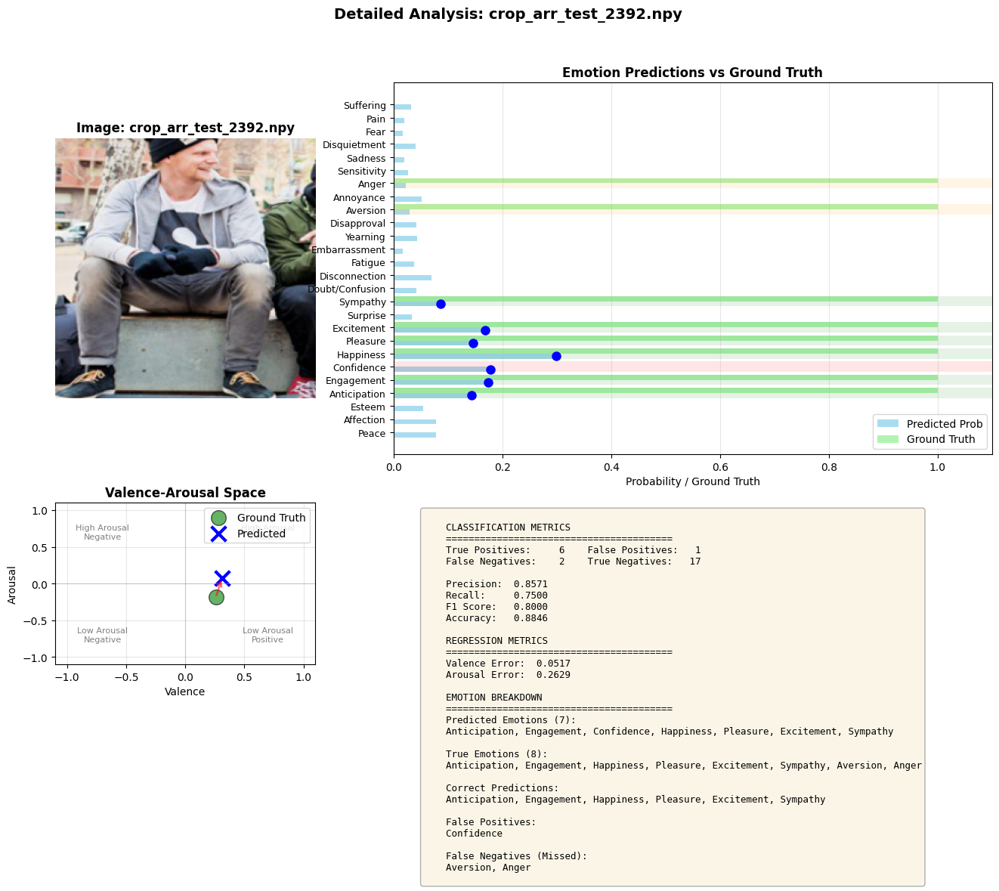

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_16_idx1286.png


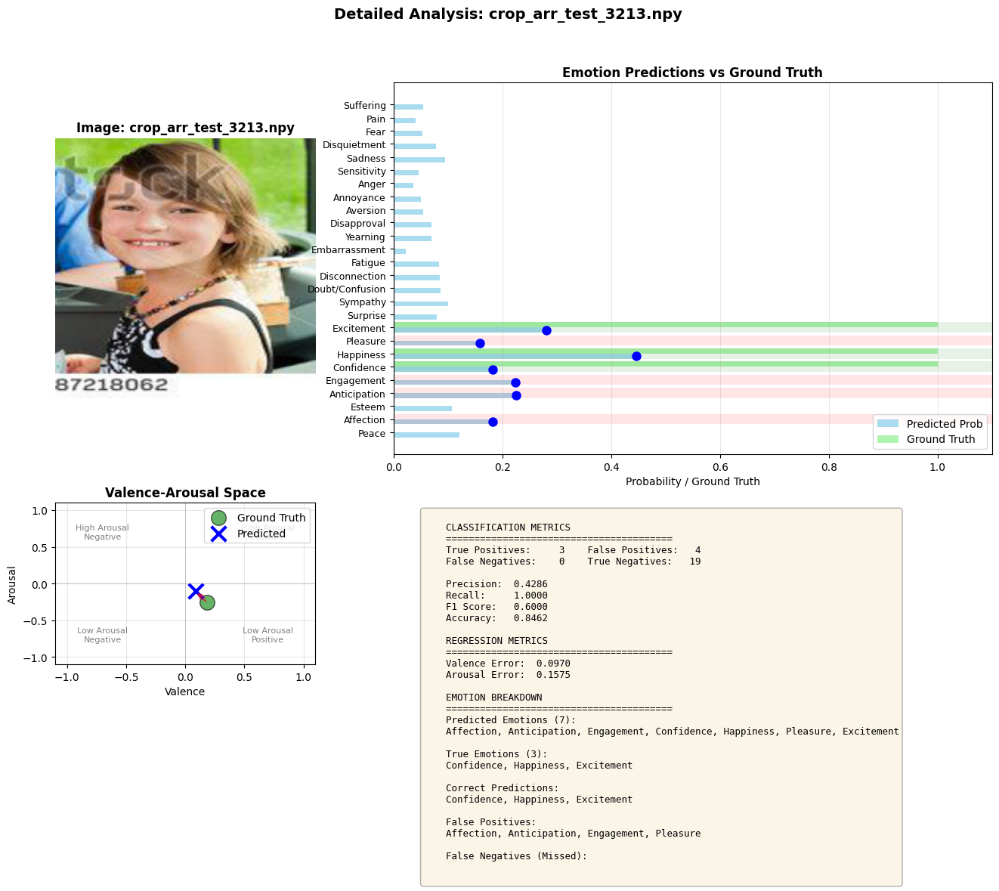

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_17_idx1530.png


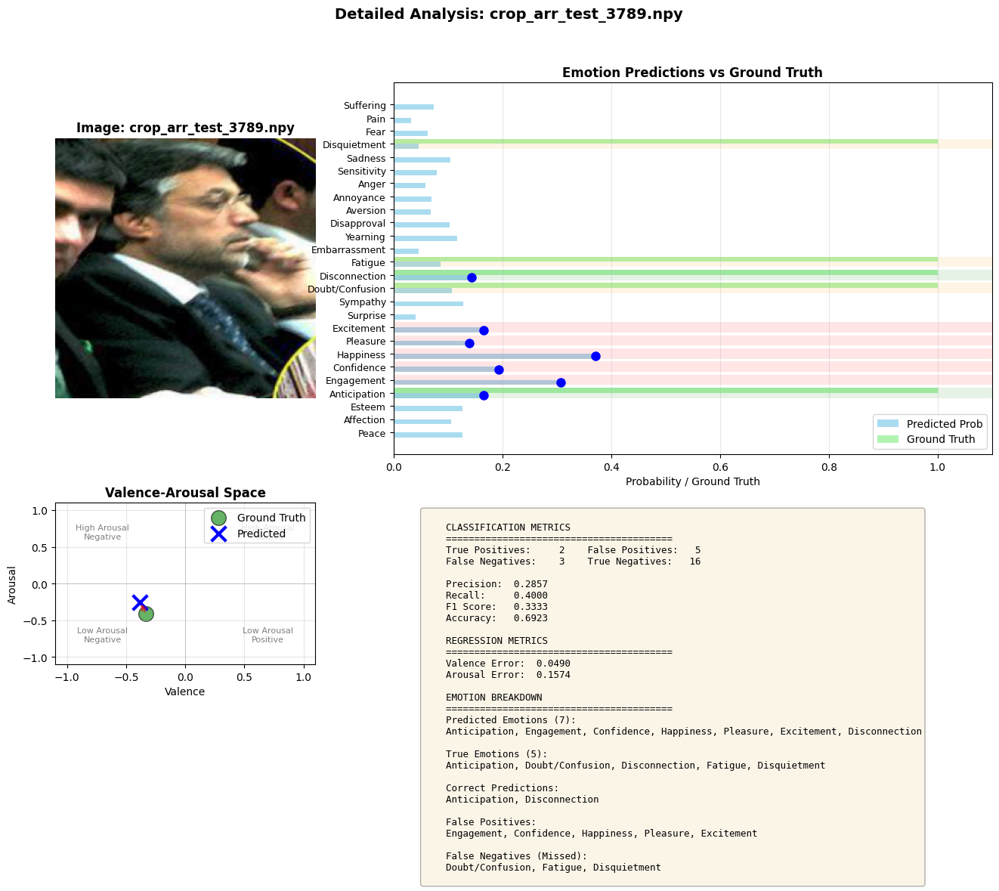

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_18_idx1678.png


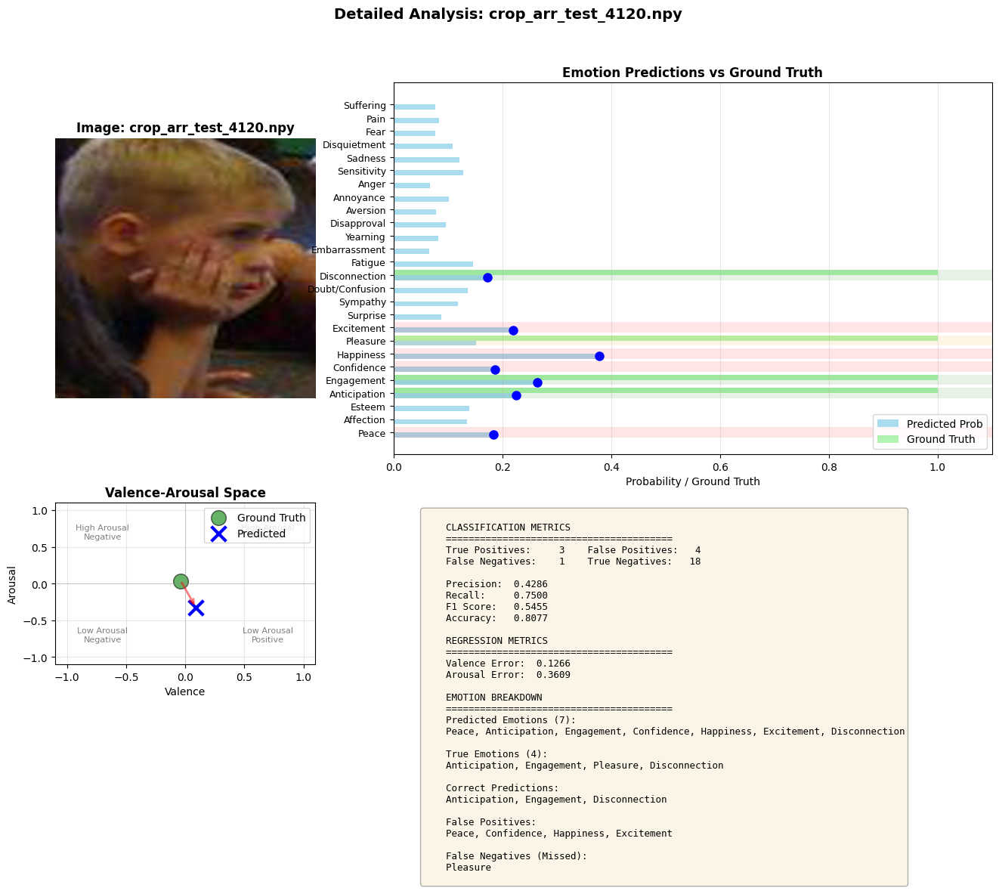

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_19_idx2082.png


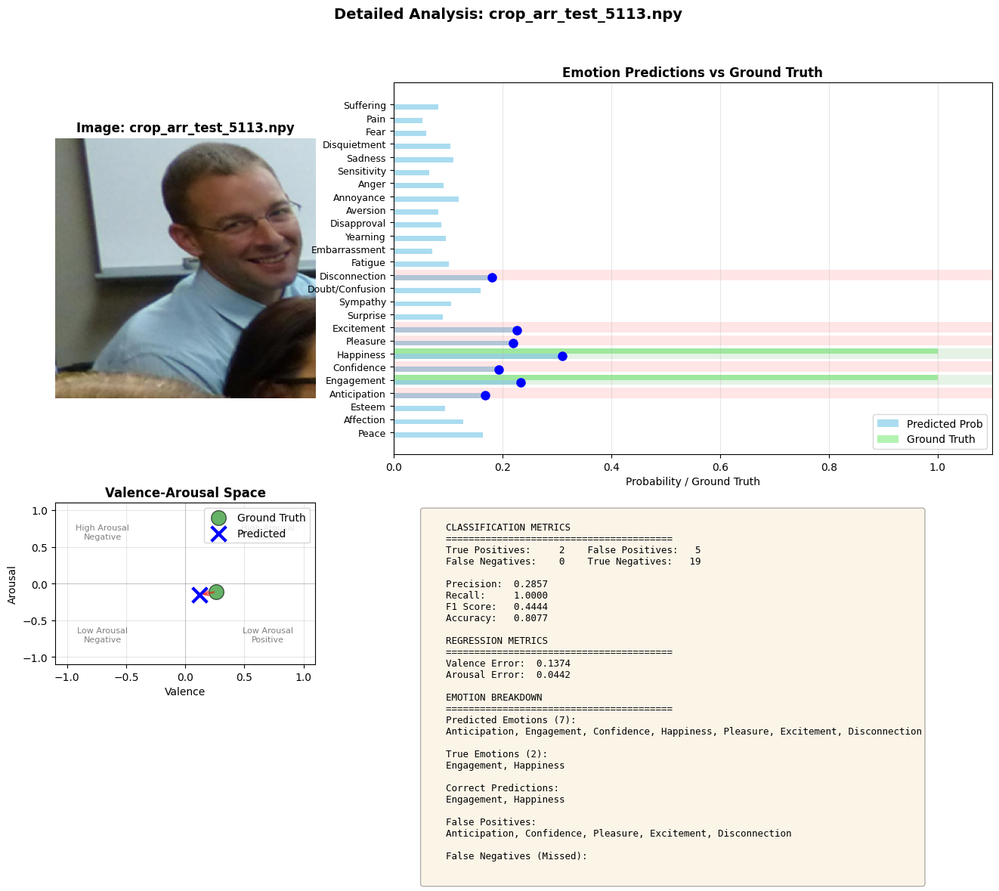

✓ Saved detailed visualization to: /kaggle/working/prediction_review/detailed_sample_20_idx2063.png


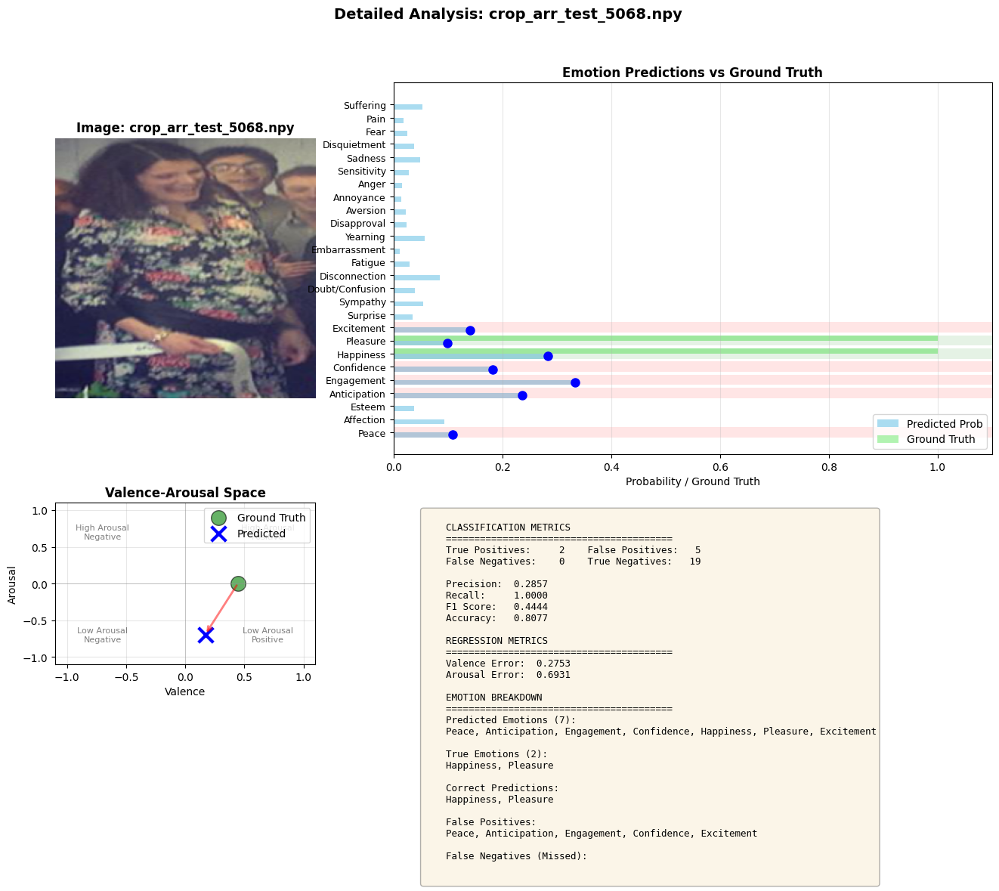


Creating emotion confusion heatmap...
✓ Saved confusion heatmap to: /kaggle/working/prediction_review/emotion_confusion_heatmap.png


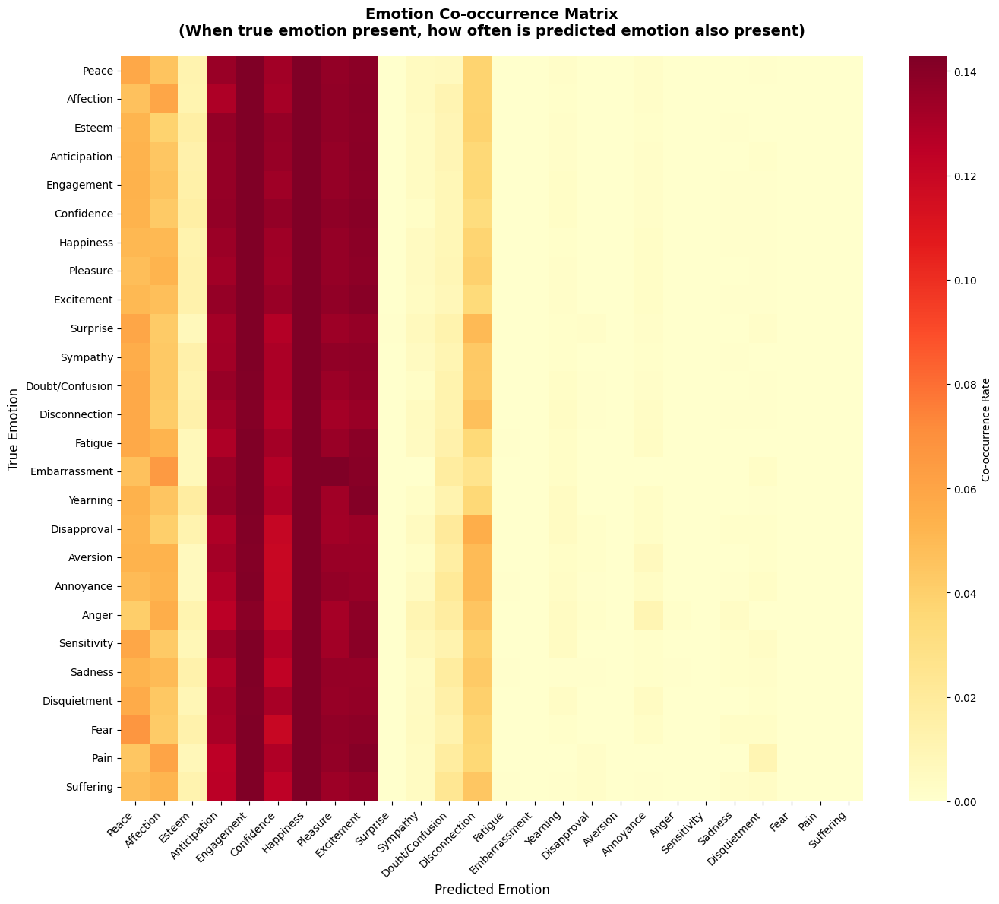


✅ Review complete! All visualizations saved to: /kaggle/working/prediction_review



In [23]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.gridspec import GridSpec
import seaborn as sns

# ============================================================================
# VISUALIZATION FUNCTIONS
# ============================================================================

def visualize_predictions(
    results,
    test_dataset,
    num_samples=20,
    samples_per_row=4,
    output_path=None,
    sort_by='random',  # 'random', 'best', 'worst', 'confidence'
    figsize_per_sample=(5, 6)
):
    """
    Visualize predictions with ground truth labels and images
    
    Args:
        results: Dictionary from run_inference()
        test_dataset: KaggleEmotionTestDataset instance
        num_samples: Number of samples to visualize
        samples_per_row: Number of samples per row in the grid
        output_path: Path to save figure (optional)
        sort_by: How to select samples
        figsize_per_sample: Size of each subplot
    """
    
    if not test_dataset.has_labels:
        print("⚠️ Test dataset has no labels for comparison!")
        return
    
    # Select samples to visualize
    indices = select_samples_for_visualization(results, sort_by, num_samples)
    
    # Calculate grid dimensions
    num_rows = (len(indices) + samples_per_row - 1) // samples_per_row
    
    fig = plt.figure(figsize=(
        figsize_per_sample[0] * samples_per_row,
        figsize_per_sample[1] * num_rows
    ))
    
    print(f"\n{'='*60}")
    print(f"Visualizing {len(indices)} predictions")
    print(f"{'='*60}\n")
    
    for plot_idx, sample_idx in enumerate(indices):
        # Load sample
        sample = test_dataset[sample_idx]
        
        # Get predictions and ground truth
        pred_emotions = results['emotion_predictions'][sample_idx]
        true_emotions = results['ground_truth'][sample_idx]
        pred_probs = results['emotion_probabilities'][sample_idx]
        
        pred_valence = results['valence'][sample_idx]
        pred_arousal = results['arousal'][sample_idx]
        true_valence = results['true_valence'][sample_idx]
        true_arousal = results['true_arousal'][sample_idx]
        
        # Create subplot
        ax = plt.subplot(num_rows, samples_per_row, plot_idx + 1)
        
        # Display image
        image = sample['image'].permute(1, 2, 0).numpy()
        ax.imshow(image)
        ax.axis('off')
        
        # Calculate metrics for this sample
        correct = (pred_emotions == true_emotions).sum()
        total = len(pred_emotions)
        accuracy = correct / total
        
        # True positives, false positives, false negatives
        tp = ((pred_emotions == 1) & (true_emotions == 1)).sum()
        fp = ((pred_emotions == 1) & (true_emotions == 0)).sum()
        fn = ((pred_emotions == 0) & (true_emotions == 1)).sum()
        
        # Sample F1 score
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
        
        # Title with metrics
        title = f"{sample['filename']}\n"
        title += f"F1: {f1:.3f} | Acc: {accuracy:.3f}\n"
        title += f"V: {pred_valence:.2f}({true_valence:.2f}) | "
        title += f"A: {pred_arousal:.2f}({true_arousal:.2f})"
        
        ax.set_title(title, fontsize=9, pad=10)
        
        # Add emotion labels at bottom
        pred_emotions_list = [EMOTION_COLUMNS[i] for i in range(26) if pred_emotions[i] == 1]
        true_emotions_list = [EMOTION_COLUMNS[i] for i in range(26) if true_emotions[i] == 1]
        
        # Correct predictions (green), false positives (red), false negatives (orange)
        correct_preds = set(pred_emotions_list) & set(true_emotions_list)
        false_positives = set(pred_emotions_list) - set(true_emotions_list)
        false_negatives = set(true_emotions_list) - set(pred_emotions_list)
        
        # Text box at bottom
        text_y_pos = -0.15
        text_lines = []
        
        if correct_preds:
            text_lines.append("✓ " + ", ".join(sorted(correct_preds)[:3]))
        if false_positives:
            text_lines.append("✗ " + ", ".join(sorted(false_positives)[:2]))
        if false_negatives:
            text_lines.append("◯ " + ", ".join(sorted(false_negatives)[:2]))
        
        ax.text(0.5, text_y_pos, "\n".join(text_lines),
                transform=ax.transAxes,
                fontsize=7,
                ha='center',
                va='top',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    
    if output_path:
        plt.savefig(output_path, dpi=150, bbox_inches='tight')
        print(f"✓ Saved visualization to: {output_path}")
    
    plt.show()


def visualize_detailed_comparison(
    results,
    test_dataset,
    sample_idx,
    output_path=None
):
    """
    Detailed visualization for a single sample with emotion bars
    
    Args:
        results: Dictionary from run_inference()
        test_dataset: KaggleEmotionTestDataset instance
        sample_idx: Index of sample to visualize
        output_path: Path to save figure (optional)
    """
    
    if not test_dataset.has_labels:
        print("⚠️ Test dataset has no labels for comparison!")
        return
    
    # Load sample
    sample = test_dataset[sample_idx]
    
    # Get predictions and ground truth
    pred_emotions = results['emotion_predictions'][sample_idx]
    true_emotions = results['ground_truth'][sample_idx]
    pred_probs = results['emotion_probabilities'][sample_idx]
    
    pred_valence = results['valence'][sample_idx]
    pred_arousal = results['arousal'][sample_idx]
    true_valence = results['true_valence'][sample_idx]
    true_arousal = results['true_arousal'][sample_idx]
    
    # Create figure with GridSpec
    fig = plt.figure(figsize=(16, 10))
    gs = GridSpec(3, 3, figure=fig, hspace=0.3, wspace=0.3)
    
    # 1. Image
    ax_img = fig.add_subplot(gs[0:2, 0])
    image = sample['image'].permute(1, 2, 0).numpy()
    ax_img.imshow(image)
    ax_img.axis('off')
    ax_img.set_title(f"Image: {sample['filename']}", fontsize=12, fontweight='bold')
    
    # 2. Emotion comparison bars
    ax_emotions = fig.add_subplot(gs[0:2, 1:3])
    
    # Prepare data
    y_pos = np.arange(26)
    
    # Create horizontal bars
    ax_emotions.barh(y_pos - 0.2, pred_probs, 0.4, 
                     label='Predicted Prob', color='skyblue', alpha=0.7)
    ax_emotions.barh(y_pos + 0.2, true_emotions, 0.4,
                     label='Ground Truth', color='lightgreen', alpha=0.7)
    
    # Mark predictions
    for i in range(26):
        if pred_emotions[i] == 1:
            ax_emotions.plot(pred_probs[i], i - 0.2, 'o', color='blue', markersize=8)
    
    ax_emotions.set_yticks(y_pos)
    ax_emotions.set_yticklabels(EMOTION_COLUMNS, fontsize=9)
    ax_emotions.set_xlabel('Probability / Ground Truth', fontsize=10)
    ax_emotions.set_title('Emotion Predictions vs Ground Truth', fontsize=12, fontweight='bold')
    ax_emotions.legend(loc='lower right')
    ax_emotions.grid(axis='x', alpha=0.3)
    ax_emotions.set_xlim([0, 1.1])
    
    # Highlight correct/incorrect predictions
    for i in range(26):
        if pred_emotions[i] == 1 and true_emotions[i] == 1:
            ax_emotions.axhspan(i-0.4, i+0.4, facecolor='green', alpha=0.1)
        elif pred_emotions[i] == 1 and true_emotions[i] == 0:
            ax_emotions.axhspan(i-0.4, i+0.4, facecolor='red', alpha=0.1)
        elif pred_emotions[i] == 0 and true_emotions[i] == 1:
            ax_emotions.axhspan(i-0.4, i+0.4, facecolor='orange', alpha=0.1)
    
    # 3. Valence-Arousal plot
    ax_va = fig.add_subplot(gs[2, 0])
    
    # Plot quadrants
    ax_va.axhline(0, color='gray', linewidth=0.5, alpha=0.5)
    ax_va.axvline(0, color='gray', linewidth=0.5, alpha=0.5)
    
    # Plot predictions
    ax_va.scatter(true_valence, true_arousal, s=200, c='green', 
                 marker='o', label='Ground Truth', alpha=0.6, edgecolors='black')
    ax_va.scatter(pred_valence, pred_arousal, s=200, c='blue',
                 marker='x', label='Predicted', linewidths=3)
    
    # Draw arrow from true to predicted
    ax_va.annotate('', xy=(pred_valence, pred_arousal), 
                   xytext=(true_valence, true_arousal),
                   arrowprops=dict(arrowstyle='->', lw=2, color='red', alpha=0.5))
    
    ax_va.set_xlim([-1.1, 1.1])
    ax_va.set_ylim([-1.1, 1.1])
    ax_va.set_xlabel('Valence', fontsize=10)
    ax_va.set_ylabel('Arousal', fontsize=10)
    ax_va.set_title('Valence-Arousal Space', fontsize=12, fontweight='bold')
    ax_va.legend(loc='upper right')
    ax_va.grid(True, alpha=0.3)
    
    # Add quadrant labels
    ax_va.text(0.7, 0.7, 'High Arousal\nPositive', ha='center', va='center', 
              fontsize=8, alpha=0.5)
    ax_va.text(-0.7, 0.7, 'High Arousal\nNegative', ha='center', va='center',
              fontsize=8, alpha=0.5)
    ax_va.text(0.7, -0.7, 'Low Arousal\nPositive', ha='center', va='center',
              fontsize=8, alpha=0.5)
    ax_va.text(-0.7, -0.7, 'Low Arousal\nNegative', ha='center', va='center',
              fontsize=8, alpha=0.5)
    
    # 4. Metrics summary
    ax_metrics = fig.add_subplot(gs[2, 1:3])
    ax_metrics.axis('off')
    
    # Calculate metrics
    tp = ((pred_emotions == 1) & (true_emotions == 1)).sum()
    fp = ((pred_emotions == 1) & (true_emotions == 0)).sum()
    fn = ((pred_emotions == 0) & (true_emotions == 1)).sum()
    tn = ((pred_emotions == 0) & (true_emotions == 0)).sum()
    
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    
    valence_error = abs(pred_valence - true_valence)
    arousal_error = abs(pred_arousal - true_arousal)
    
    # Create metrics text
    metrics_text = f"""
    CLASSIFICATION METRICS
    {'='*40}
    True Positives:    {tp:2d}    False Positives:  {fp:2d}
    False Negatives:   {fn:2d}    True Negatives:   {tn:2d}
    
    Precision:  {precision:.4f}
    Recall:     {recall:.4f}
    F1 Score:   {f1:.4f}
    Accuracy:   {accuracy:.4f}
    
    REGRESSION METRICS
    {'='*40}
    Valence Error:  {valence_error:.4f}
    Arousal Error:  {arousal_error:.4f}
    
    EMOTION BREAKDOWN
    {'='*40}
    Predicted Emotions ({int(pred_emotions.sum())}):
    {', '.join([EMOTION_COLUMNS[i] for i in range(26) if pred_emotions[i] == 1])}
    
    True Emotions ({int(true_emotions.sum())}):
    {', '.join([EMOTION_COLUMNS[i] for i in range(26) if true_emotions[i] == 1])}
    
    Correct Predictions:
    {', '.join([EMOTION_COLUMNS[i] for i in range(26) if pred_emotions[i] == 1 and true_emotions[i] == 1])}
    
    False Positives:
    {', '.join([EMOTION_COLUMNS[i] for i in range(26) if pred_emotions[i] == 1 and true_emotions[i] == 0])}
    
    False Negatives (Missed):
    {', '.join([EMOTION_COLUMNS[i] for i in range(26) if pred_emotions[i] == 0 and true_emotions[i] == 1])}
    """
    
    ax_metrics.text(0.05, 0.95, metrics_text, transform=ax_metrics.transAxes,
                   fontsize=9, verticalalignment='top', family='monospace',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3))
    
    plt.suptitle(f'Detailed Analysis: {sample["filename"]}', 
                fontsize=14, fontweight='bold', y=0.98)
    
    if output_path:
        plt.savefig(output_path, dpi=150, bbox_inches='tight')
        print(f"✓ Saved detailed visualization to: {output_path}")
    
    plt.show()


def select_samples_for_visualization(results, sort_by, num_samples):
    """
    Select samples to visualize based on criteria
    
    Args:
        results: Dictionary from run_inference()
        sort_by: 'random', 'best', 'worst', 'confidence'
        num_samples: Number of samples to select
    
    Returns:
        List of sample indices
    """
    
    if sort_by == 'random':
        indices = np.random.choice(len(results['filenames']), 
                                  size=min(num_samples, len(results['filenames'])),
                                  replace=False)
    
    elif sort_by == 'best' and 'ground_truth' in results:
        # Calculate F1 per sample
        f1_scores = []
        for i in range(len(results['filenames'])):
            pred = results['emotion_predictions'][i]
            true = results['ground_truth'][i]
            tp = ((pred == 1) & (true == 1)).sum()
            fp = ((pred == 1) & (true == 0)).sum()
            fn = ((pred == 0) & (true == 1)).sum()
            
            precision = tp / (tp + fp) if (tp + fp) > 0 else 0
            recall = tp / (tp + fn) if (tp + fn) > 0 else 0
            f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
            f1_scores.append(f1)
        
        indices = np.argsort(f1_scores)[-num_samples:][::-1]
    
    elif sort_by == 'worst' and 'ground_truth' in results:
        # Calculate F1 per sample
        f1_scores = []
        for i in range(len(results['filenames'])):
            pred = results['emotion_predictions'][i]
            true = results['ground_truth'][i]
            tp = ((pred == 1) & (true == 1)).sum()
            fp = ((pred == 1) & (true == 0)).sum()
            fn = ((pred == 0) & (true == 1)).sum()
            
            precision = tp / (tp + fp) if (tp + fp) > 0 else 0
            recall = tp / (tp + fn) if (tp + fn) > 0 else 0
            f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
            f1_scores.append(f1)
        
        indices = np.argsort(f1_scores)[:num_samples]
    
    elif sort_by == 'confidence':
        # Highest average prediction confidence
        avg_confidence = results['emotion_probabilities'].max(axis=1)
        indices = np.argsort(avg_confidence)[-num_samples:][::-1]
    
    else:
        # Default to random
        indices = np.random.choice(len(results['filenames']), 
                                  size=min(num_samples, len(results['filenames'])),
                                  replace=False)
    
    return indices


def create_confusion_heatmap(results, output_path=None):
    """
    Create a heatmap showing which emotions are confused with each other
    
    Args:
        results: Dictionary from run_inference()
        output_path: Path to save figure (optional)
    """
    
    if 'ground_truth' not in results:
        print("⚠️ No ground truth available for confusion analysis!")
        return
    
    # Create confusion matrix: rows=true, cols=predicted
    confusion = np.zeros((26, 26))
    
    for i in range(len(results['filenames'])):
        true_emotions = results['ground_truth'][i]
        pred_emotions = results['emotion_predictions'][i]
        
        for true_idx in range(26):
            if true_emotions[true_idx] == 1:
                for pred_idx in range(26):
                    if pred_emotions[pred_idx] == 1:
                        confusion[true_idx, pred_idx] += 1
    
    # Normalize by row (true emotion count)
    row_sums = confusion.sum(axis=1, keepdims=True)
    confusion_norm = np.divide(confusion, row_sums, 
                               where=row_sums!=0, 
                               out=np.zeros_like(confusion))
    
    # Plot
    fig, ax = plt.subplots(figsize=(14, 12))
    
    sns.heatmap(confusion_norm, annot=False, fmt='.2f', cmap='YlOrRd',
                xticklabels=EMOTION_COLUMNS, yticklabels=EMOTION_COLUMNS,
                ax=ax, cbar_kws={'label': 'Co-occurrence Rate'})
    
    ax.set_xlabel('Predicted Emotion', fontsize=12)
    ax.set_ylabel('True Emotion', fontsize=12)
    ax.set_title('Emotion Co-occurrence Matrix\n(When true emotion present, how often is predicted emotion also present)',
                fontsize=14, fontweight='bold', pad=20)
    
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    
    if output_path:
        plt.savefig(output_path, dpi=150, bbox_inches='tight')
        print(f"✓ Saved confusion heatmap to: {output_path}")
    
    plt.show()


# ============================================================================
# INTEGRATED REVIEW FUNCTION
# ============================================================================

def review_predictions_with_visualization(
    model_checkpoint_path,
    test_csv_path,
    img_arrays_dir,
    output_dir='./review_results',
    num_samples=20,
    detailed_samples=5,
    sort_by='random'
):
    """
    Complete pipeline: run inference and create visualizations
    
    Args:
        model_checkpoint_path: Path to trained model
        test_csv_path: Path to test CSV (must have labels)
        img_arrays_dir: Directory with images
        output_dir: Where to save results
        num_samples: Number of samples for grid visualization
        detailed_samples: Number of samples for detailed analysis
        sort_by: How to select samples ('random', 'best', 'worst', 'confidence')
    """
    
    os.makedirs(output_dir, exist_ok=True)
    
    # Run inference
    print("Running inference...")
    results = run_inference(
        model_checkpoint_path=model_checkpoint_path,
        test_csv_path=test_csv_path,
        img_arrays_dir=img_arrays_dir,
        output_dir=output_dir,
        batch_size=32,
        prediction_method='top_k',
        k=7,
        use_tta=True,
        save_probabilities=True
    )
    
    # Create dataset for visualization
    test_dataset = KaggleEmotionTestDataset(
        csv_file=test_csv_path,
        img_arrays_dir=img_arrays_dir
    )
    
    if not test_dataset.has_labels:
        print("⚠️ Test dataset has no labels. Skipping visualization.")
        return results
    
    # 1. Grid visualization
    print(f"\nCreating grid visualization of {num_samples} samples...")
    visualize_predictions(
        results=results,
        test_dataset=test_dataset,
        num_samples=num_samples,
        samples_per_row=4,
        output_path=os.path.join(output_dir, f'predictions_grid_{sort_by}.png'),
        sort_by=sort_by
    )
    
    # 2. Detailed visualizations for selected samples
    print(f"\nCreating detailed visualizations for {detailed_samples} samples...")
    indices = select_samples_for_visualization(results, sort_by, detailed_samples)
    
    for i, idx in enumerate(indices):
        visualize_detailed_comparison(
            results=results,
            test_dataset=test_dataset,
            sample_idx=idx,
            output_path=os.path.join(output_dir, f'detailed_sample_{i+1}_idx{idx}.png')
        )
    
    # 3. Confusion heatmap
    print("\nCreating emotion confusion heatmap...")
    create_confusion_heatmap(
        results=results,
        output_path=os.path.join(output_dir, 'emotion_confusion_heatmap.png')
    )
    
    print(f"\n{'='*60}")
    print(f"✅ Review complete! All visualizations saved to: {output_dir}")
    print(f"{'='*60}\n")
    
    return results

if __name__ == "__main__":
    # Full review with visualizations
    results = review_predictions_with_visualization(
        model_checkpoint_path='/kaggle/input/emotic/best_model (7).pth',
        test_csv_path='/kaggle/input/emotic/normalized_dataset_test.csv',
        img_arrays_dir='/kaggle/input/emotic/archive_emot 2/archive_emot/img_arrs',
        output_dir='/kaggle/working/prediction_review',
        num_samples=20,
        detailed_samples=20,
        sort_by='random'  # Try 'best', 'worst', 'confidence'
    )
    


In [21]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.gridspec import GridSpec
import seaborn as sns
import numpy as np
import os

# ============================================================================
# METRIC CALCULATION FUNCTIONS
# ============================================================================

def calculate_regression_metrics(results):
    """
    Calculate MAE and RMSE for valence and arousal predictions
    
    Args:
        results: Dictionary from run_inference()
    
    Returns:
        Dictionary with regression metrics
    """
    if 'true_valence' not in results or 'true_arousal' not in results:
        print("⚠️ No ground truth available for regression metrics!")
        return None
    
    pred_valence = np.array(results['valence'])
    true_valence = np.array(results['true_valence'])
    pred_arousal = np.array(results['arousal'])
    true_arousal = np.array(results['true_arousal'])
    
    # Valence metrics
    valence_mae = np.mean(np.abs(pred_valence - true_valence))
    valence_rmse = np.sqrt(np.mean((pred_valence - true_valence) ** 2))
    
    # Arousal metrics
    arousal_mae = np.mean(np.abs(pred_arousal - true_arousal))
    arousal_rmse = np.sqrt(np.mean((pred_arousal - true_arousal) ** 2))
    
    # Combined metrics (Euclidean distance in V-A space)
    euclidean_distances = np.sqrt(
        (pred_valence - true_valence) ** 2 + 
        (pred_arousal - true_arousal) ** 2
    )
    mean_euclidean = np.mean(euclidean_distances)
    
    metrics = {
        'valence_mae': valence_mae,
        'valence_rmse': valence_rmse,
        'arousal_mae': arousal_mae,
        'arousal_rmse': arousal_rmse,
        'mean_euclidean_distance': mean_euclidean,
        'valence_errors': pred_valence - true_valence,
        'arousal_errors': pred_arousal - true_arousal,
        'euclidean_distances': euclidean_distances
    }
    
    return metrics


def print_regression_metrics(metrics):
    """Print regression metrics in a formatted way"""
    if metrics is None:
        return
    
    print(f"\n{'='*60}")
    print(f"{'REGRESSION METRICS (Valence & Arousal)':^60}")
    print(f"{'='*60}")
    print(f"\n{'Valence Metrics:':^60}")
    print(f"  MAE:  {metrics['valence_mae']:.6f}")
    print(f"  RMSE: {metrics['valence_rmse']:.6f}")
    print(f"\n{'Arousal Metrics:':^60}")
    print(f"  MAE:  {metrics['arousal_mae']:.6f}")
    print(f"  RMSE: {metrics['arousal_rmse']:.6f}")
    print(f"\n{'Combined Metrics:':^60}")
    print(f"  Mean Euclidean Distance: {metrics['mean_euclidean_distance']:.6f}")
    print(f"\n{'='*60}\n")


# ============================================================================
# VISUALIZATION FUNCTIONS (ENHANCED)
# ============================================================================

def visualize_predictions(
    results,
    test_dataset,
    num_samples=20,
    samples_per_row=4,
    output_path=None,
    sort_by='random',
    figsize_per_sample=(5, 6)
):
    """
    Visualize predictions with ground truth labels and images
    """
    
    if not test_dataset.has_labels:
        print("⚠️ Test dataset has no labels for comparison!")
        return
    
    # Calculate and print regression metrics
    regression_metrics = calculate_regression_metrics(results)
    if regression_metrics:
        print_regression_metrics(regression_metrics)
    
    # Select samples to visualize
    indices = select_samples_for_visualization(results, sort_by, num_samples)
    
    # Calculate grid dimensions
    num_rows = (len(indices) + samples_per_row - 1) // samples_per_row
    
    fig = plt.figure(figsize=(
        figsize_per_sample[0] * samples_per_row,
        figsize_per_sample[1] * num_rows
    ))
    
    print(f"\n{'='*60}")
    print(f"Visualizing {len(indices)} predictions")
    print(f"{'='*60}\n")
    
    for plot_idx, sample_idx in enumerate(indices):
        # Load sample
        sample = test_dataset[sample_idx]
        
        # Get predictions and ground truth
        pred_emotions = results['emotion_predictions'][sample_idx]
        true_emotions = results['ground_truth'][sample_idx]
        pred_probs = results['emotion_probabilities'][sample_idx]
        
        pred_valence = results['valence'][sample_idx]
        pred_arousal = results['arousal'][sample_idx]
        true_valence = results['true_valence'][sample_idx]
        true_arousal = results['true_arousal'][sample_idx]
        
        # Create subplot
        ax = plt.subplot(num_rows, samples_per_row, plot_idx + 1)
        
        # Display image
        image = sample['image'].permute(1, 2, 0).numpy()
        ax.imshow(image)
        ax.axis('off')
        
        # Calculate metrics for this sample
        correct = (pred_emotions == true_emotions).sum()
        total = len(pred_emotions)
        accuracy = correct / total
        
        # True positives, false positives, false negatives
        tp = ((pred_emotions == 1) & (true_emotions == 1)).sum()
        fp = ((pred_emotions == 1) & (true_emotions == 0)).sum()
        fn = ((pred_emotions == 0) & (true_emotions == 1)).sum()
        
        # Sample F1 score
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
        
        # Regression errors
        v_mae = abs(pred_valence - true_valence)
        a_mae = abs(pred_arousal - true_arousal)
        euclidean = np.sqrt((pred_valence - true_valence)**2 + (pred_arousal - true_arousal)**2)
        
        # Title with metrics
        title = f"{sample['filename']}\n"
        title += f"F1: {f1:.3f} | Acc: {accuracy:.3f}\n"
        title += f"V: {pred_valence:.2f}({true_valence:.2f}) MAE:{v_mae:.3f}\n"
        title += f"A: {pred_arousal:.2f}({true_arousal:.2f}) MAE:{a_mae:.3f}\n"
        title += f"Euclidean: {euclidean:.3f}"
        
        ax.set_title(title, fontsize=8, pad=10)
        
        # Add emotion labels at bottom
        pred_emotions_list = [EMOTION_COLUMNS[i] for i in range(26) if pred_emotions[i] == 1]
        true_emotions_list = [EMOTION_COLUMNS[i] for i in range(26) if true_emotions[i] == 1]
        
        # Correct predictions (green), false positives (red), false negatives (orange)
        correct_preds = set(pred_emotions_list) & set(true_emotions_list)
        false_positives = set(pred_emotions_list) - set(true_emotions_list)
        false_negatives = set(true_emotions_list) - set(pred_emotions_list)
        
        # Text box at bottom
        text_y_pos = -0.15
        text_lines = []
        
        if correct_preds:
            text_lines.append("✓ " + ", ".join(sorted(correct_preds)[:3]))
        if false_positives:
            text_lines.append("✗ " + ", ".join(sorted(false_positives)[:2]))
        if false_negatives:
            text_lines.append("◯ " + ", ".join(sorted(false_negatives)[:2]))
        
        ax.text(0.5, text_y_pos, "\n".join(text_lines),
                transform=ax.transAxes,
                fontsize=7,
                ha='center',
                va='top',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    
    if output_path:
        plt.savefig(output_path, dpi=150, bbox_inches='tight')
        print(f"✓ Saved visualization to: {output_path}")
    
    plt.show()


def visualize_detailed_comparison(
    results,
    test_dataset,
    sample_idx,
    output_path=None
):
    """
    Detailed visualization for a single sample with emotion bars
    """
    
    if not test_dataset.has_labels:
        print("⚠️ Test dataset has no labels for comparison!")
        return
    
    # Load sample
    sample = test_dataset[sample_idx]
    
    # Get predictions and ground truth
    pred_emotions = results['emotion_predictions'][sample_idx]
    true_emotions = results['ground_truth'][sample_idx]
    pred_probs = results['emotion_probabilities'][sample_idx]
    
    pred_valence = results['valence'][sample_idx]
    pred_arousal = results['arousal'][sample_idx]
    true_valence = results['true_valence'][sample_idx]
    true_arousal = results['true_arousal'][sample_idx]
    
    # Create figure with GridSpec
    fig = plt.figure(figsize=(16, 10))
    gs = GridSpec(3, 3, figure=fig, hspace=0.3, wspace=0.3)
    
    # 1. Image
    ax_img = fig.add_subplot(gs[0:2, 0])
    image = sample['image'].permute(1, 2, 0).numpy()
    ax_img.imshow(image)
    ax_img.axis('off')
    ax_img.set_title(f"Image: {sample['filename']}", fontsize=12, fontweight='bold')
    
    # 2. Emotion comparison bars
    ax_emotions = fig.add_subplot(gs[0:2, 1:3])
    
    # Prepare data
    y_pos = np.arange(26)
    
    # Create horizontal bars
    ax_emotions.barh(y_pos - 0.2, pred_probs, 0.4, 
                     label='Predicted Prob', color='skyblue', alpha=0.7)
    ax_emotions.barh(y_pos + 0.2, true_emotions, 0.4,
                     label='Ground Truth', color='lightgreen', alpha=0.7)
    
    # Mark predictions
    for i in range(26):
        if pred_emotions[i] == 1:
            ax_emotions.plot(pred_probs[i], i - 0.2, 'o', color='blue', markersize=8)
    
    ax_emotions.set_yticks(y_pos)
    ax_emotions.set_yticklabels(EMOTION_COLUMNS, fontsize=9)
    ax_emotions.set_xlabel('Probability / Ground Truth', fontsize=10)
    ax_emotions.set_title('Emotion Predictions vs Ground Truth', fontsize=12, fontweight='bold')
    ax_emotions.legend(loc='lower right')
    ax_emotions.grid(axis='x', alpha=0.3)
    ax_emotions.set_xlim([0, 1.1])
    
    # Highlight correct/incorrect predictions
    for i in range(26):
        if pred_emotions[i] == 1 and true_emotions[i] == 1:
            ax_emotions.axhspan(i-0.4, i+0.4, facecolor='green', alpha=0.1)
        elif pred_emotions[i] == 1 and true_emotions[i] == 0:
            ax_emotions.axhspan(i-0.4, i+0.4, facecolor='red', alpha=0.1)
        elif pred_emotions[i] == 0 and true_emotions[i] == 1:
            ax_emotions.axhspan(i-0.4, i+0.4, facecolor='orange', alpha=0.1)
    
    # 3. Valence-Arousal plot
    ax_va = fig.add_subplot(gs[2, 0])
    
    # Plot quadrants
    ax_va.axhline(0, color='gray', linewidth=0.5, alpha=0.5)
    ax_va.axvline(0, color='gray', linewidth=0.5, alpha=0.5)
    
    # Plot predictions
    ax_va.scatter(true_valence, true_arousal, s=200, c='green', 
                 marker='o', label='Ground Truth', alpha=0.6, edgecolors='black')
    ax_va.scatter(pred_valence, pred_arousal, s=200, c='blue',
                 marker='x', label='Predicted', linewidths=3)
    
    # Draw arrow from true to predicted
    ax_va.annotate('', xy=(pred_valence, pred_arousal), 
                   xytext=(true_valence, true_arousal),
                   arrowprops=dict(arrowstyle='->', lw=2, color='red', alpha=0.5))
    
    # Calculate error
    v_error = abs(pred_valence - true_valence)
    a_error = abs(pred_arousal - true_arousal)
    euclidean = np.sqrt((pred_valence - true_valence)**2 + (pred_arousal - true_arousal)**2)
    
    ax_va.set_xlim([-1.1, 1.1])
    ax_va.set_ylim([-1.1, 1.1])
    ax_va.set_xlabel('Valence', fontsize=10)
    ax_va.set_ylabel('Arousal', fontsize=10)
    ax_va.set_title(f'Valence-Arousal Space\nEuclidean Error: {euclidean:.4f}', 
                   fontsize=12, fontweight='bold')
    ax_va.legend(loc='upper right')
    ax_va.grid(True, alpha=0.3)
    
    # Add quadrant labels
    ax_va.text(0.7, 0.7, 'High Arousal\nPositive', ha='center', va='center', 
              fontsize=8, alpha=0.5)
    ax_va.text(-0.7, 0.7, 'High Arousal\nNegative', ha='center', va='center',
              fontsize=8, alpha=0.5)
    ax_va.text(0.7, -0.7, 'Low Arousal\nPositive', ha='center', va='center',
              fontsize=8, alpha=0.5)
    ax_va.text(-0.7, -0.7, 'Low Arousal\nNegative', ha='center', va='center',
              fontsize=8, alpha=0.5)
    
    # 4. Metrics summary
    ax_metrics = fig.add_subplot(gs[2, 1:3])
    ax_metrics.axis('off')
    
    # Calculate metrics
    tp = ((pred_emotions == 1) & (true_emotions == 1)).sum()
    fp = ((pred_emotions == 1) & (true_emotions == 0)).sum()
    fn = ((pred_emotions == 0) & (true_emotions == 1)).sum()
    tn = ((pred_emotions == 0) & (true_emotions == 0)).sum()
    
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    
    valence_error = abs(pred_valence - true_valence)
    arousal_error = abs(pred_arousal - true_arousal)
    valence_squared_error = (pred_valence - true_valence) ** 2
    arousal_squared_error = (pred_arousal - true_arousal) ** 2
    
    # Create metrics text
    metrics_text = f"""
    CLASSIFICATION METRICS
    {'='*40}
    True Positives:    {tp:2d}    False Positives:  {fp:2d}
    False Negatives:   {fn:2d}    True Negatives:   {tn:2d}
    
    Precision:  {precision:.4f}
    Recall:     {recall:.4f}
    F1 Score:   {f1:.4f}
    Accuracy:   {accuracy:.4f}
    
    REGRESSION METRICS
    {'='*40}
    Valence:
      Predicted: {pred_valence:.4f}  |  True: {true_valence:.4f}
      MAE:  {valence_error:.4f}
      MSE:  {valence_squared_error:.4f}
      RMSE: {np.sqrt(valence_squared_error):.4f}
    
    Arousal:
      Predicted: {pred_arousal:.4f}  |  True: {true_arousal:.4f}
      MAE:  {arousal_error:.4f}
      MSE:  {arousal_squared_error:.4f}
      RMSE: {np.sqrt(arousal_squared_error):.4f}
    
    Combined:
      Euclidean Distance: {euclidean:.4f}
    
    EMOTION BREAKDOWN
    {'='*40}
    Predicted Emotions ({int(pred_emotions.sum())}):
    {', '.join([EMOTION_COLUMNS[i] for i in range(26) if pred_emotions[i] == 1]) or 'None'}
    
    True Emotions ({int(true_emotions.sum())}):
    {', '.join([EMOTION_COLUMNS[i] for i in range(26) if true_emotions[i] == 1]) or 'None'}
    
    Correct Predictions:
    {', '.join([EMOTION_COLUMNS[i] for i in range(26) if pred_emotions[i] == 1 and true_emotions[i] == 1]) or 'None'}
    
    False Positives:
    {', '.join([EMOTION_COLUMNS[i] for i in range(26) if pred_emotions[i] == 1 and true_emotions[i] == 0]) or 'None'}
    
    False Negatives (Missed):
    {', '.join([EMOTION_COLUMNS[i] for i in range(26) if pred_emotions[i] == 0 and true_emotions[i] == 1]) or 'None'}
    """
    
    ax_metrics.text(0.05, 0.95, metrics_text, transform=ax_metrics.transAxes,
                   fontsize=9, verticalalignment='top', family='monospace',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3))
    
    plt.suptitle(f'Detailed Analysis: {sample["filename"]}', 
                fontsize=14, fontweight='bold', y=0.98)
    
    if output_path:
        plt.savefig(output_path, dpi=150, bbox_inches='tight')
        print(f"✓ Saved detailed visualization to: {output_path}")
    
    plt.show()


def visualize_regression_errors(results, output_path=None):
    """
    Create visualizations for regression error analysis
    
    Args:
        results: Dictionary from run_inference()
        output_path: Path to save figure (optional)
    """
    regression_metrics = calculate_regression_metrics(results)
    if regression_metrics is None:
        return
    
    fig = plt.figure(figsize=(16, 10))
    gs = GridSpec(2, 3, figure=fig, hspace=0.3, wspace=0.3)
    
    # 1. Valence: Predicted vs True scatter
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.scatter(results['true_valence'], results['valence'], alpha=0.5, s=20)
    ax1.plot([-1, 1], [-1, 1], 'r--', lw=2, label='Perfect Prediction')
    ax1.set_xlabel('True Valence')
    ax1.set_ylabel('Predicted Valence')
    ax1.set_title(f'Valence: Predicted vs True\nMAE={regression_metrics["valence_mae"]:.4f}, RMSE={regression_metrics["valence_rmse"]:.4f}')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    ax1.set_xlim([-1.1, 1.1])
    ax1.set_ylim([-1.1, 1.1])
    
    # 2. Arousal: Predicted vs True scatter
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.scatter(results['true_arousal'], results['arousal'], alpha=0.5, s=20, color='orange')
    ax2.plot([-1, 1], [-1, 1], 'r--', lw=2, label='Perfect Prediction')
    ax2.set_xlabel('True Arousal')
    ax2.set_ylabel('Predicted Arousal')
    ax2.set_title(f'Arousal: Predicted vs True\nMAE={regression_metrics["arousal_mae"]:.4f}, RMSE={regression_metrics["arousal_rmse"]:.4f}')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    ax2.set_xlim([-1.1, 1.1])
    ax2.set_ylim([-1.1, 1.1])
    
    # 3. 2D Valence-Arousal space
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.scatter(results['true_valence'], results['true_arousal'], 
               alpha=0.3, s=30, c='green', label='True', marker='o')
    ax3.scatter(results['valence'], results['arousal'], 
               alpha=0.3, s=30, c='blue', label='Predicted', marker='x')
    ax3.axhline(0, color='gray', linewidth=0.5)
    ax3.axvline(0, color='gray', linewidth=0.5)
    ax3.set_xlabel('Valence')
    ax3.set_ylabel('Arousal')
    ax3.set_title(f'Valence-Arousal Space\nMean Euclidean Distance={regression_metrics["mean_euclidean_distance"]:.4f}')
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    ax3.set_xlim([-1.1, 1.1])
    ax3.set_ylim([-1.1, 1.1])
    
    # 4. Valence error distribution
    ax4 = fig.add_subplot(gs[1, 0])
    ax4.hist(regression_metrics['valence_errors'], bins=50, alpha=0.7, edgecolor='black')
    ax4.axvline(0, color='red', linestyle='--', linewidth=2, label='Zero Error')
    ax4.axvline(regression_metrics['valence_errors'].mean(), 
               color='blue', linestyle='--', linewidth=2, label=f'Mean Error')
    ax4.set_xlabel('Valence Error (Predicted - True)')
    ax4.set_ylabel('Count')
    ax4.set_title(f'Valence Error Distribution\nMean={regression_metrics["valence_errors"].mean():.4f}, Std={regression_metrics["valence_errors"].std():.4f}')
    ax4.legend()
    ax4.grid(True, alpha=0.3, axis='y')
    
    # 5. Arousal error distribution
    ax5 = fig.add_subplot(gs[1, 1])
    ax5.hist(regression_metrics['arousal_errors'], bins=50, alpha=0.7, color='orange', edgecolor='black')
    ax5.axvline(0, color='red', linestyle='--', linewidth=2, label='Zero Error')
    ax5.axvline(regression_metrics['arousal_errors'].mean(), 
               color='blue', linestyle='--', linewidth=2, label=f'Mean Error')
    ax5.set_xlabel('Arousal Error (Predicted - True)')
    ax5.set_ylabel('Count')
    ax5.set_title(f'Arousal Error Distribution\nMean={regression_metrics["arousal_errors"].mean():.4f}, Std={regression_metrics["arousal_errors"].std():.4f}')
    ax5.legend()
    ax5.grid(True, alpha=0.3, axis='y')
    
    # 6. Euclidean distance distribution
    ax6 = fig.add_subplot(gs[1, 2])
    ax6.hist(regression_metrics['euclidean_distances'], bins=50, alpha=0.7, color='purple', edgecolor='black')
    ax6.axvline(regression_metrics['mean_euclidean_distance'], 
               color='red', linestyle='--', linewidth=2, 
               label=f'Mean={regression_metrics["mean_euclidean_distance"]:.4f}')
    ax6.set_xlabel('Euclidean Distance')
    ax6.set_ylabel('Count')
    ax6.set_title(f'Euclidean Distance Distribution\nMedian={np.median(regression_metrics["euclidean_distances"]):.4f}')
    ax6.legend()
    ax6.grid(True, alpha=0.3, axis='y')
    
    plt.suptitle('Regression Error Analysis (Valence & Arousal)', 
                fontsize=16, fontweight='bold', y=0.995)
    
    if output_path:
        plt.savefig(output_path, dpi=150, bbox_inches='tight')
        print(f"✓ Saved regression error visualization to: {output_path}")
    
    plt.show()


def select_samples_for_visualization(results, sort_by, num_samples):
    """
    Select samples to visualize based on criteria
    """
    
    if sort_by == 'random':
        indices = np.random.choice(len(results['filenames']), 
                                  size=min(num_samples, len(results['filenames'])),
                                  replace=False)
    
    elif sort_by == 'best' and 'ground_truth' in results:
        # Calculate F1 per sample
        f1_scores = []
        for i in range(len(results['filenames'])):
            pred = results['emotion_predictions'][i]
            true = results['ground_truth'][i]
            tp = ((pred == 1) & (true == 1)).sum()
            fp = ((pred == 1) & (true == 0)).sum()
            fn = ((pred == 0) & (true == 1)).sum()
            
            precision = tp / (tp + fp) if (tp + fp) > 0 else 0
            recall = tp / (tp + fn) if (tp + fn) > 0 else 0
            f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
            f1_scores.append(f1)
        
        indices = np.argsort(f1_scores)[-num_samples:][::-1]
    
    elif sort_by == 'worst' and 'ground_truth' in results:
        # Calculate F1 per sample
        f1_scores = []
        for i in range(len(results['filenames'])):
            pred = results['emotion_predictions'][i]
            true = results['ground_truth'][i]
            tp = ((pred == 1) & (true == 1)).sum()
            fp = ((pred == 1) & (true == 0)).sum()
            fn = ((pred == 0) & (true == 1)).sum()
            
            precision = tp / (tp + fp) if (tp + fp) > 0 else 0
            recall = tp / (tp + fn) if (tp + fn) > 0 else 0
            f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
            f1_scores.append(f1)
        
        indices = np.argsort(f1_scores)[:num_samples]
    
    elif sort_by == 'confidence':
        # Highest average prediction confidence
        avg_confidence = results['emotion_probabilities'].max(axis=1)
        indices = np.argsort(avg_confidence)[-num_samples:][::-1]
    
    elif sort_by == 'high_regression_error' and 'true_valence' in results:
        # Highest regression error (Euclidean distance)
        euclidean_distances = np.sqrt(
            (np.array(results['valence']) - np.array(results['true_valence'])) ** 2 +
            (np.array(results['arousal']) - np.array(results['true_arousal'])) ** 2
        )
        indices = np.argsort(euclidean_distances)[-num_samples:][::-1]
    
    elif sort_by == 'low_regression_error' and 'true_valence' in results:
        # Lowest regression error (Euclidean distance)
        euclidean_distances = np.sqrt(
            (np.array(results['valence']) - np.array(results['true_valence'])) ** 2 +
            (np.array(results['arousal']) - np.array(results['true_arousal'])) ** 2
        )
        indices = np.argsort(euclidean_distances)[:num_samples]
    
    else:
        # Default to random
        indices = np.random.choice(len(results['filenames']), 
                                  size=min(num_samples, len(results['filenames'])),
                                  replace=False)
    
    return indices


def create_confusion_heatmap(results, output_path=None):
    """
    Create a heatmap showing which emotions are confused with each other
    """
    
    if 'ground_truth' not in results:
        print("⚠️ No ground truth available for confusion analysis!")
        return
    
    # Create confusion matrix: rows=true, cols=predicted
    confusion = np.zeros((26, 26))
    
    for i in range(len(results['filenames'])):
        true_emotions = results['ground_truth'][i]
        pred_emotions = results['emotion_predictions'][i]
        
        for true_idx in range(26):
            if true_emotions[true_idx] == 1:
                for pred_idx in range(26):
                    if pred_emotions[pred_idx] == 1:
                        confusion[true_idx, pred_idx] += 1
    
    # Normalize by row (true emotion count)
    row_sums = confusion.sum(axis=1, keepdims=True)
    confusion_norm = np.divide(confusion, row_sums, 
                               where=row_sums!=0, 
                               out=np.zeros_like(confusion))
    
    # Plot
    fig, ax = plt.subplots(figsize=(14, 12))
    
    sns.heatmap(confusion_norm, annot=False, fmt='.2f', cmap='YlOrRd',
                xticklabels=EMOTION_COLUMNS, yticklabels=EMOTION_COLUMNS,
                ax=ax, cbar_kws={'label': 'Co-occurrence Rate'})
    
    ax.set_xlabel('Predicted Emotion', fontsize=12)
    ax.set_ylabel('True Emotion', fontsize=12)
    ax.set_title('Emotion Co-occurrence Matrix\n(When true emotion present, how often is predicted emotion also present)',
                fontsize=14, fontweight='bold', pad=20)
    
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    
    if output_path:
        plt.savefig(output_path, dpi=150, bbox_inches='tight')
        print(f"✓ Saved confusion heatmap to: {output_path}")
    
    plt.show()


# ============================================================================
# INTEGRATED REVIEW FUNCTION (ENHANCED)
# ============================================================================

def review_predictions_with_visualization(
    model_checkpoint_path,
    test_csv_path,
    img_arrays_dir,
    output_dir='./review_results',
    num_samples=20,
    detailed_samples=5,
    sort_by='random'
):
    """
    Complete pipeline: run inference and create visualizations including MAE/RMSE
    
    Args:
        model_checkpoint_path: Path to trained model
        test_csv_path: Path to test CSV (must have labels)
        img_arrays_dir: Directory with images
        output_dir: Where to save results
        num_samples: Number of samples for grid visualization
        detailed_samples: Number of samples for detailed analysis
        sort_by: How to select samples ('random', 'best', 'worst', 'confidence', 
                'high_regression_error', 'low_regression_error')
    """
    
    os.makedirs(output_dir, exist_ok=True)
    
    # Run inference
    print("Running inference...")
    results = run_inference(
        model_checkpoint_path=model_checkpoint_path,
        test_csv_path=test_csv_path,
        img_arrays_dir=img_arrays_dir,
        output_dir=output_dir,
        batch_size=32,
        prediction_method='top_k',
        k=7,
        use_tta=True,
        save_probabilities=True
    )
    
    # Create dataset for visualization
    test_dataset = KaggleEmotionTestDataset(
        csv_file=test_csv_path,
        img_arrays_dir=img_arrays_dir
    )
    
    if not test_dataset.has_labels:
        print("⚠️ Test dataset has no labels. Skipping visualization.")
        return results
    
    # Calculate and display regression metrics
    print("\n" + "="*60)
    print("CALCULATING REGRESSION METRICS...")
    print("="*60)
    regression_metrics = calculate_regression_metrics(results)
    if regression_metrics:
        print_regression_metrics(regression_metrics)
        
        # Save metrics to file
        metrics_file = os.path.join(output_dir, 'regression_metrics.txt')
        with open(metrics_file, 'w') as f:
            f.write("="*60 + "\n")
            f.write("REGRESSION METRICS (Valence & Arousal)\n")
            f.write("="*60 + "\n\n")
            f.write("Valence Metrics:\n")
            f.write(f"  MAE:  {regression_metrics['valence_mae']:.6f}\n")
            f.write(f"  RMSE: {regression_metrics['valence_rmse']:.6f}\n\n")
            f.write("Arousal Metrics:\n")
            f.write(f"  MAE:  {regression_metrics['arousal_mae']:.6f}\n")
            f.write(f"  RMSE: {regression_metrics['arousal_rmse']:.6f}\n\n")
            f.write("Combined Metrics:\n")
            f.write(f"  Mean Euclidean Distance: {regression_metrics['mean_euclidean_distance']:.6f}\n")
            f.write(f"  Median Euclidean Distance: {np.median(regression_metrics['euclidean_distances']):.6f}\n")
        print(f"✓ Saved regression metrics to: {metrics_file}")
    
    print(f"\n{'='*60}")
    print(f"✅ Review complete! All visualizations saved to: {output_dir}")
    print(f"{'='*60}\n")
    
    return results


# ============================================================================
# USAGE EXAMPLES
# ============================================================================

if __name__ == "__main__":
    # Note: You need to have EMOTION_COLUMNS defined somewhere
    # For example:
    # EMOTION_COLUMNS = ['Affection', 'Anger', 'Annoyance', 'Anticipation', 'Aversion', ...]
    
    # Full review with visualizations
    results = review_predictions_with_visualization(
        model_checkpoint_path='/kaggle/input/emotic/best_model (7).pth',
        test_csv_path='/kaggle/input/emotic/normalized_dataset_test.csv',
        img_arrays_dir='/kaggle/input/emotic/archive_emot 2/archive_emot/img_arrs',
        output_dir='/kaggle/working/prediction_review',
        num_samples=20,
        detailed_samples=20,
        sort_by='high_regression_error'  # Try 'low_regression_error', 'best', 'worst', etc.
    )